# example: Keras 1D convolutional neural network on iris dataset

In [1]:
import numpy as np
np.random.seed(1337)
import datetime
from IPython.display import SVG
import keras
from keras.datasets import mnist
from keras.layers import Dense, Flatten
from keras.layers import Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, Dropout
from keras.models import Sequential
from keras.utils import plot_model
from keras.utils.vis_utils import model_to_dot
import matplotlib.pylab as plt
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
sns.set(style = 'ticks')
sns.set_palette('husl')
import talos as ta

Using TensorFlow backend.


In [2]:
%matplotlib inline
plt.rcParams["figure.figsize"] = [10, 10]

# iris dataset

In [3]:
df = pd.read_csv(
    'iris.csv',
    header = None,
    names  = ['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'species']
)
df.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


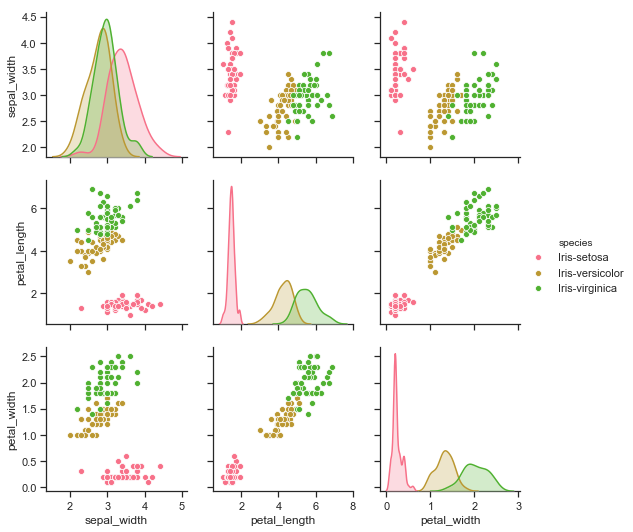

In [4]:
# https://seaborn.pydata.org/generated/seaborn.pairplot.html
sns.pairplot(df.iloc[:, 1:6], hue = "species");

In [5]:
df['labels'] = df['species'].astype('category').cat.codes
x = df[['sepal_length', 'sepal_width', 'petal_length', 'petal_width']]
y = df['labels']
# Convert class vectors to binary class matrices using 1 hot encoding.
# 0 ---> 1, 0, 0
# 1 ---> 0, 1, 0
# 2 ---> 0, 0, 1
num_classes = len(y.unique())
y = keras.utils.to_categorical(y, len(y.unique()))

x = np.asarray(x)
y = np.asarray(y)

x = x.reshape(len(x), 4, 1)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.33, shuffle = True)

# history class

In [6]:
# Define a callback class which is to be passed to the model fitting function
# as an element of a list of possible callbacks.
class AccuracyHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs = {}):
        self.acc = []
        self.val_acc = []
    def on_epoch_end(self, batch, logs = {}):
        self.acc.append(logs.get('acc'))
        self.val_acc.append(logs.get('val_acc'))

history = AccuracyHistory()

# checkpoints

In [7]:
#checkpoint = keras.callbacks.ModelCheckpoint(
#    filepath       = 'best_model.{epoch:02d}-{val_loss:.2f}.h5',
#    monitor        = 'val_loss',
#    save_best_only = True
#)

# model and training

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303       
Total params: 3,731
Trainable params: 3,731
Non-trainable params: 0
_________________________________________________________________


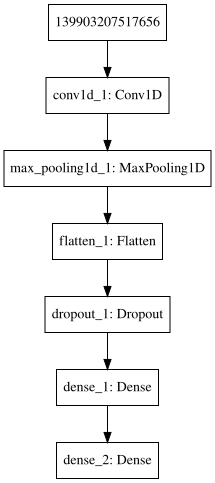

In [7]:
model = Sequential()
model.add(Conv1D(32, (3), input_shape = (4, 1), activation = 'tanh'))
model.add(MaxPooling1D(pool_size = (2)))
model.add(Flatten())
model.add(Dropout(rate = 0.5))
model.add(Dense(100,                            activation = 'tanh'))
model.add(Dense(num_classes,                    activation = 'softmax'))
model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = ['accuracy'])
plot_model(model, to_file = "model.png")
model.summary()
SVG(model_to_dot(model).create(prog='dot', format='svg'))

2019-06-11T180837Z
test loss: 0.024347928687930107
test accuracy: 1.0
max. test accuracy observed: 1.0
max. test accuracy history index: 35


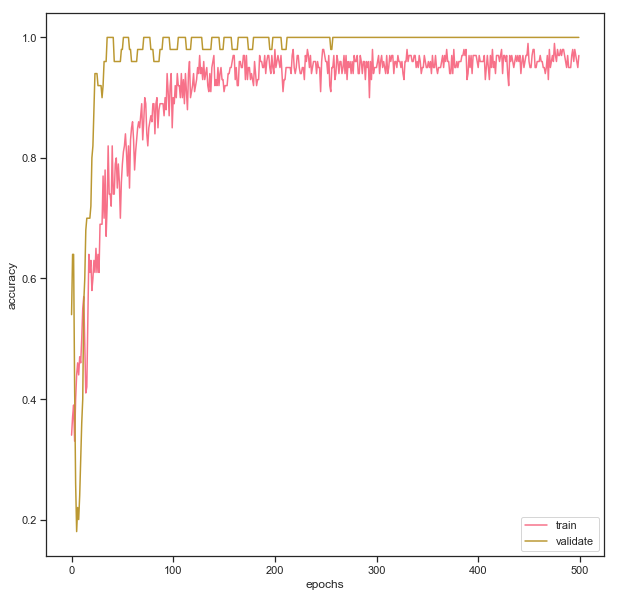

CPU times: user 3.79 s, sys: 1.25 s, total: 5.05 s
Wall time: 2.92 s


In [8]:
%%time
epochs     = 500
batch_size = 128

model.fit(
    x_train,
    y_train,
    batch_size      = batch_size,
    epochs          = epochs,
    verbose         = False,
    validation_data = (x_test, y_test),
    callbacks       = [history]
)

score = model.evaluate(x_test, y_test, verbose = False)

print(datetime.datetime.utcnow().strftime("%Y-%m-%dT%H%M%SZ"))
print('test loss:', score[0])
print('test accuracy:', score[1])
print('max. test accuracy observed:', max(history.val_acc))
print('max. test accuracy history index:', history.val_acc.index(max(history.val_acc)))
plt.plot(history.acc, label='train')
plt.plot(history.val_acc, label='validate')
plt.legend()
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.show()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 4, 100)            200       
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2, 32)             9632      
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 100)               3300      
_________________________________________________________________
dropout_3 (Dropout)          (None, 100)               0         
__________

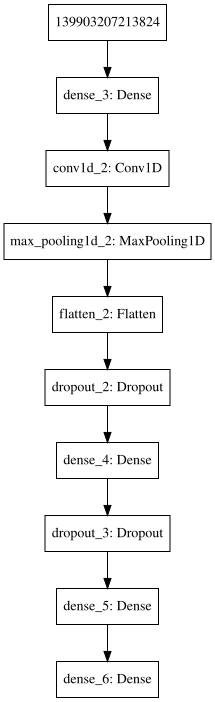

In [9]:
model = Sequential()
model.add(Dense(100, input_shape = (4, 1),      activation = 'tanh'))
model.add(Conv1D(32, (3), input_shape = (4, 1), activation = 'tanh'))
model.add(MaxPooling1D(pool_size = (2)))
model.add(Flatten())
model.add(Dropout(rate = 0.5))
model.add(Dense(100,                            activation = 'tanh'))
model.add(Dropout(rate = 0.5))
model.add(Dense(100,                            activation = 'tanh'))
model.add(Dense(num_classes,                    activation = 'softmax'))
model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = ['accuracy'])
plot_model(model, to_file = "model.png")
model.summary()
SVG(model_to_dot(model).create(prog='dot', format='svg'))

2019-06-11T180928Z
test loss: 0.008009069385007023
test accuracy: 1.0
max. test accuracy observed: 1.0
max. test accuracy history index: 18


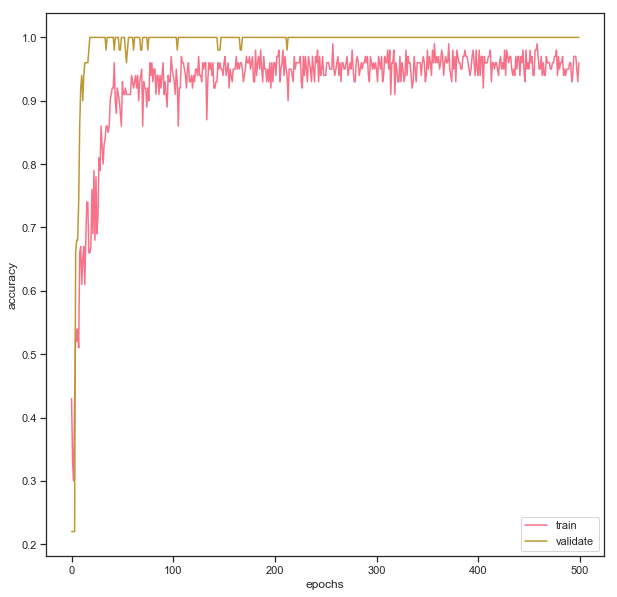

CPU times: user 3.83 s, sys: 954 ms, total: 4.79 s
Wall time: 2.57 s


In [10]:
%%time
epochs     = 500
batch_size = 128

model.fit(
    x_train,
    y_train,
    batch_size      = batch_size,
    epochs          = epochs,
    verbose         = False,
    validation_data = (x_test, y_test),
    callbacks       = [history]
)

score = model.evaluate(x_test, y_test, verbose = False)

print(datetime.datetime.utcnow().strftime("%Y-%m-%dT%H%M%SZ"))
print('test loss:', score[0])
print('test accuracy:', score[1])
print('max. test accuracy observed:', max(history.val_acc))
print('max. test accuracy history index:', history.val_acc.index(max(history.val_acc)))
plt.plot(history.acc, label='train')
plt.plot(history.val_acc, label='validate')
plt.legend()
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.show()

# hyperparameter scan using Talos

- [Talos examples](https://nbviewer.jupyter.org/github/autonomio/talos/blob/master/examples/Hyperparameter%20Optimization%20with%20Keras%20for%20the%20Iris%20Prediction.ipynb#six)

  0%|          | 0/128 [00:00<?, ?it/s]

start: 2019-05-28T165449Z
{'batch_size': 128, 'epochs': 700, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_2 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_4 (Dense)              (Non

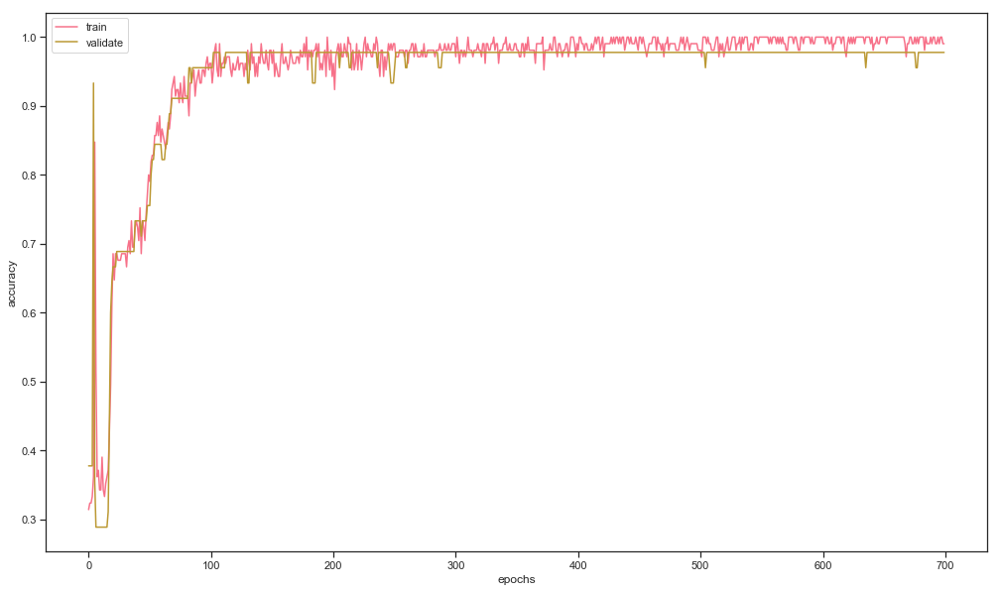

  1%|          | 1/128 [00:02<05:36,  2.65s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

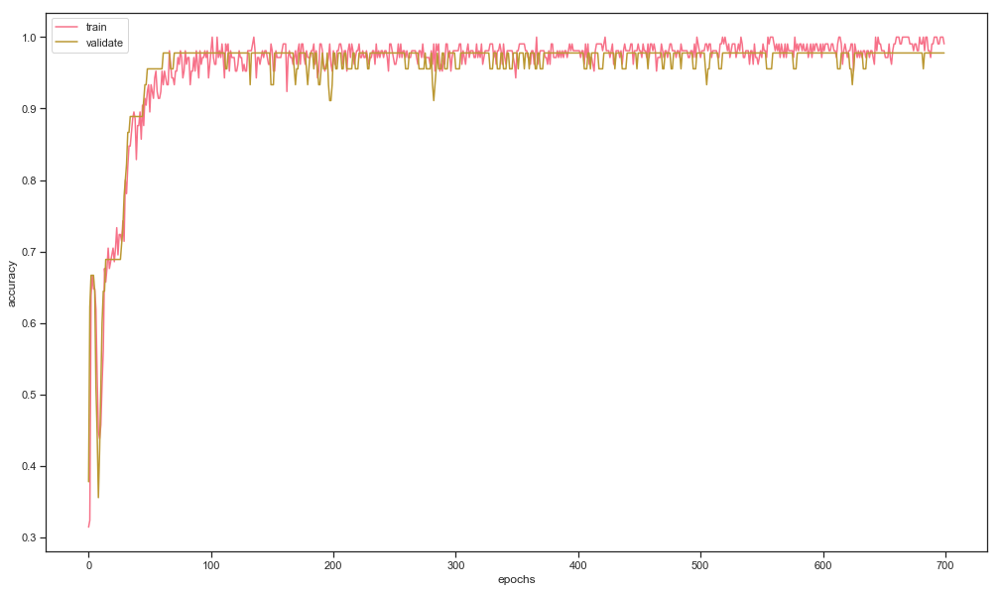

  2%|▏         | 2/128 [00:05<05:34,  2.65s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603

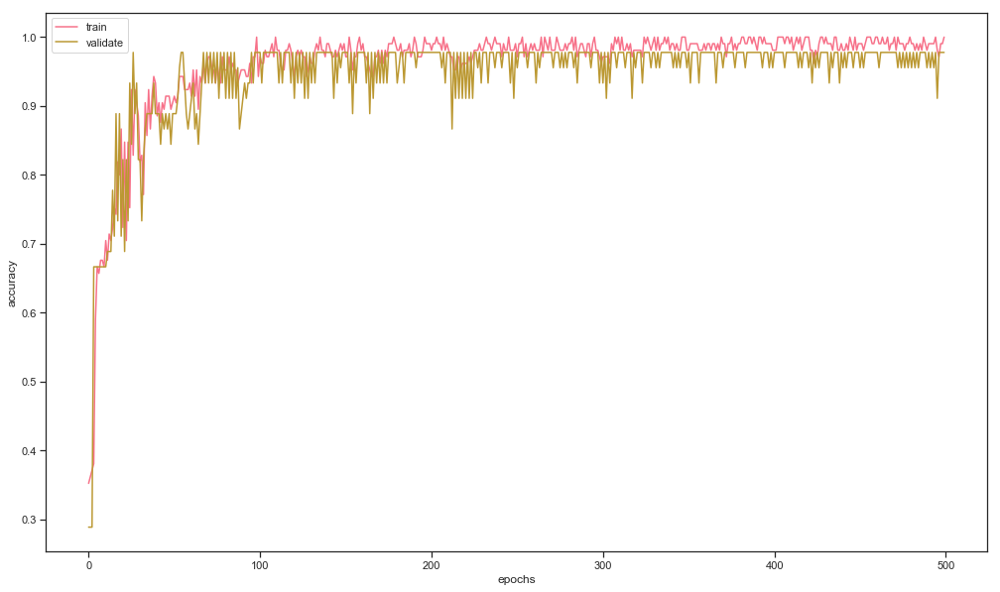

  2%|▏         | 3/128 [00:07<05:15,  2.52s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

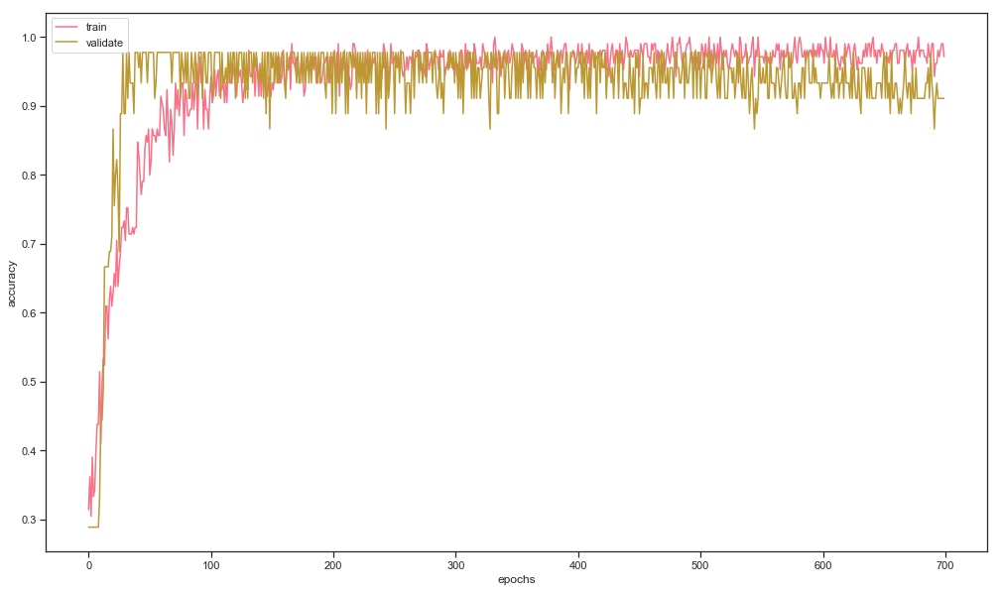

  3%|▎         | 4/128 [00:10<05:26,  2.63s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

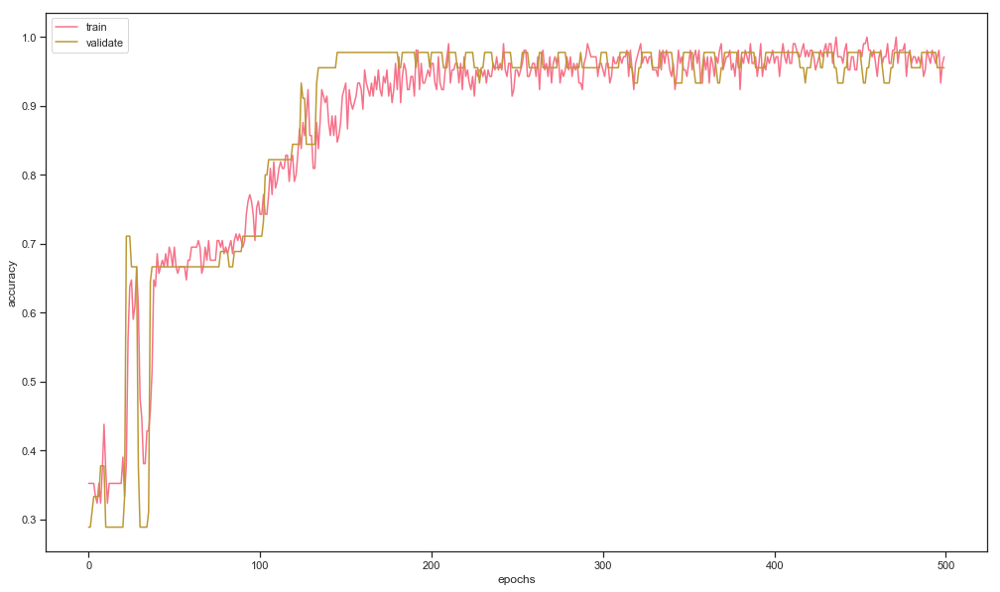

  4%|▍         | 5/128 [00:12<05:05,  2.48s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

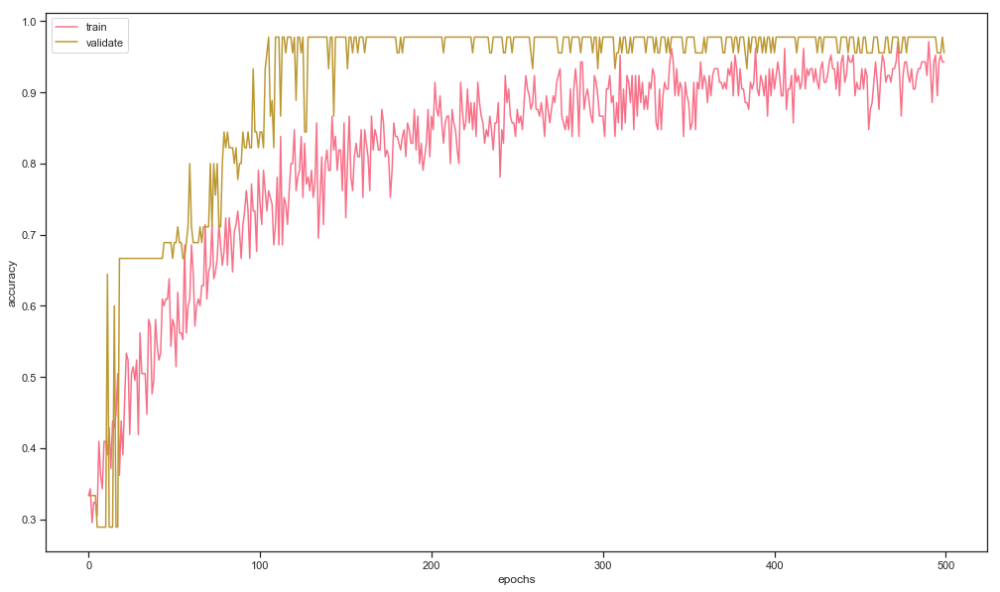

  5%|▍         | 6/128 [00:14<04:52,  2.40s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303  

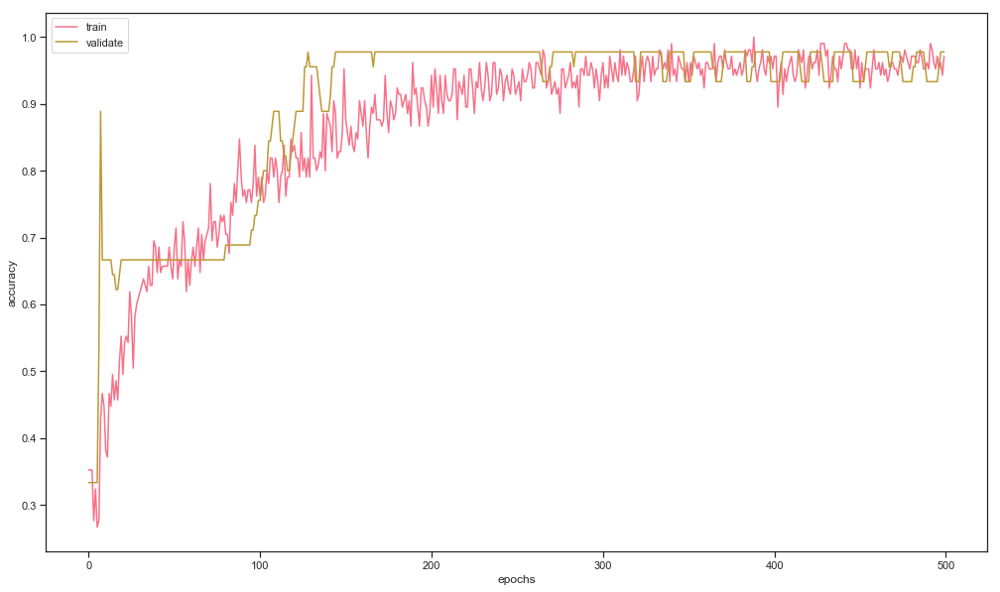

  5%|▌         | 7/128 [00:16<04:41,  2.33s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

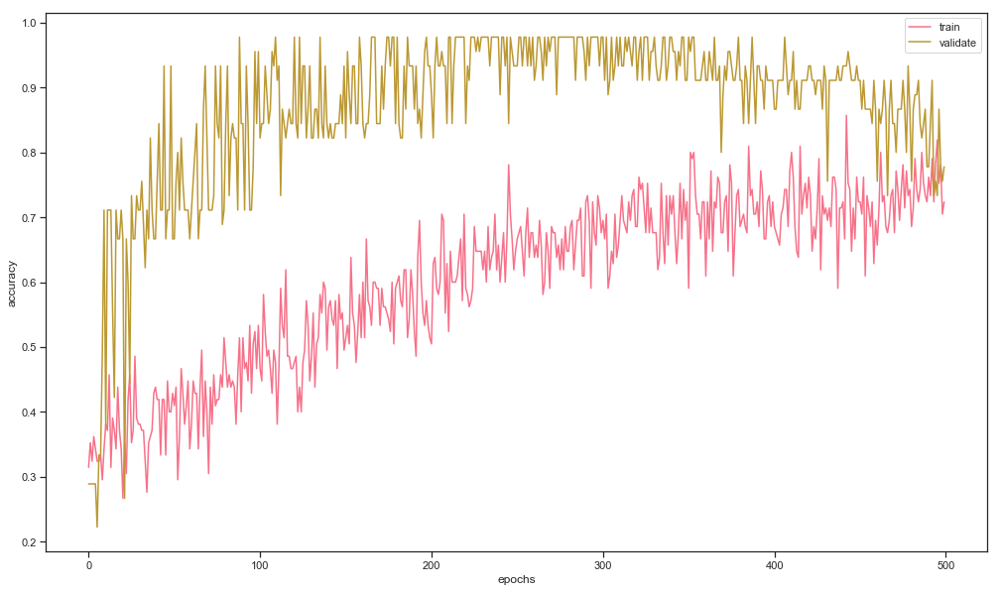

  6%|▋         | 8/128 [00:19<04:36,  2.30s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

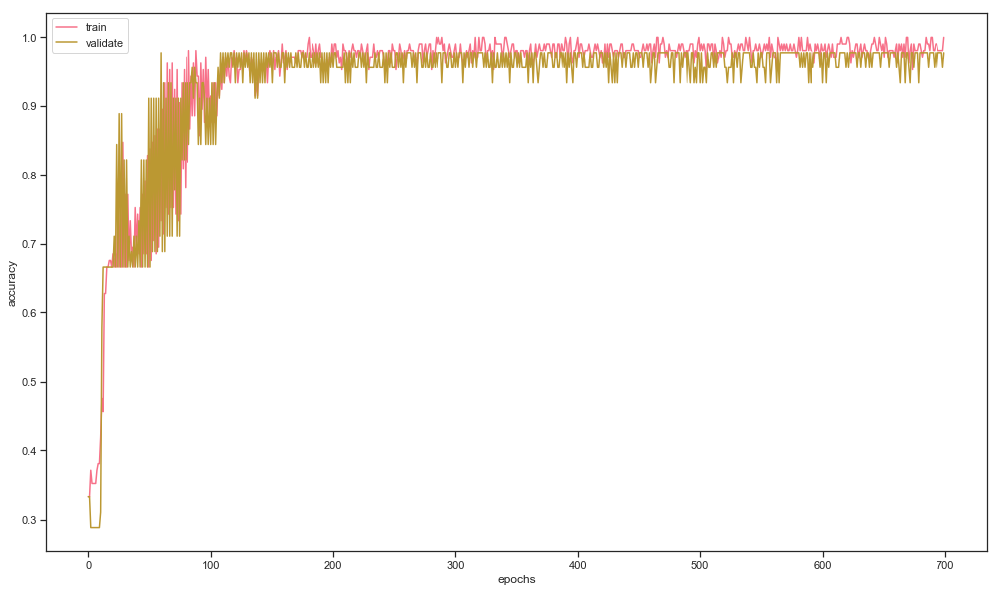

  7%|▋         | 9/128 [00:22<04:55,  2.48s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303

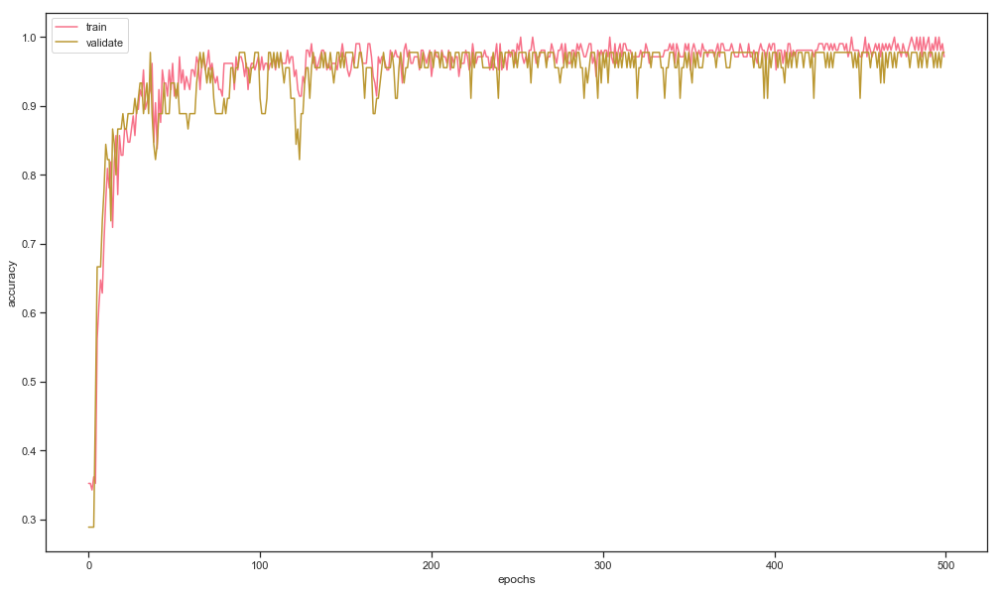

  8%|▊         | 10/128 [00:24<04:43,  2.40s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

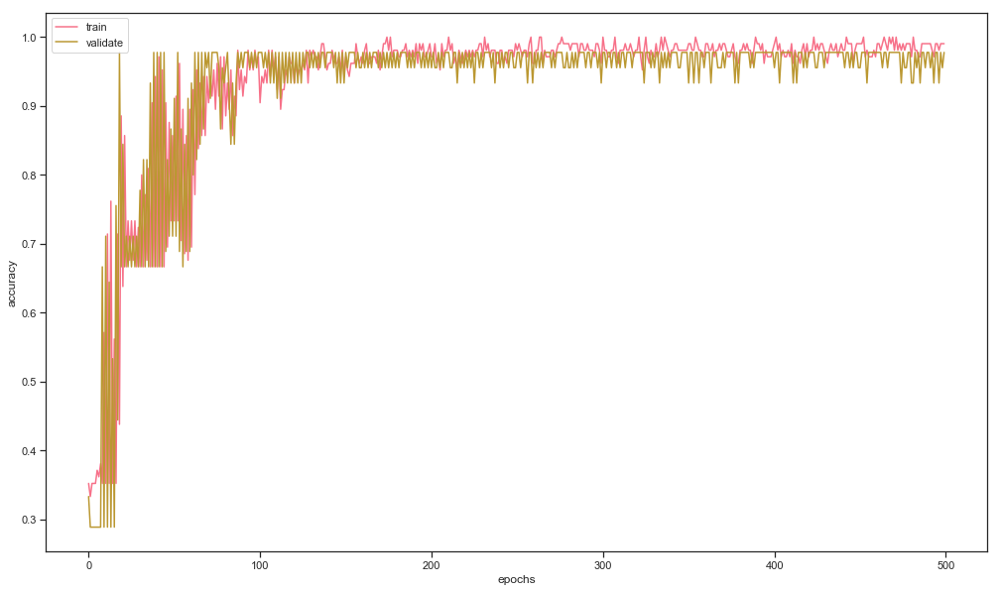

  9%|▊         | 11/128 [00:26<04:37,  2.37s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

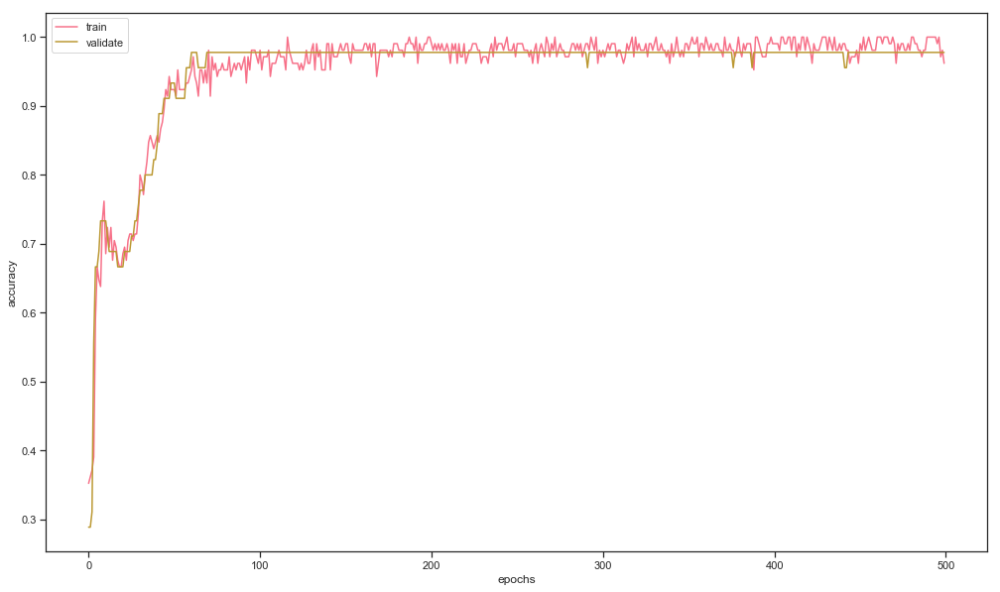

  9%|▉         | 12/128 [00:28<04:24,  2.28s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303

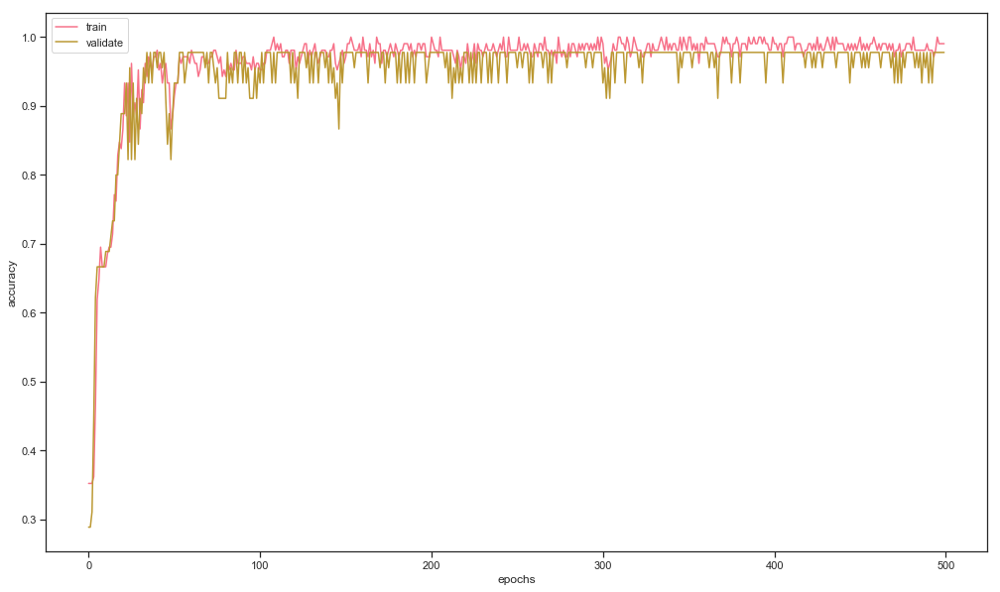

 10%|█         | 13/128 [00:30<04:23,  2.29s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303  

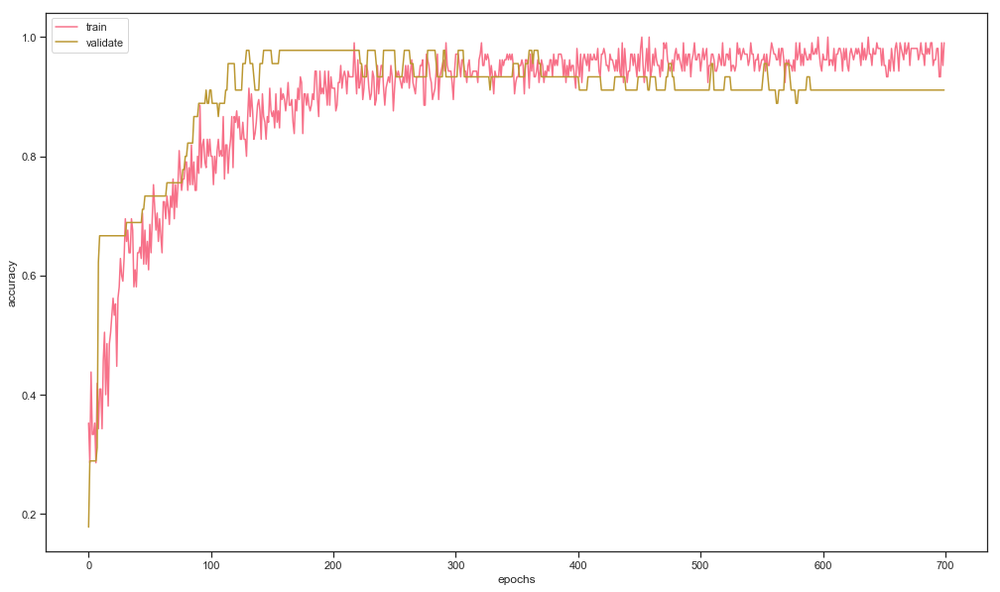

 11%|█         | 14/128 [00:33<04:32,  2.39s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

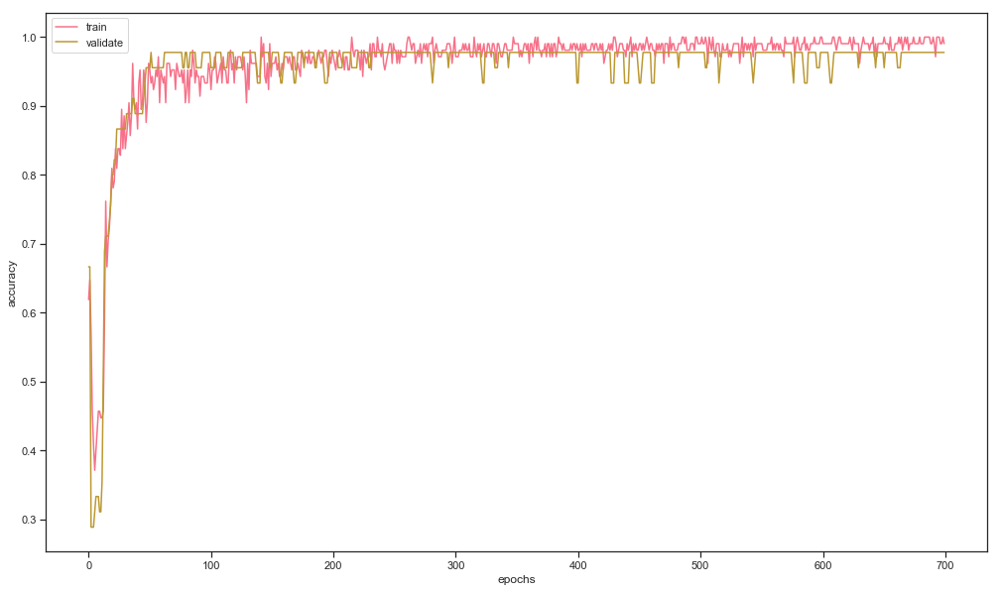

 12%|█▏        | 15/128 [00:36<04:40,  2.49s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

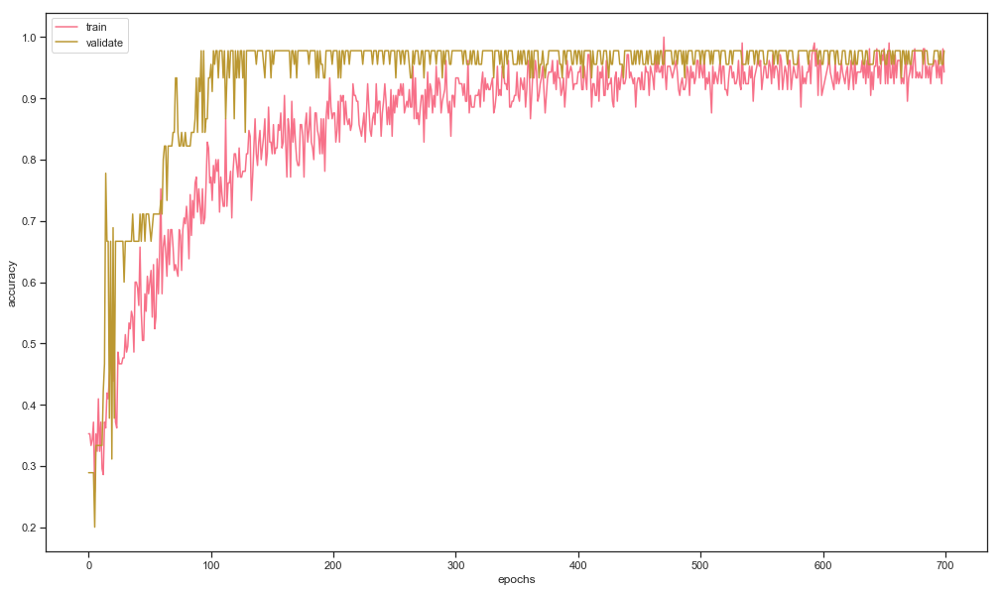

 12%|█▎        | 16/128 [00:39<04:49,  2.58s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603  

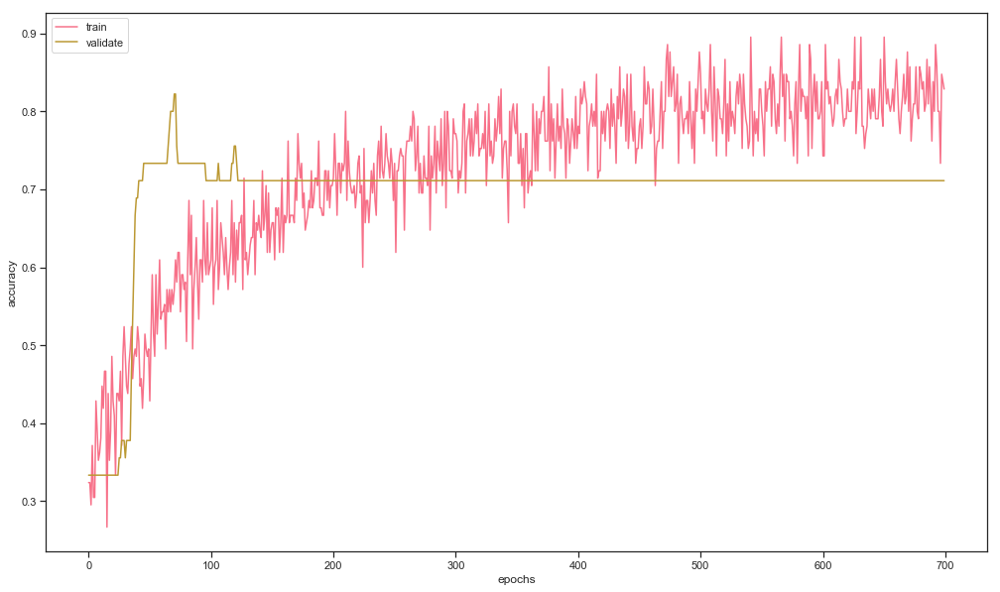

 13%|█▎        | 17/128 [00:41<04:51,  2.62s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

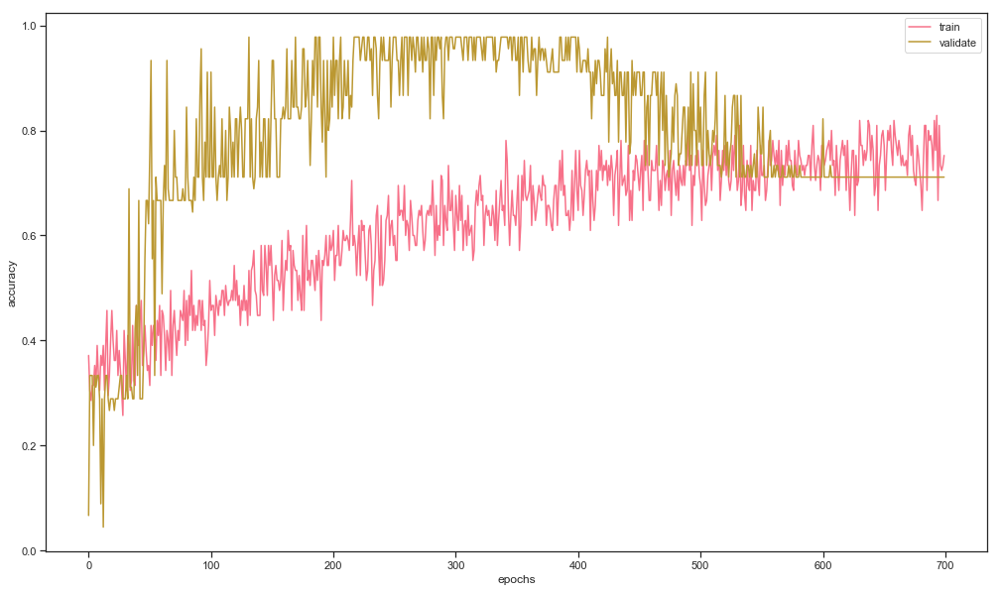

 14%|█▍        | 18/128 [00:44<04:54,  2.68s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

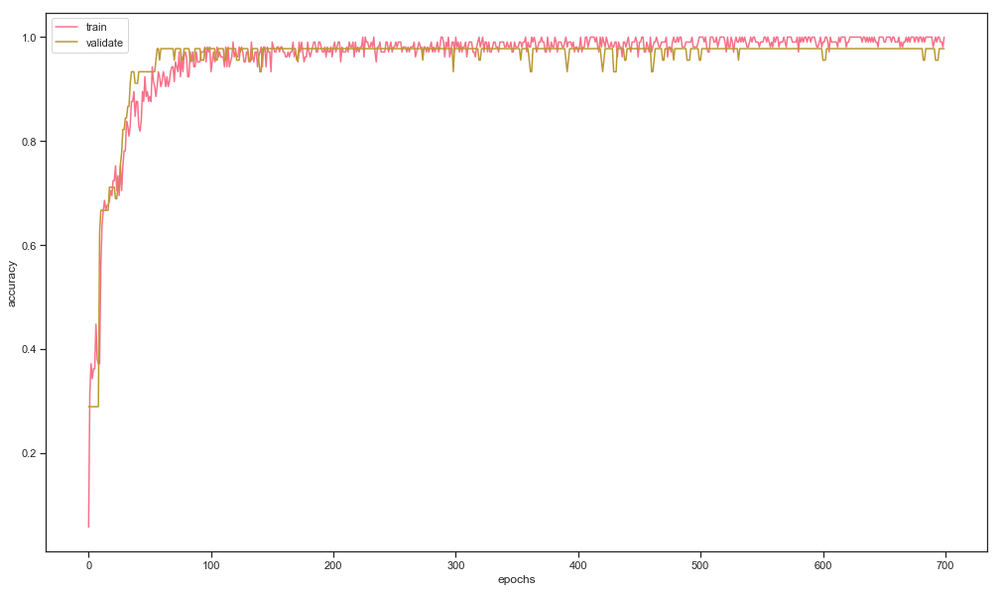

 15%|█▍        | 19/128 [00:47<04:52,  2.68s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303  

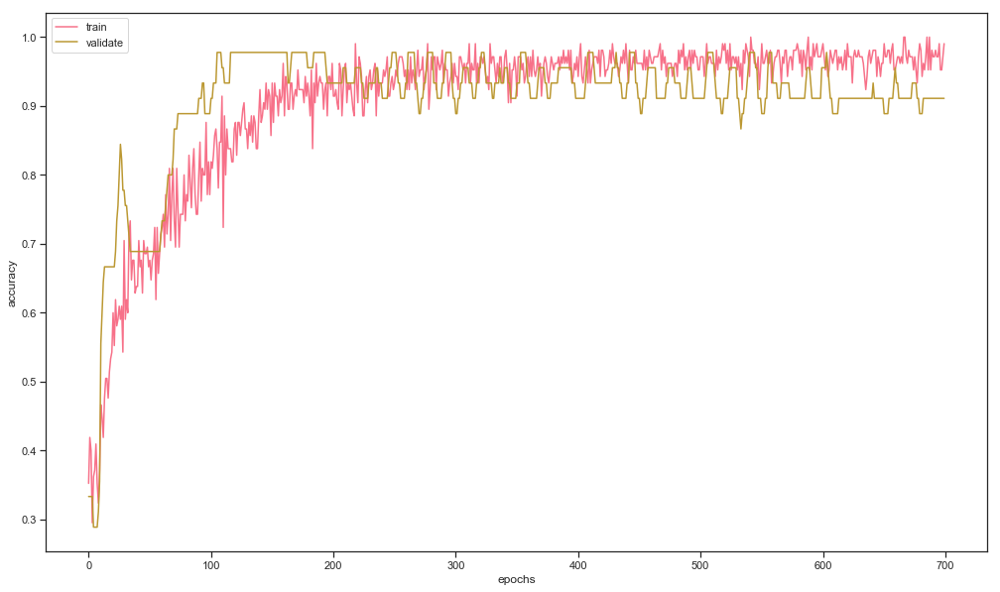

 16%|█▌        | 20/128 [00:49<04:48,  2.67s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

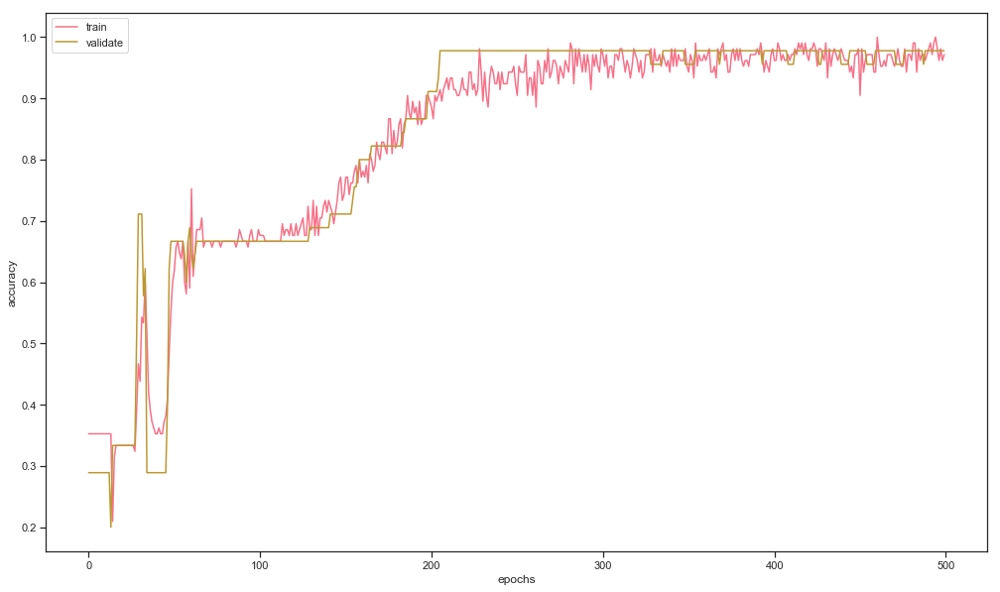

 16%|█▋        | 21/128 [00:52<04:25,  2.48s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 30

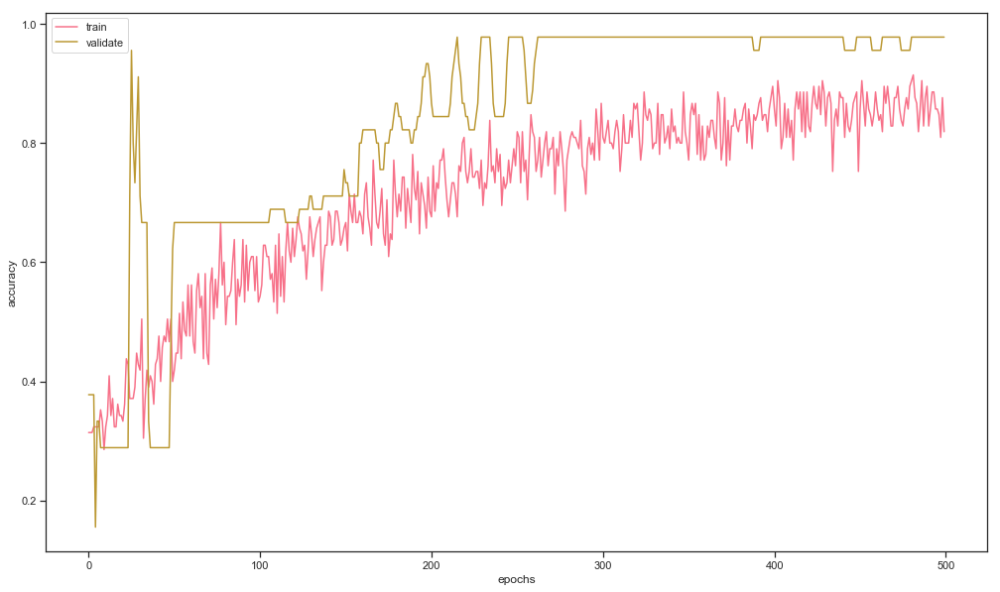

 17%|█▋        | 22/128 [00:54<04:13,  2.39s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

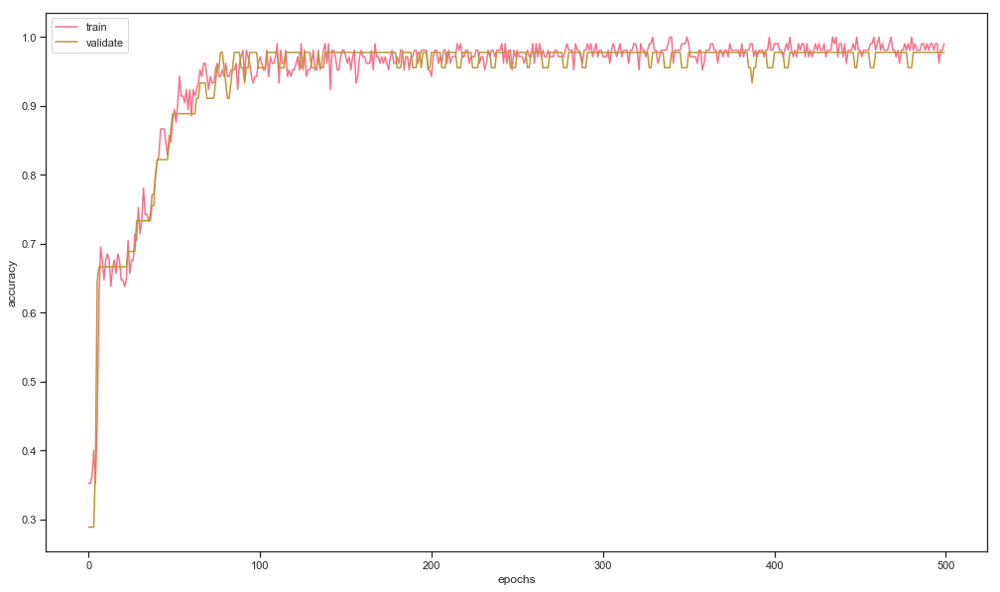

 18%|█▊        | 23/128 [00:56<04:02,  2.31s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

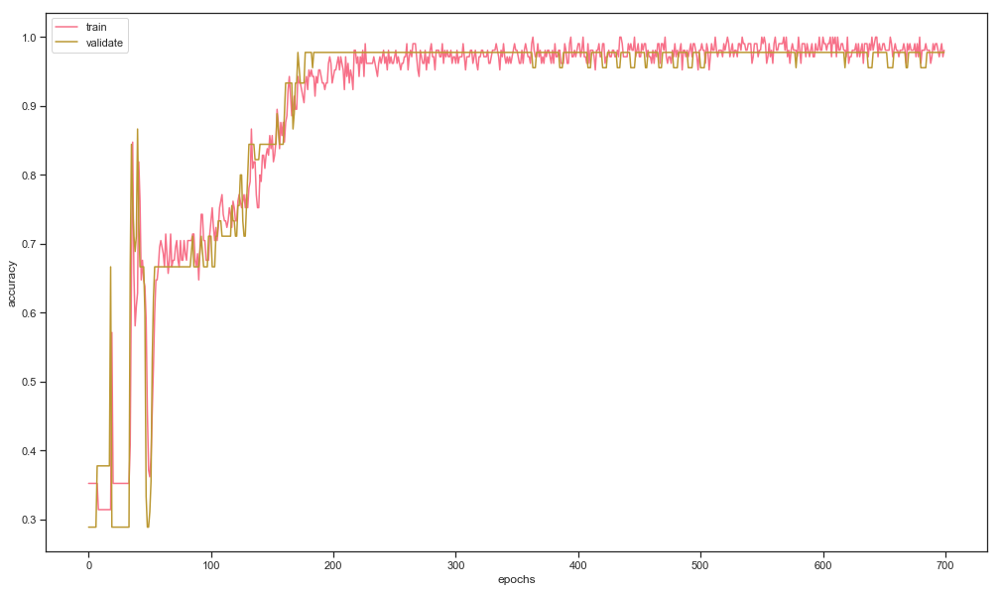

 19%|█▉        | 24/128 [00:58<04:10,  2.41s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

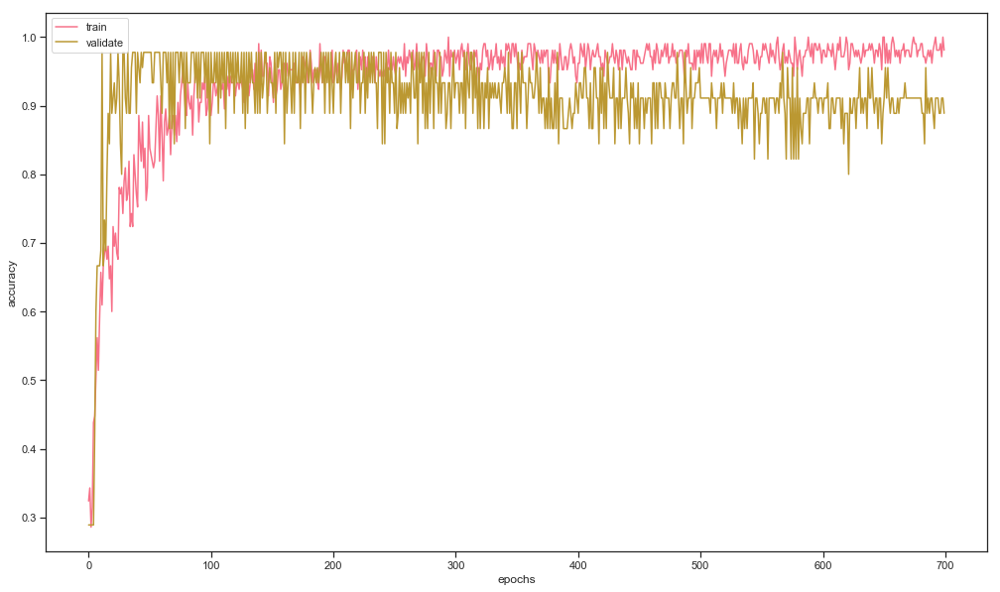

 20%|█▉        | 25/128 [01:01<04:20,  2.53s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

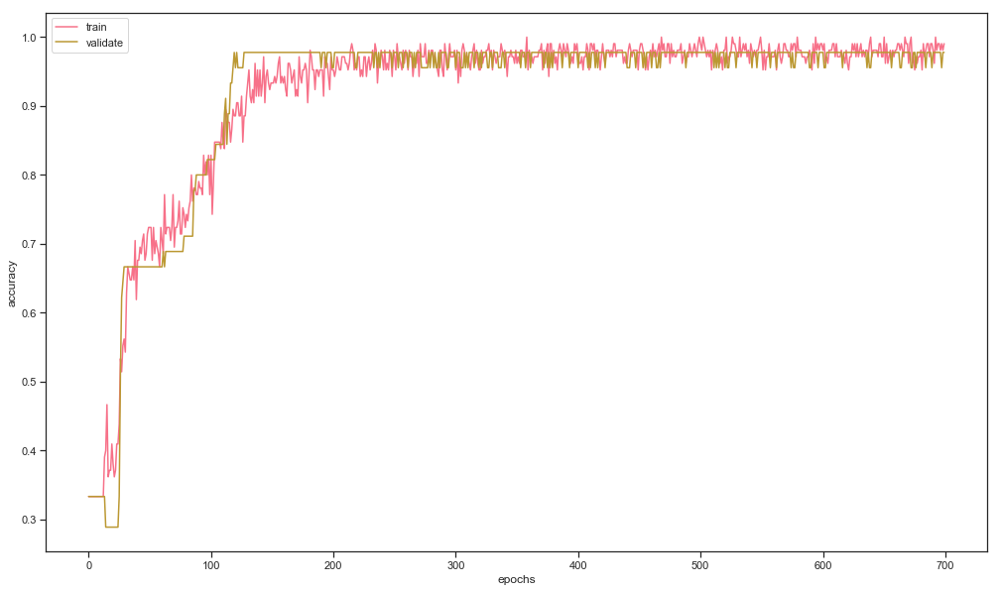

 20%|██        | 26/128 [01:04<04:29,  2.64s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603  

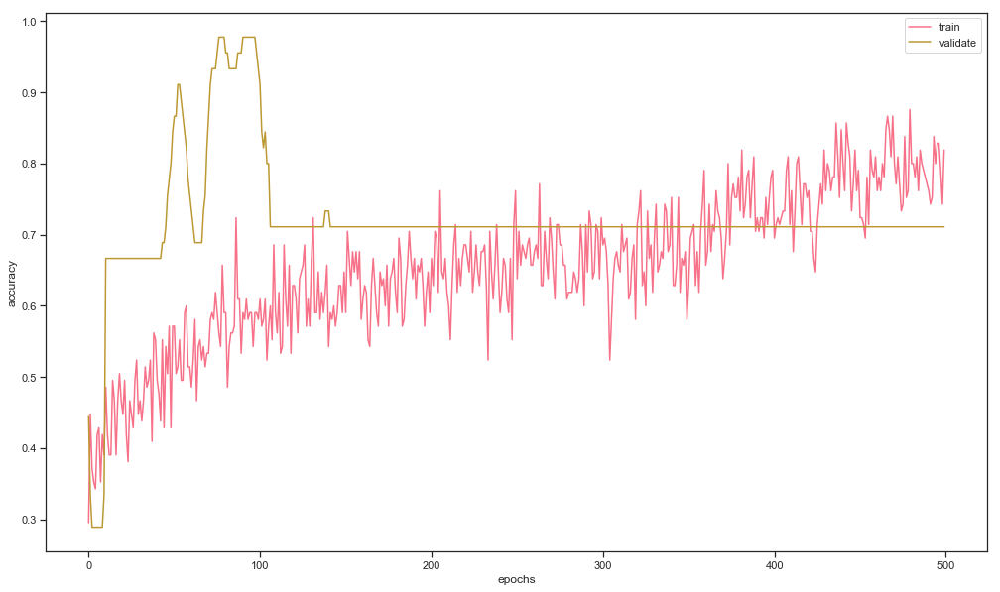

 21%|██        | 27/128 [01:06<04:12,  2.50s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303  

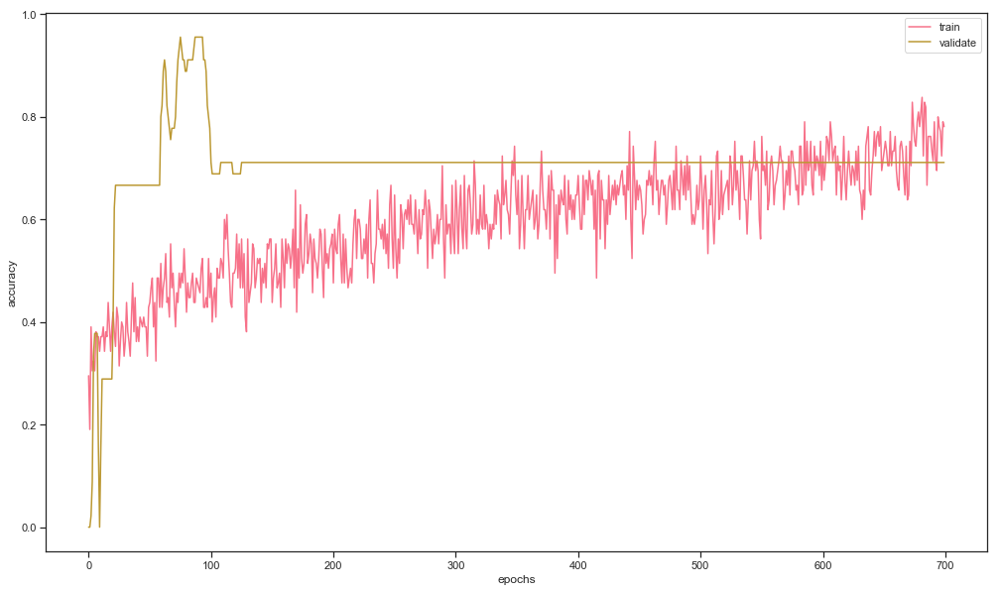

 22%|██▏       | 28/128 [01:09<04:13,  2.53s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

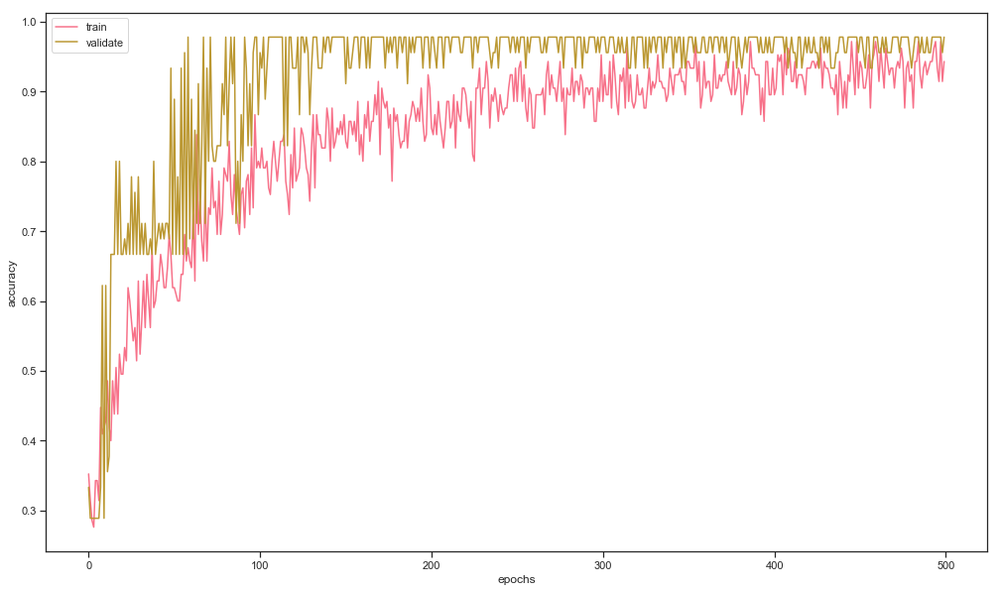

 23%|██▎       | 29/128 [01:11<04:01,  2.44s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

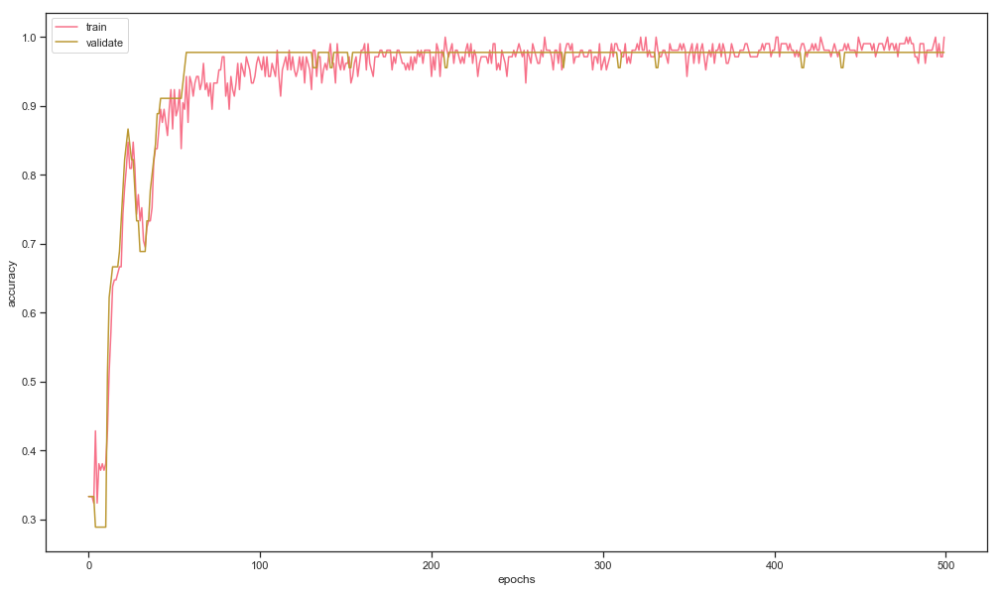

 23%|██▎       | 30/128 [01:13<03:51,  2.36s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

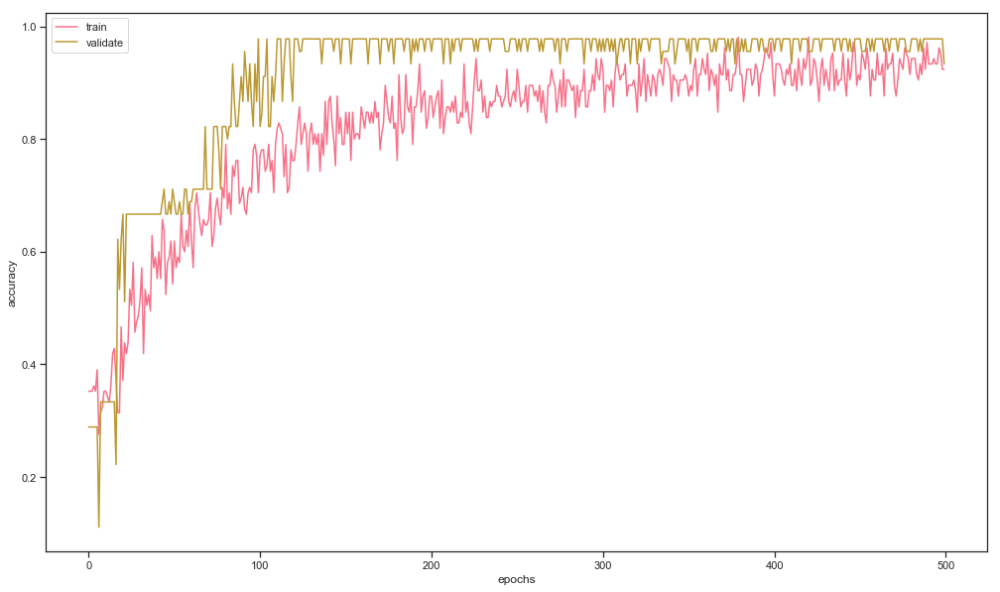

 24%|██▍       | 31/128 [01:16<03:46,  2.34s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 60

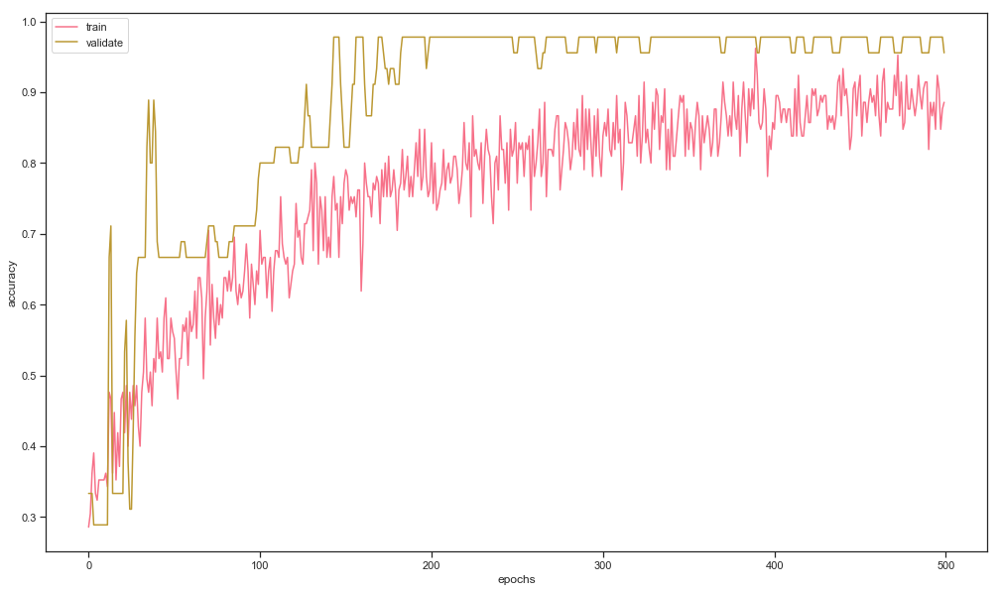

 25%|██▌       | 32/128 [01:18<03:37,  2.26s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

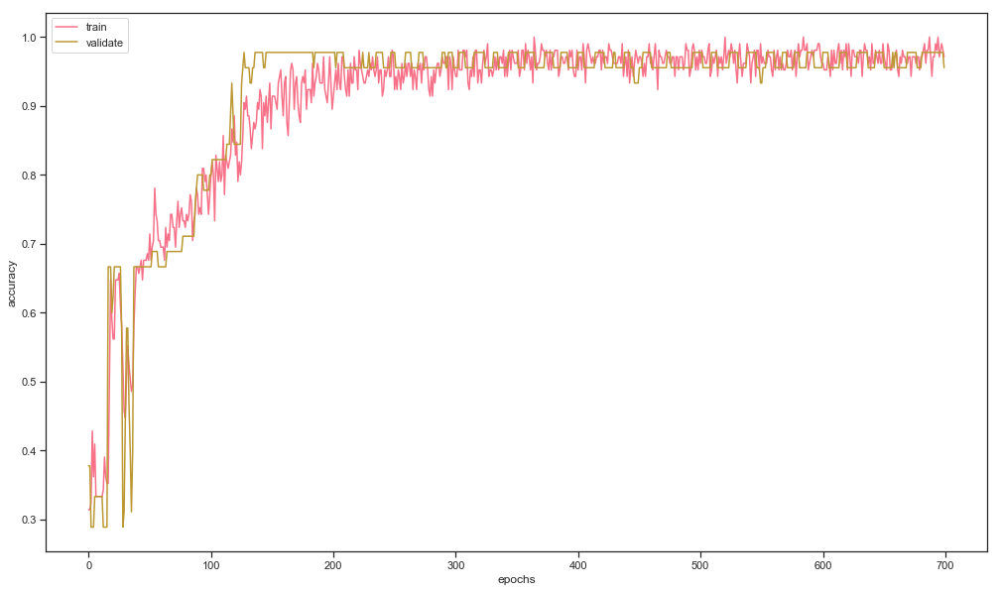

 26%|██▌       | 33/128 [01:20<03:47,  2.40s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303  

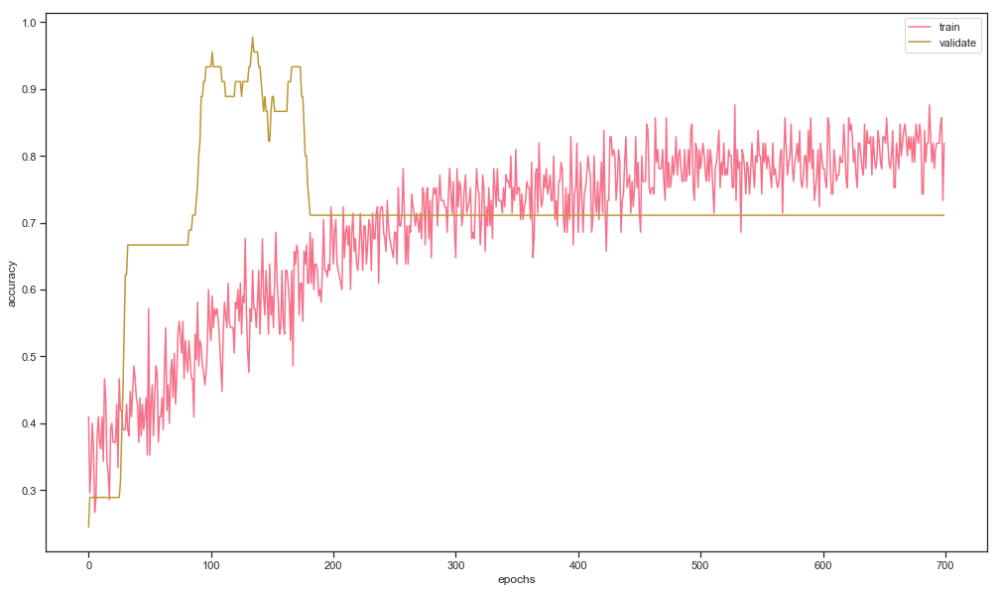

 27%|██▋       | 34/128 [01:23<03:52,  2.47s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

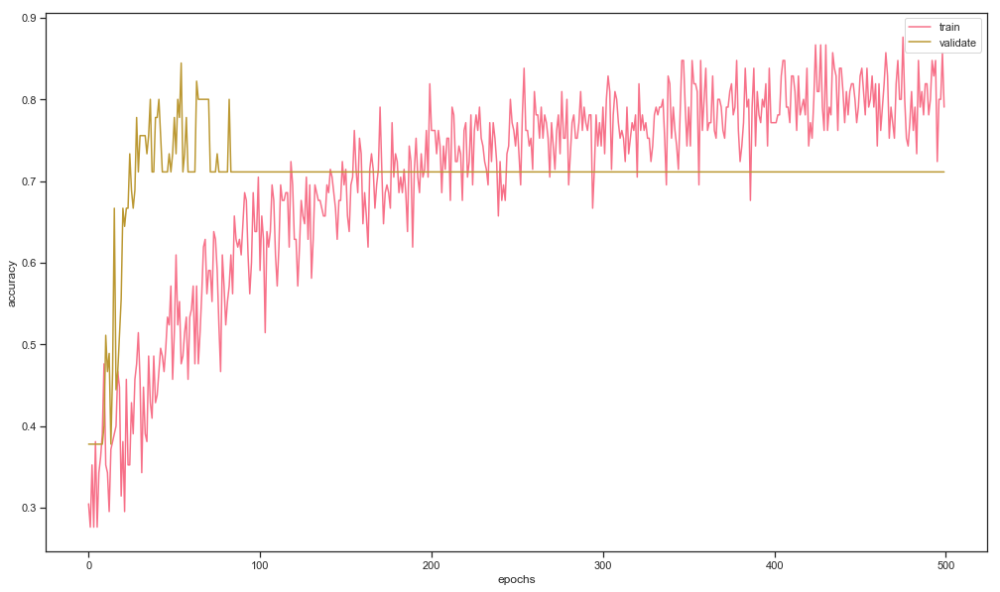

 27%|██▋       | 35/128 [01:25<03:42,  2.39s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603

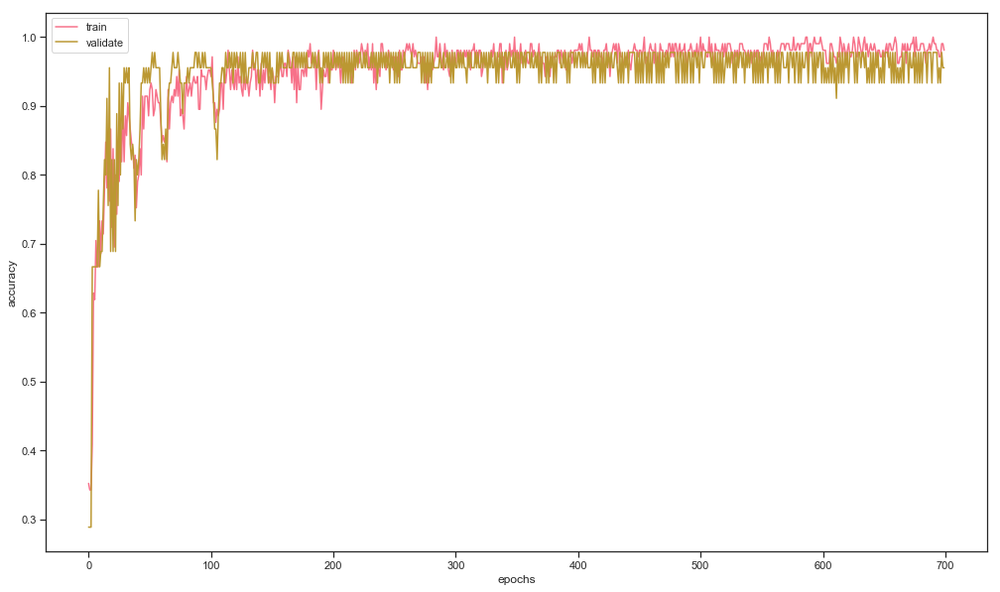

 28%|██▊       | 36/128 [01:28<03:54,  2.55s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

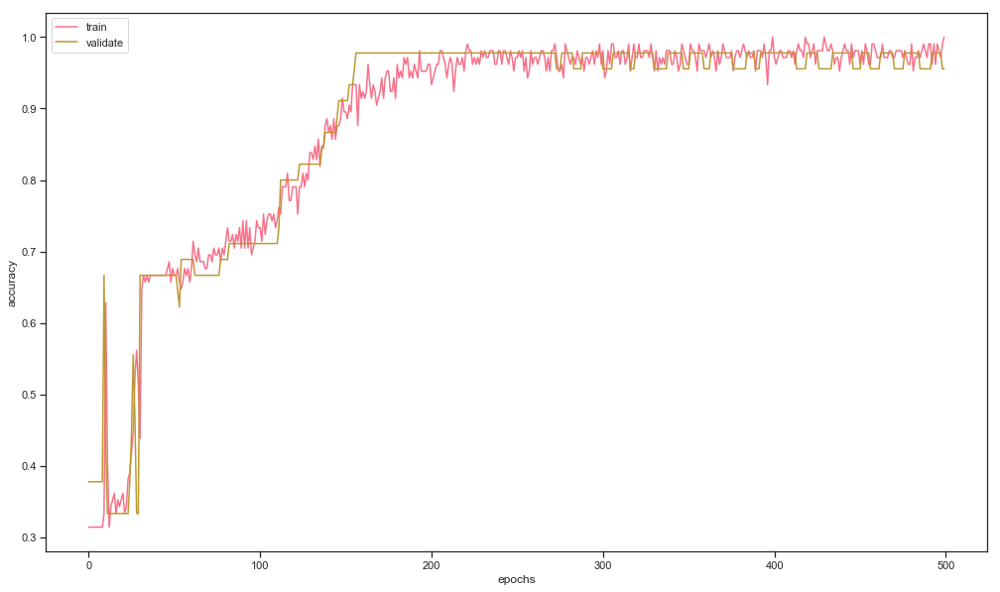

 29%|██▉       | 37/128 [01:30<03:41,  2.43s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

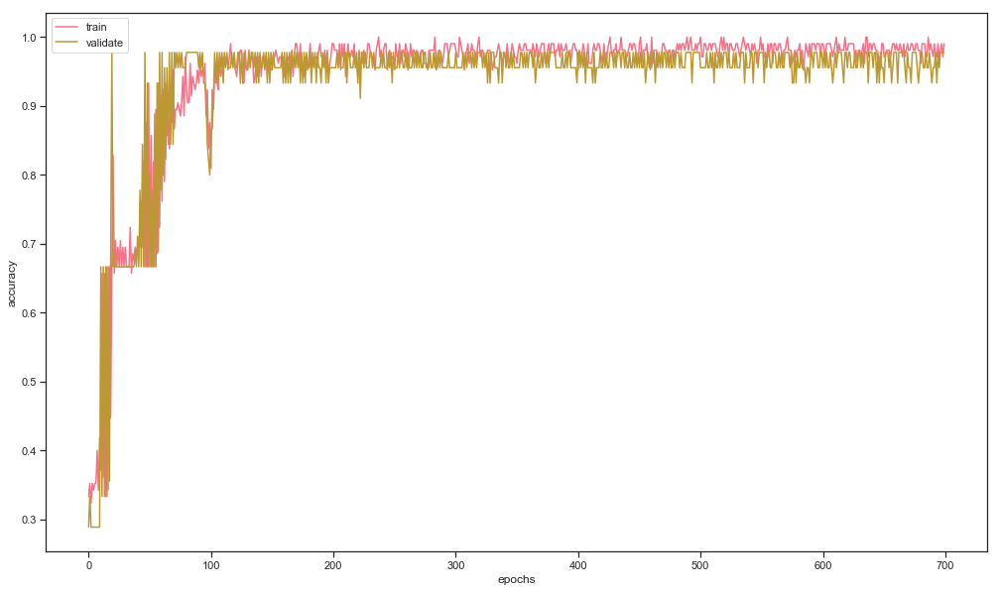

 30%|██▉       | 38/128 [01:33<03:48,  2.54s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

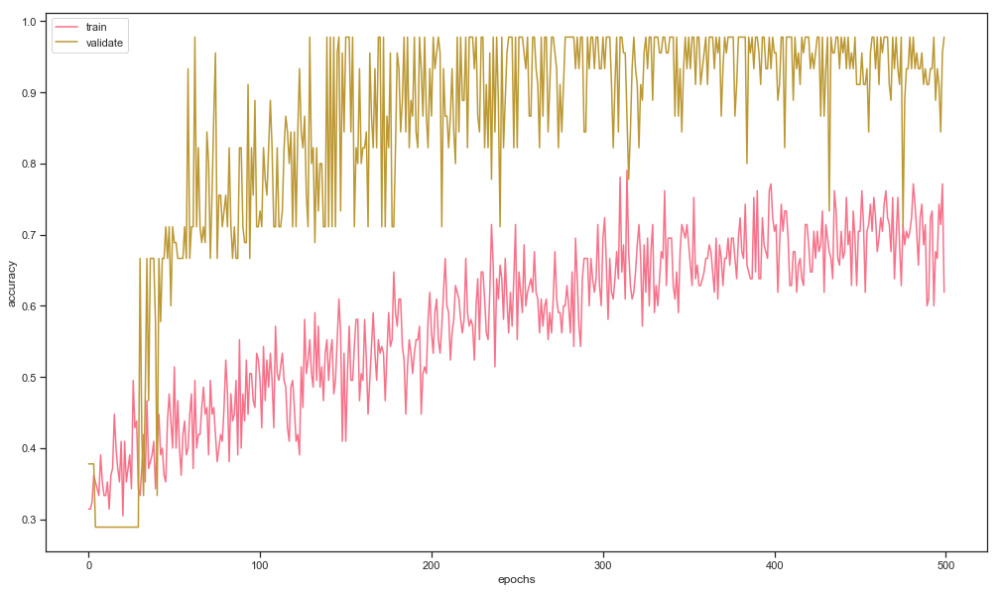

 30%|███       | 39/128 [01:35<03:41,  2.48s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603  

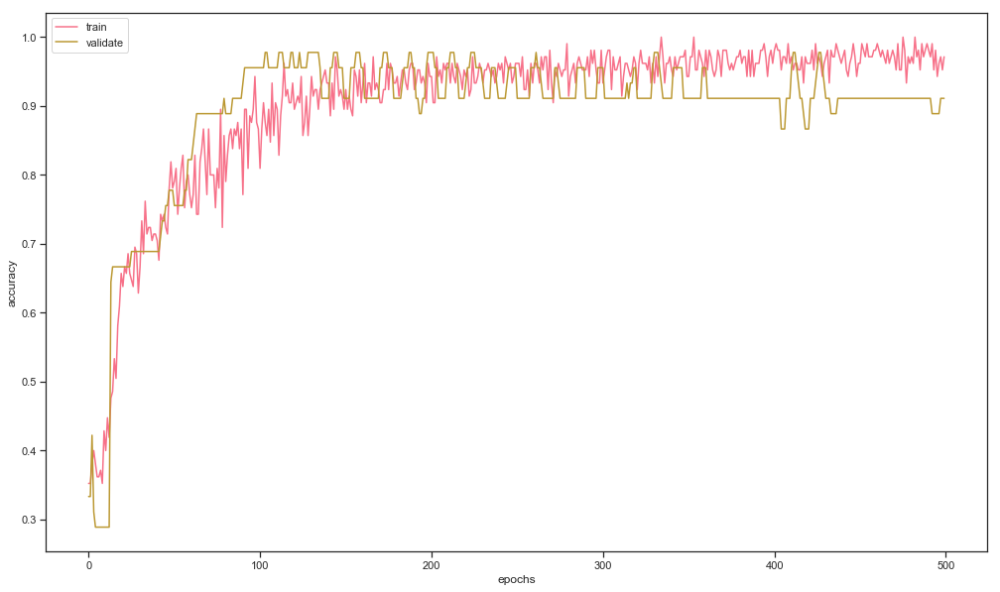

 31%|███▏      | 40/128 [01:38<03:27,  2.36s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

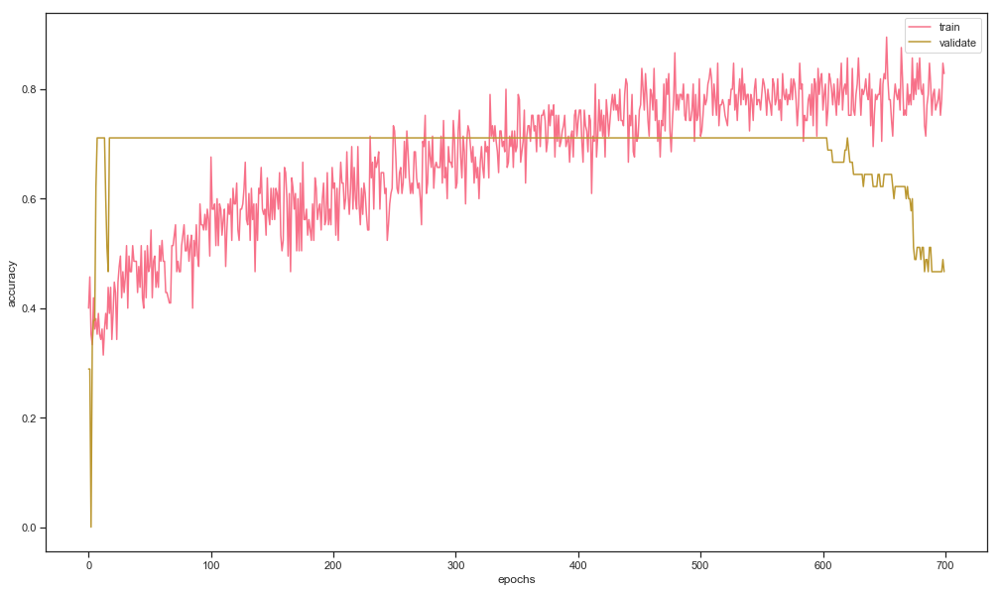

 32%|███▏      | 41/128 [01:40<03:39,  2.52s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

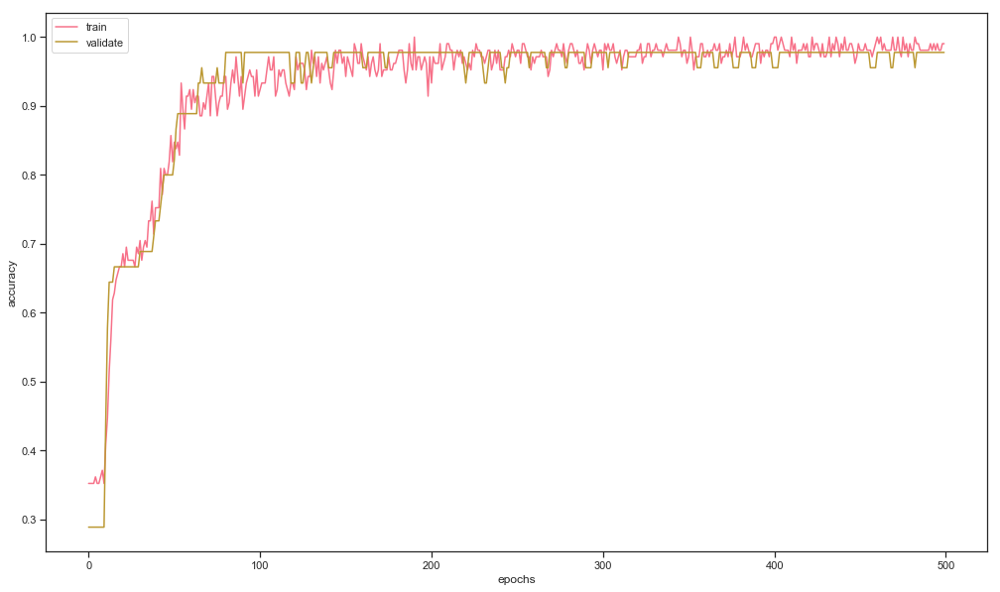

 33%|███▎      | 42/128 [01:43<03:25,  2.39s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303

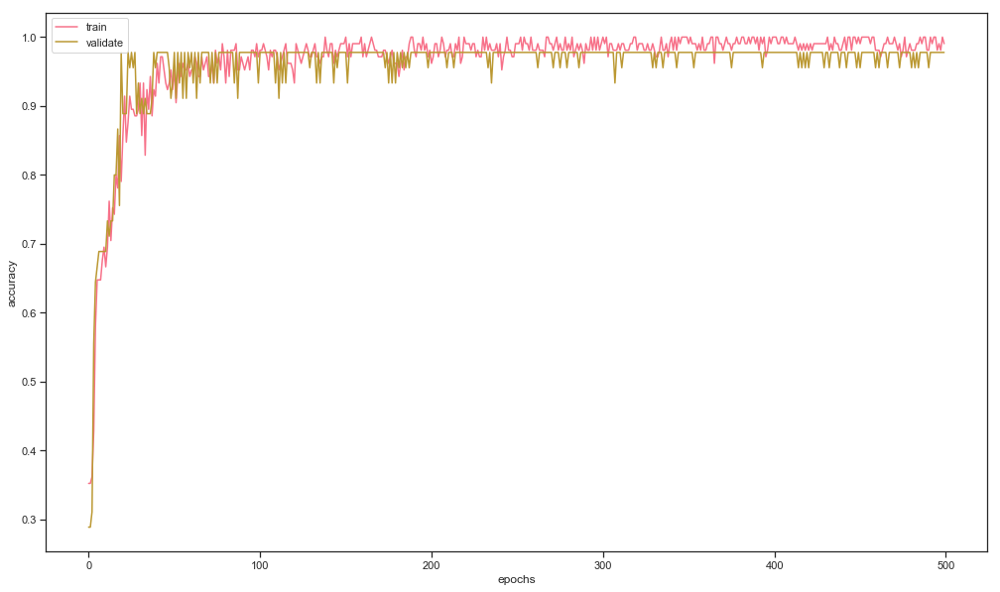

 34%|███▎      | 43/128 [01:45<03:20,  2.36s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

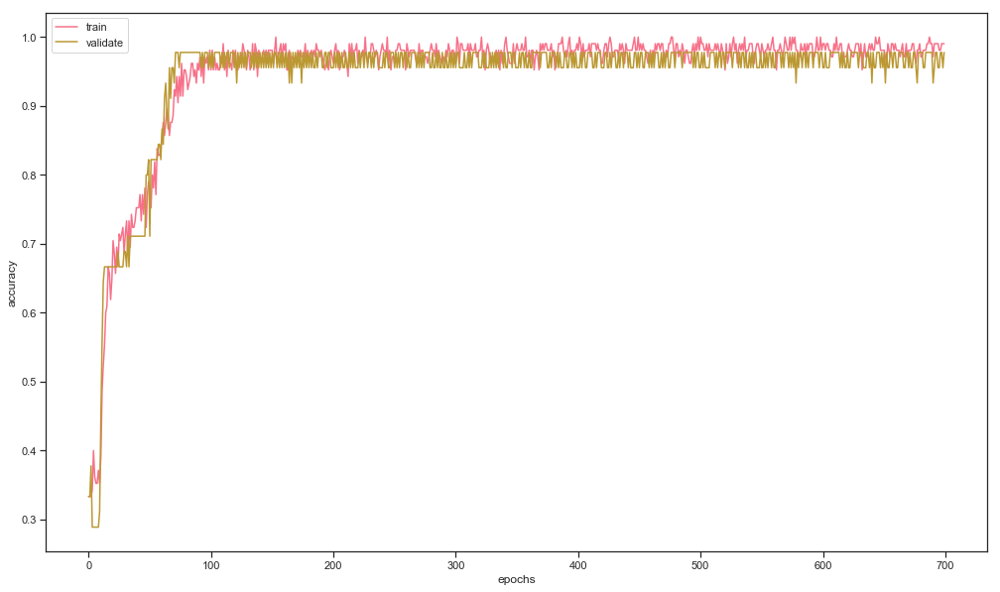

 34%|███▍      | 44/128 [01:48<03:29,  2.50s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

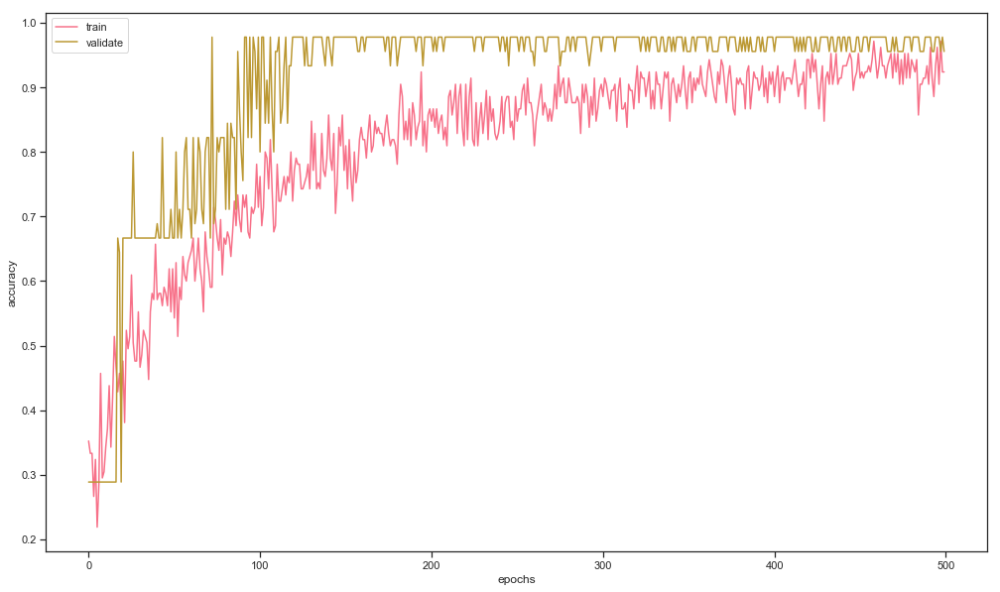

 35%|███▌      | 45/128 [01:50<03:22,  2.44s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 30

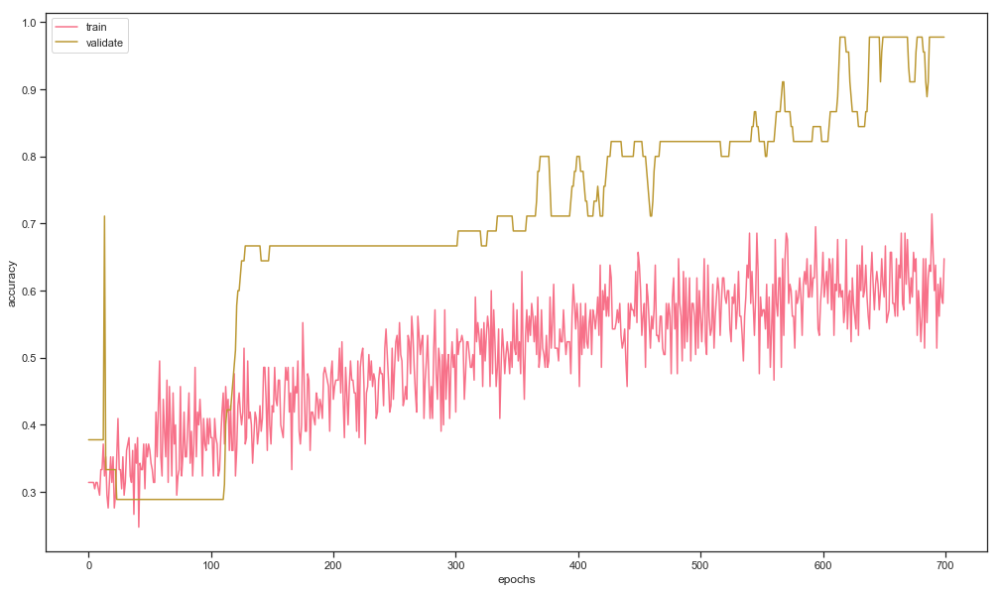

 36%|███▌      | 46/128 [01:53<03:25,  2.50s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 30

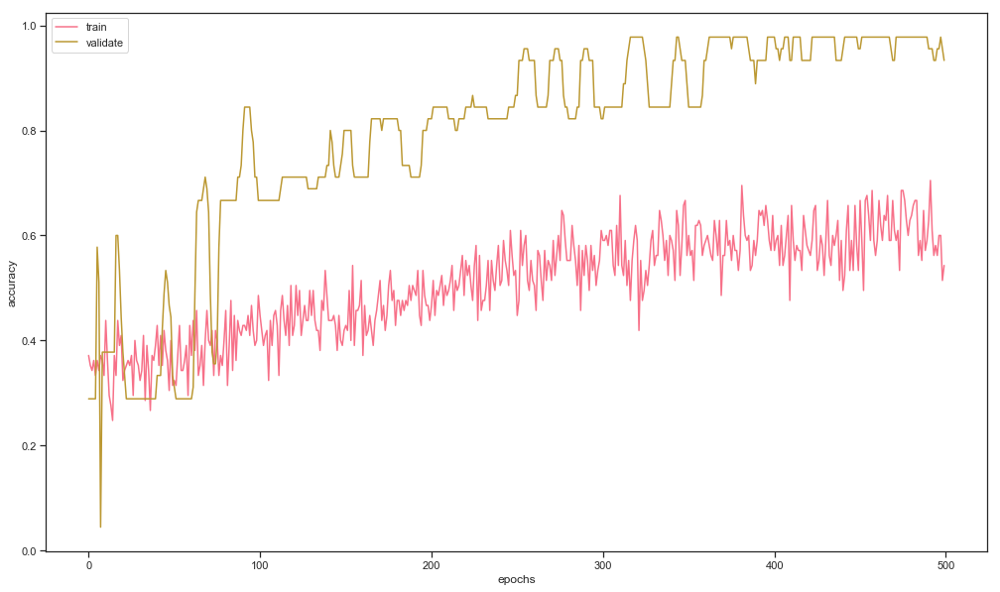

 37%|███▋      | 47/128 [01:55<03:14,  2.40s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

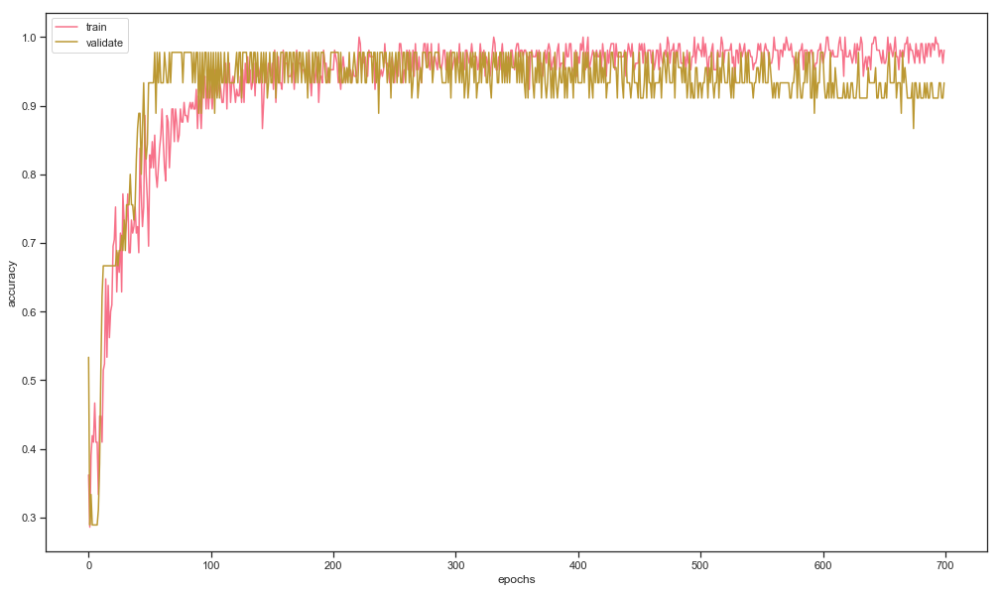

 38%|███▊      | 48/128 [01:58<03:22,  2.53s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

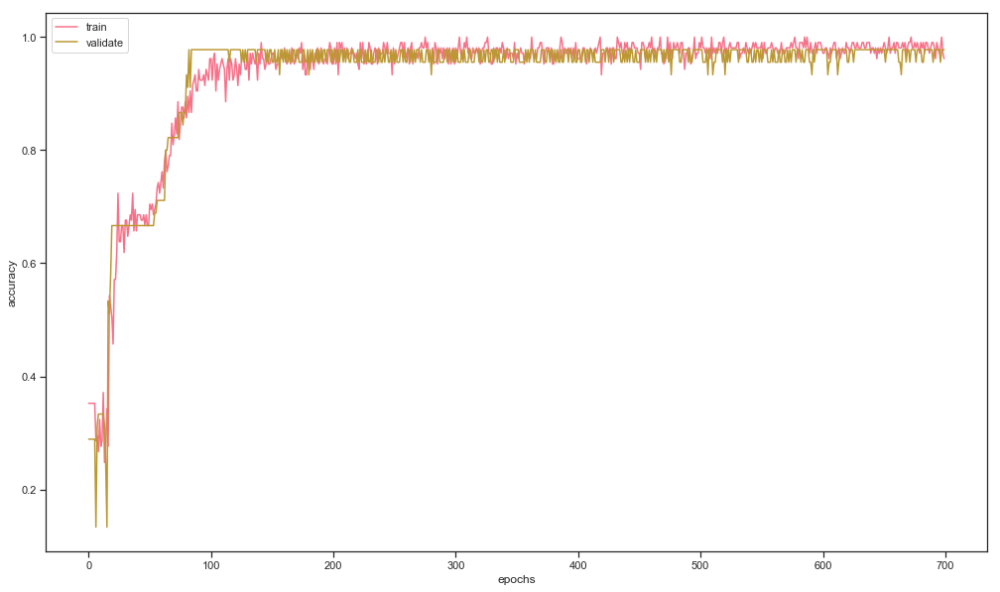

 38%|███▊      | 49/128 [02:01<03:28,  2.64s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

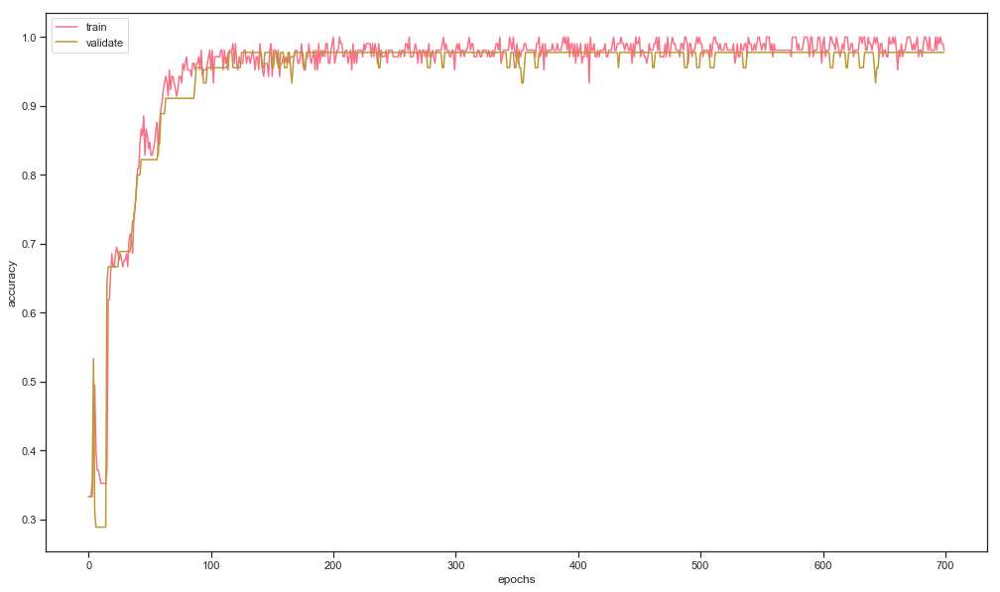

 39%|███▉      | 50/128 [02:03<03:25,  2.63s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

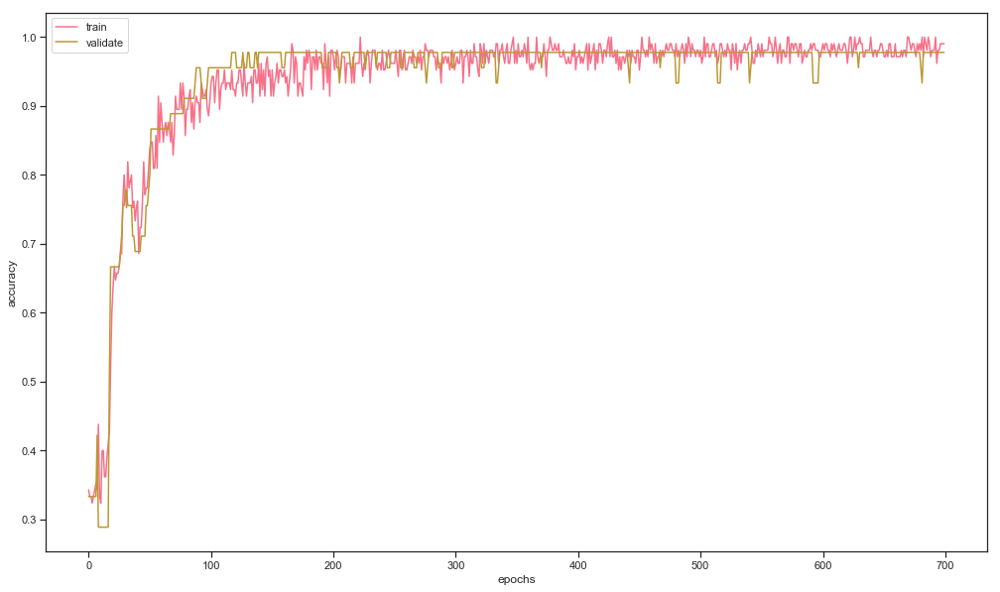

 40%|███▉      | 51/128 [02:06<03:24,  2.66s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 30

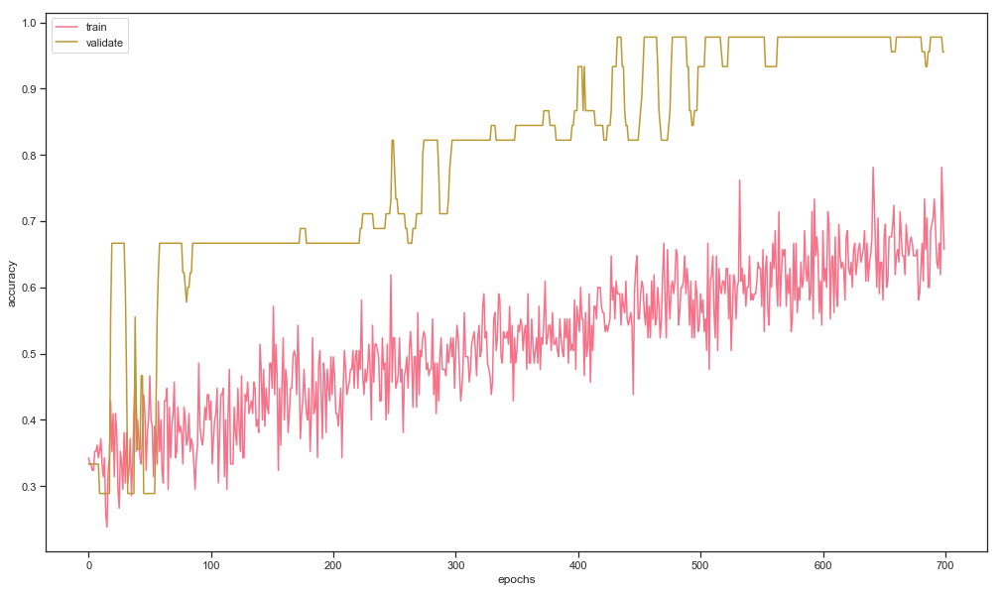

 41%|████      | 52/128 [02:08<03:21,  2.66s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

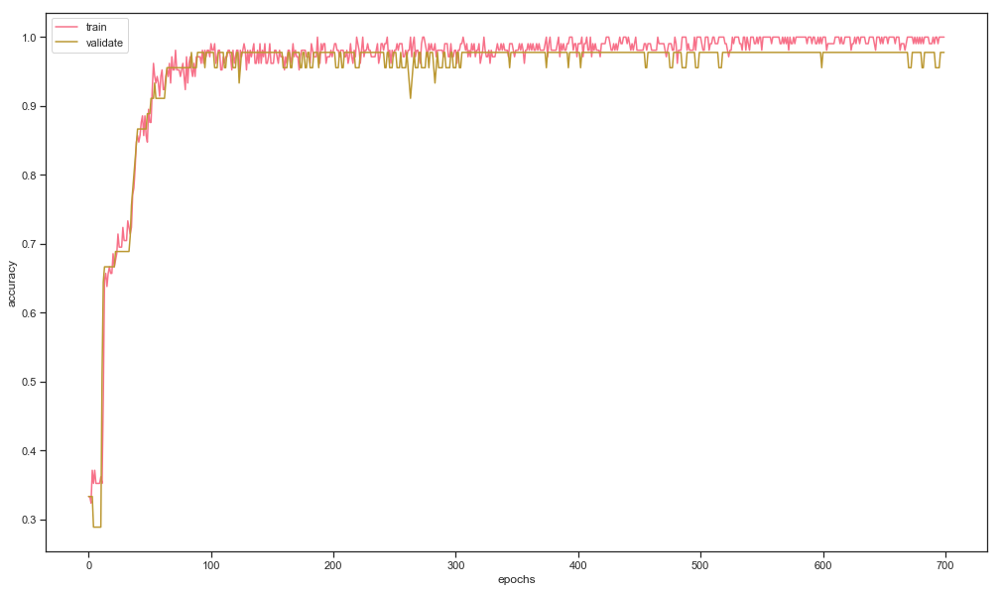

 41%|████▏     | 53/128 [02:11<03:18,  2.65s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603

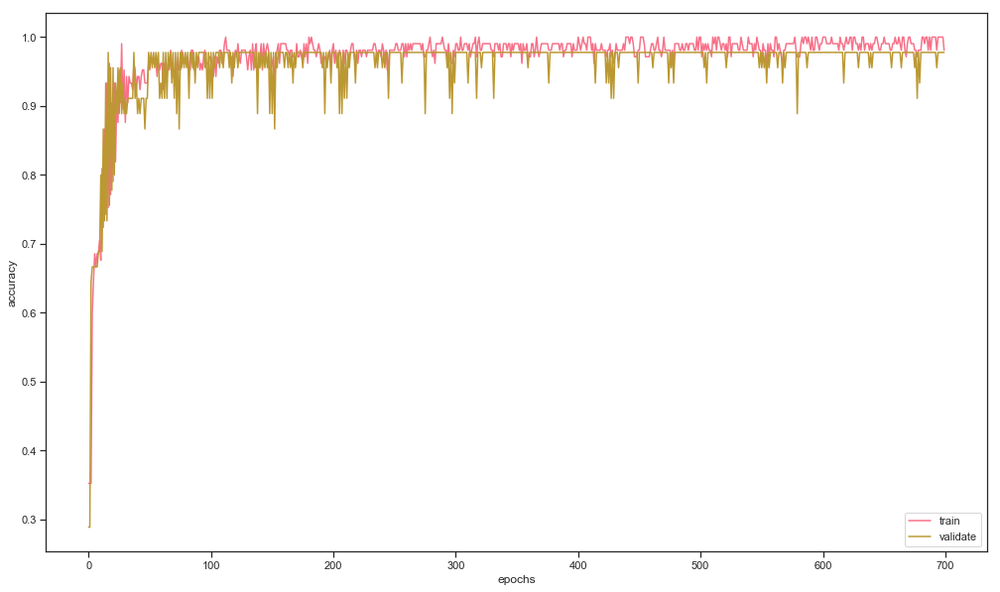

 42%|████▏     | 54/128 [02:14<03:22,  2.73s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

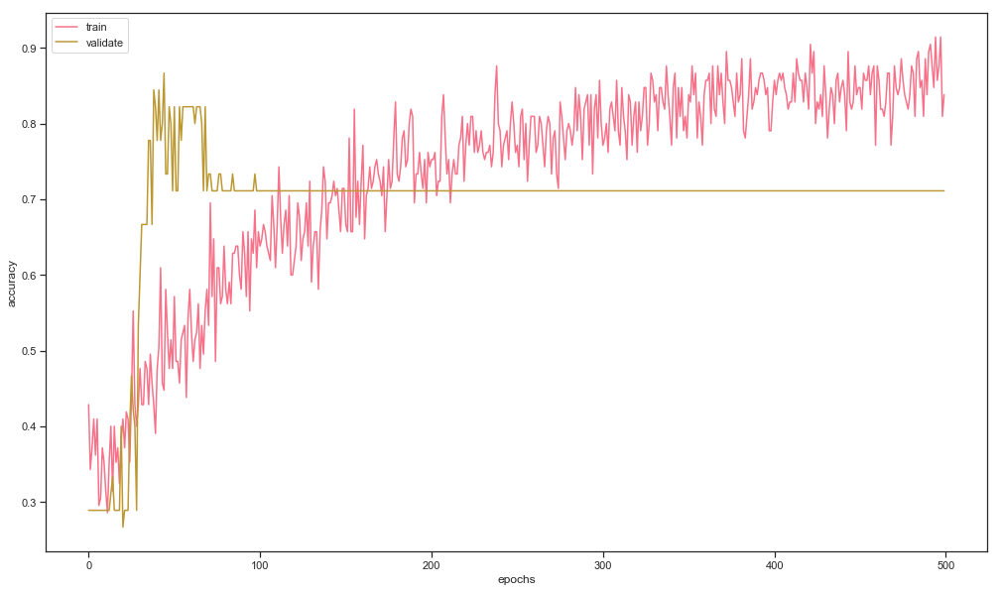

 43%|████▎     | 55/128 [02:16<03:09,  2.60s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

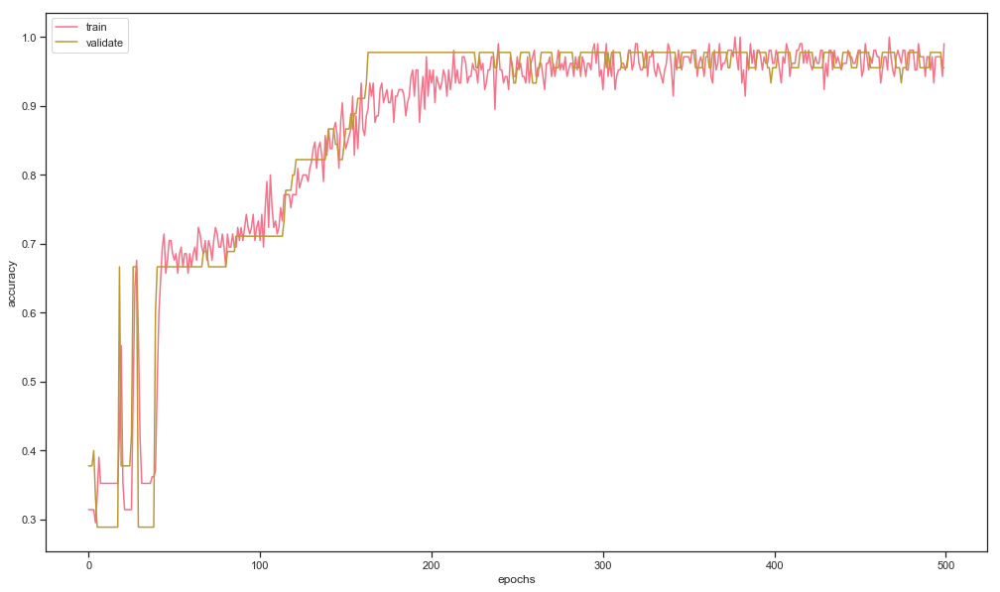

 44%|████▍     | 56/128 [02:18<02:55,  2.44s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

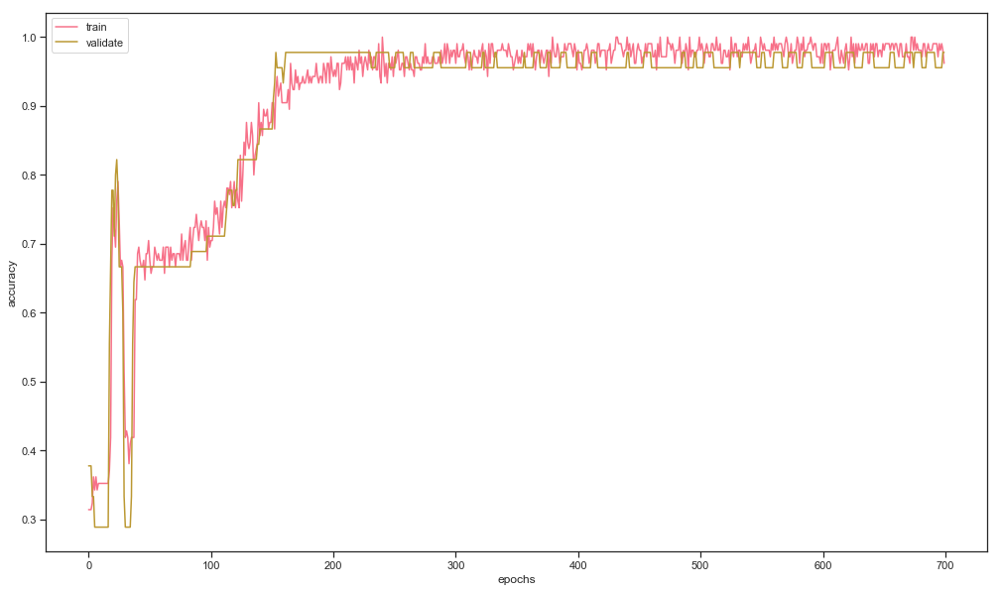

 45%|████▍     | 57/128 [02:21<02:59,  2.52s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

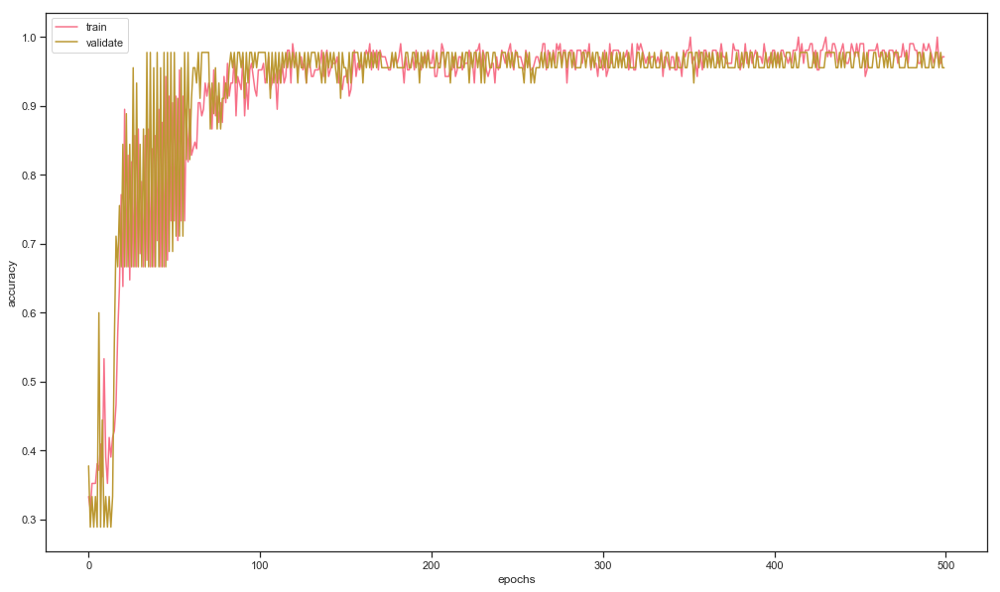

 45%|████▌     | 58/128 [02:23<02:50,  2.43s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

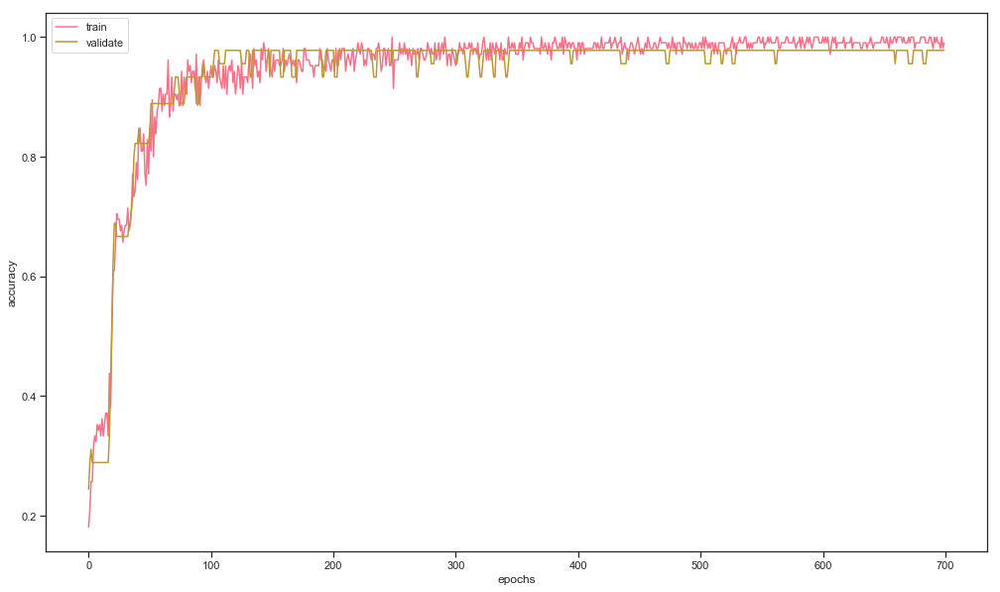

 46%|████▌     | 59/128 [02:26<02:53,  2.51s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603  

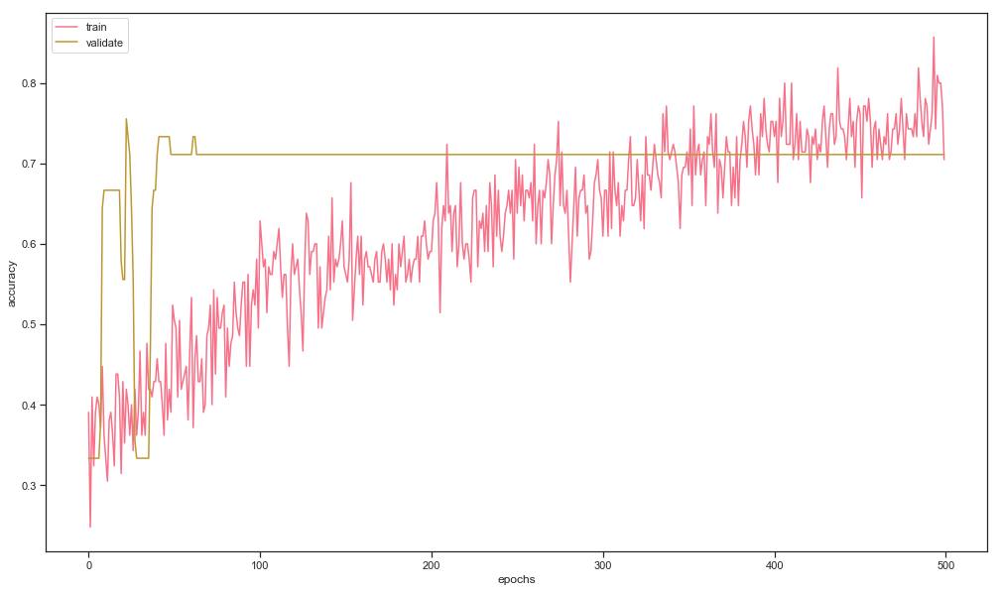

 47%|████▋     | 60/128 [02:28<02:41,  2.38s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

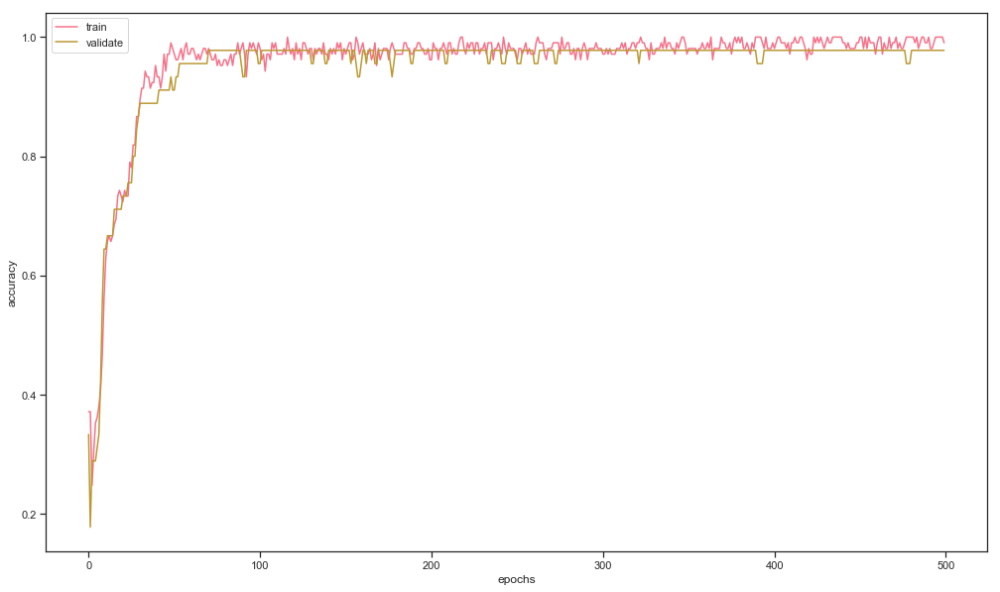

 48%|████▊     | 61/128 [02:30<02:32,  2.28s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

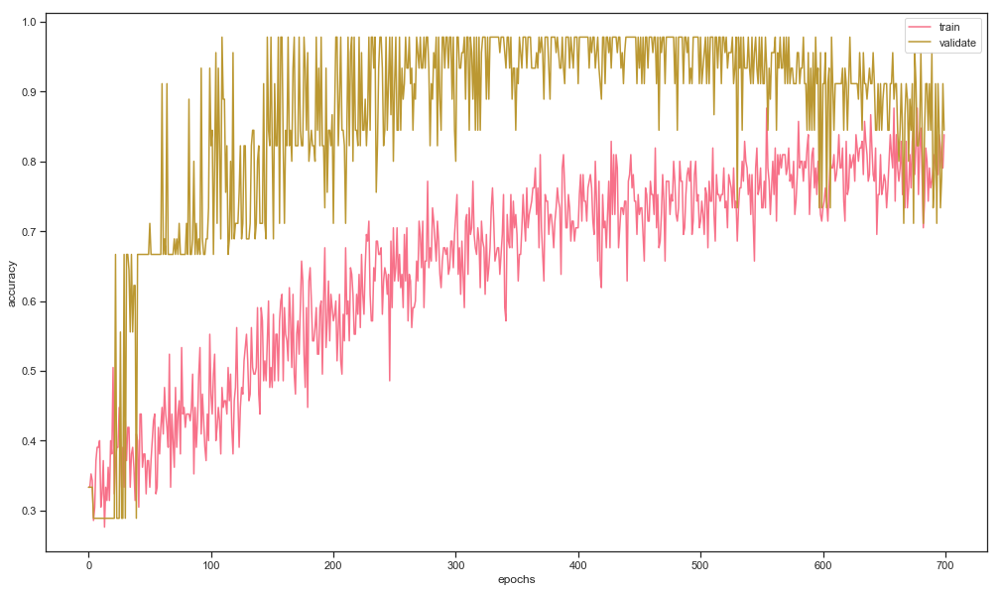

 48%|████▊     | 62/128 [02:33<02:44,  2.49s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

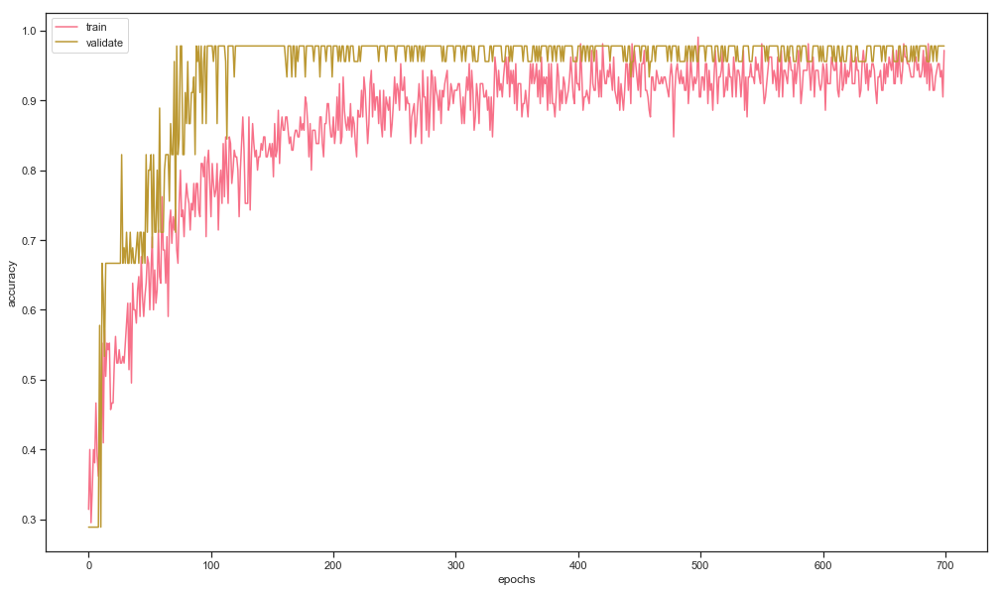

 49%|████▉     | 63/128 [02:36<02:49,  2.61s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 60

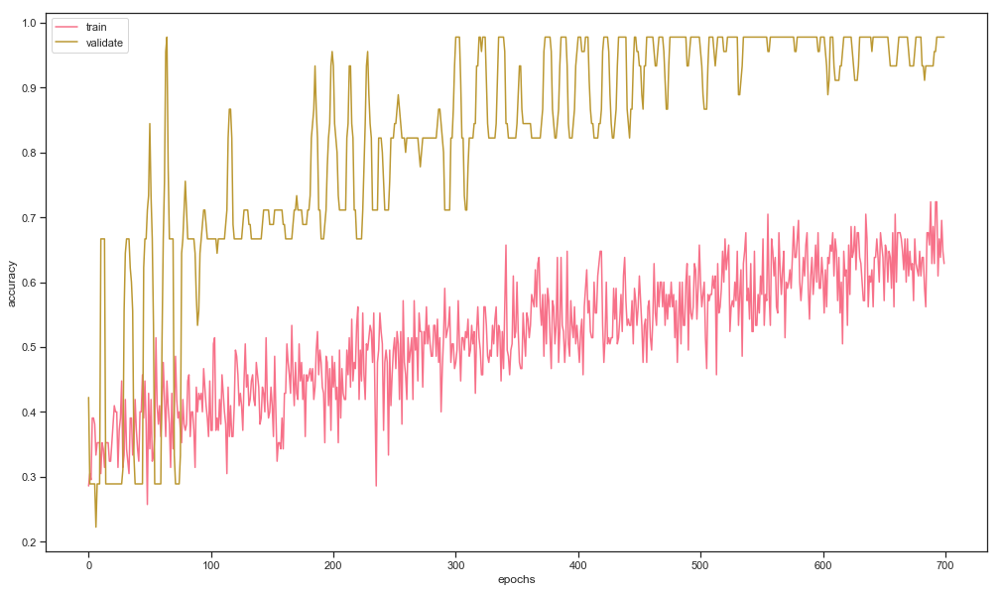

 50%|█████     | 64/128 [02:39<02:47,  2.62s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

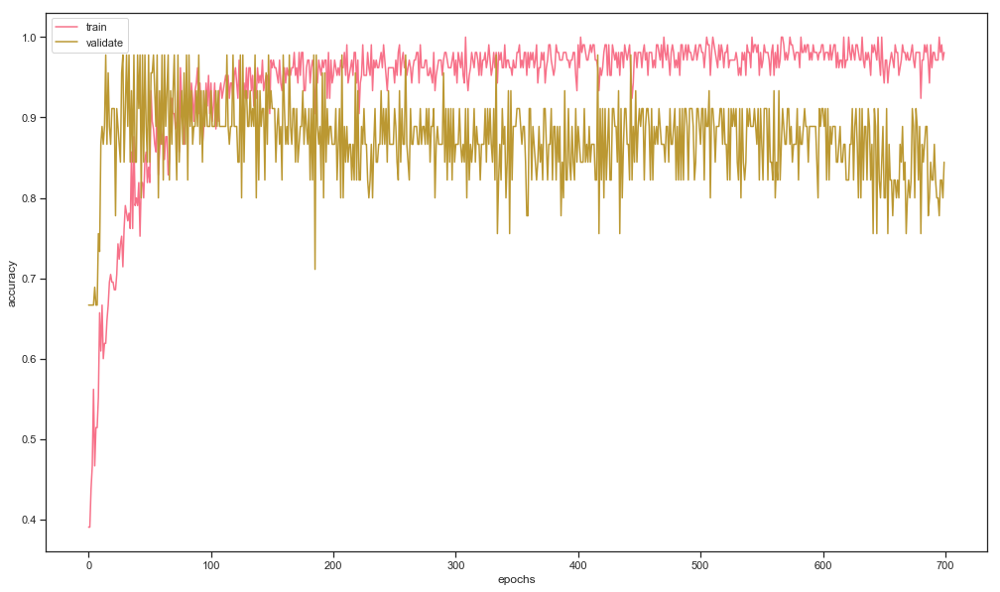

 51%|█████     | 65/128 [02:42<02:50,  2.71s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303

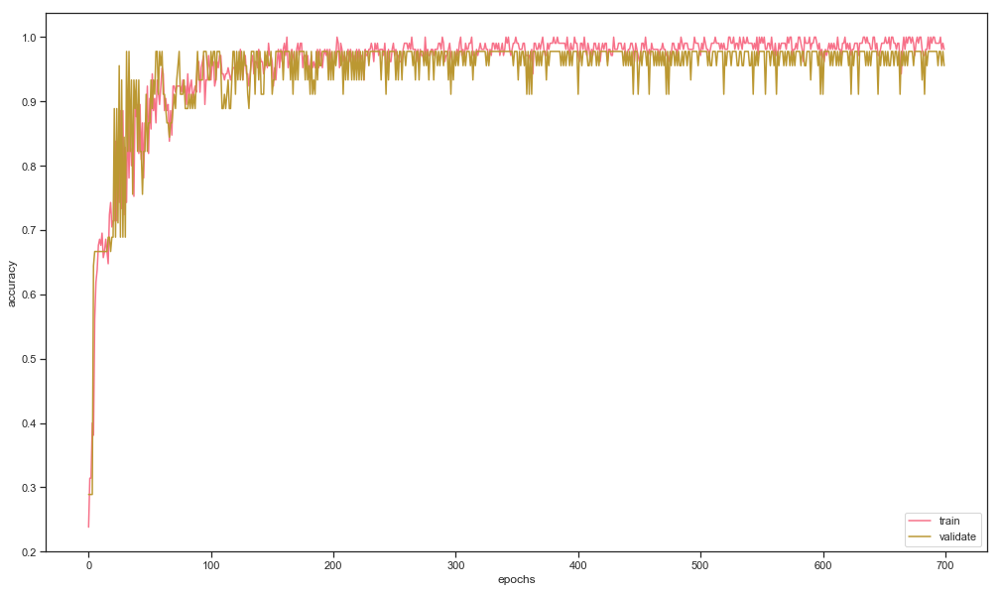

 52%|█████▏    | 66/128 [02:44<02:50,  2.75s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

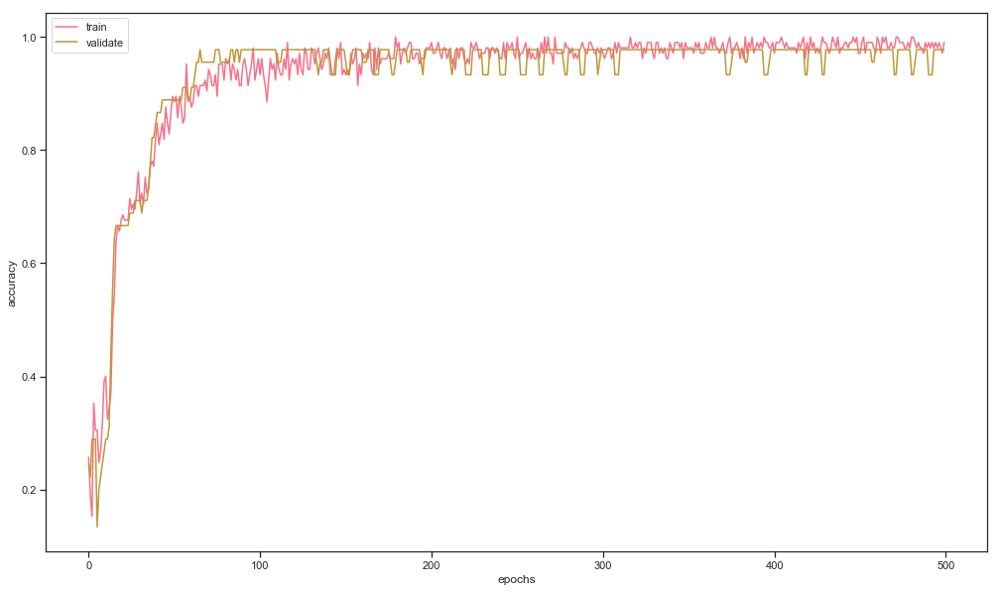

 52%|█████▏    | 67/128 [02:47<02:36,  2.57s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

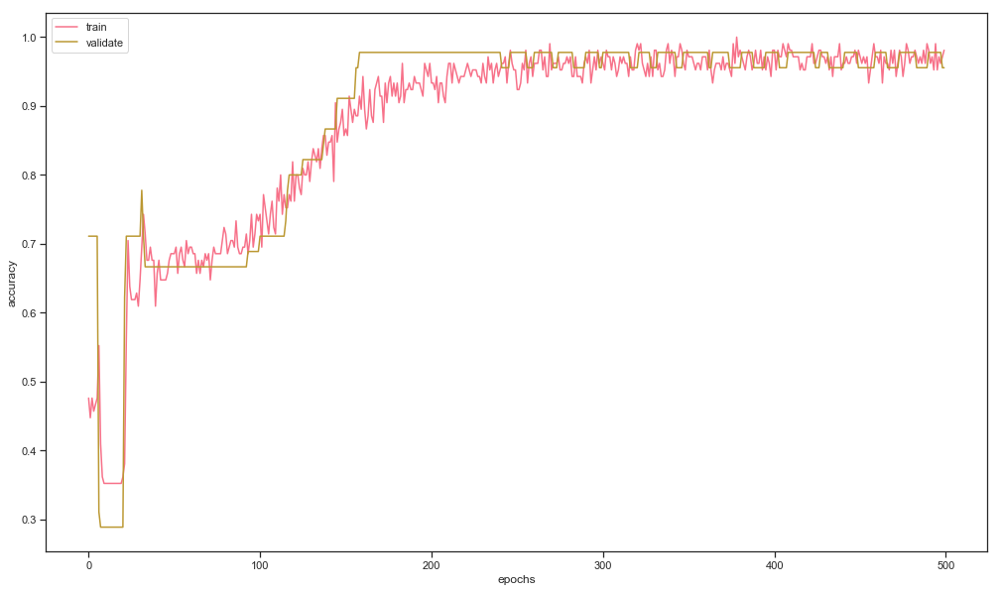

 53%|█████▎    | 68/128 [02:49<02:25,  2.42s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

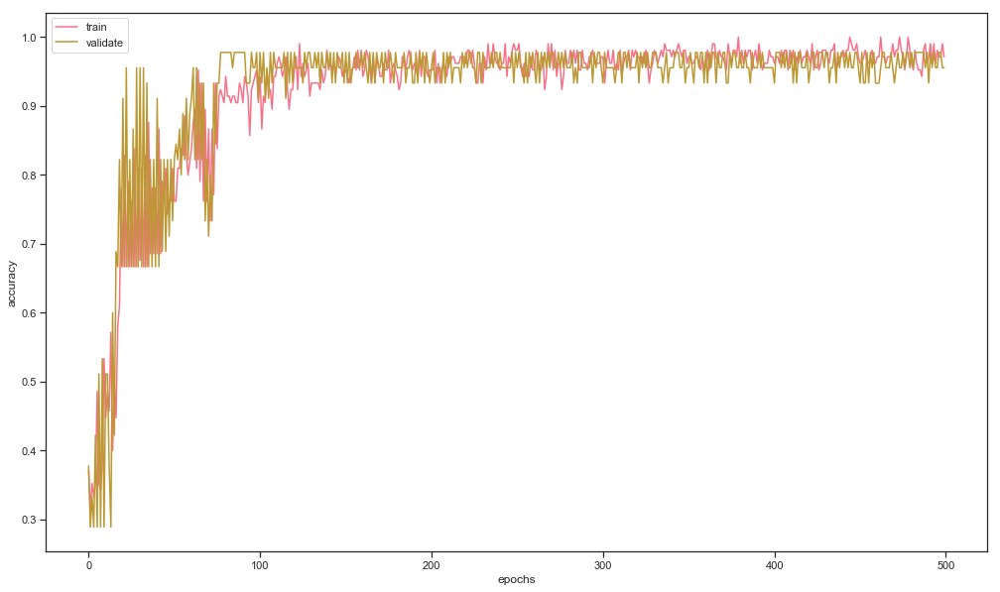

 54%|█████▍    | 69/128 [02:51<02:19,  2.36s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303

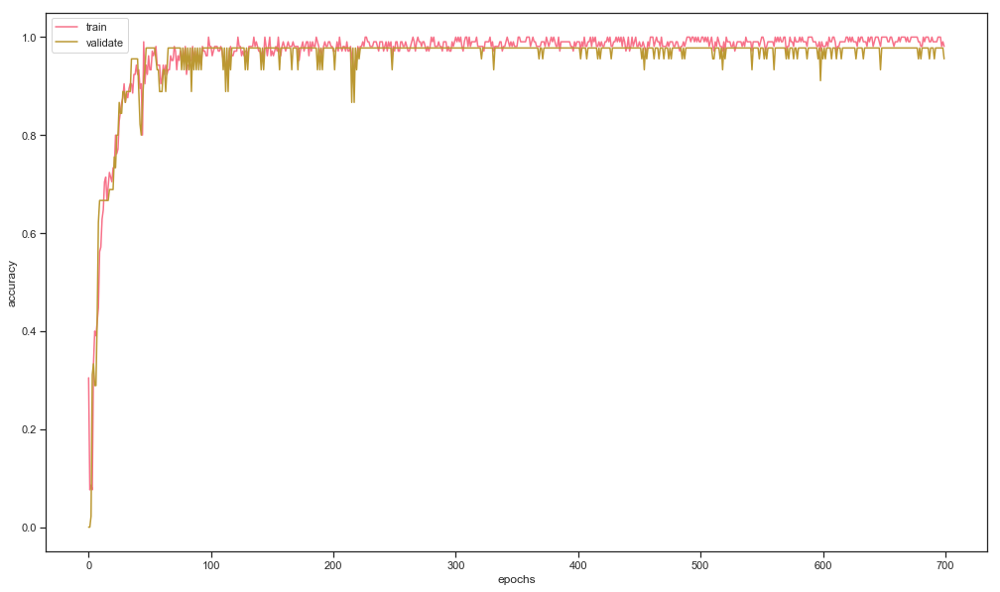

 55%|█████▍    | 70/128 [02:54<02:26,  2.52s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

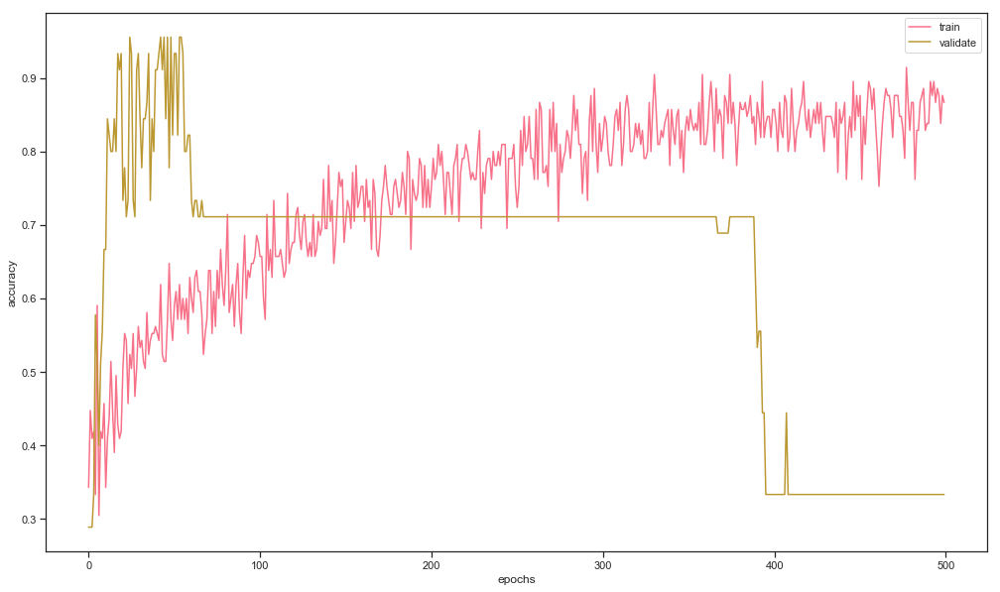

 55%|█████▌    | 71/128 [02:56<02:19,  2.45s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

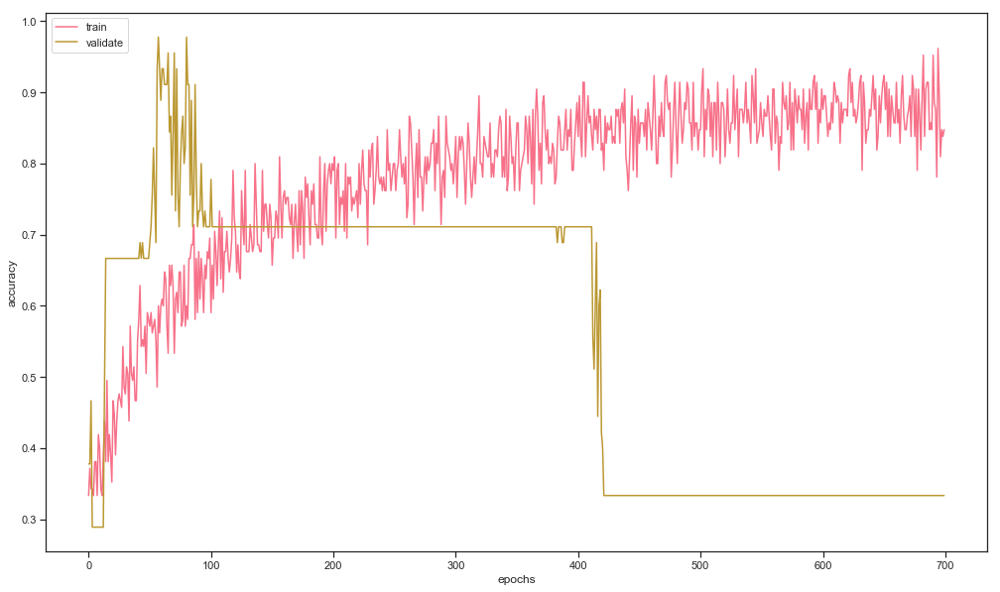

 56%|█████▋    | 72/128 [02:59<02:23,  2.57s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

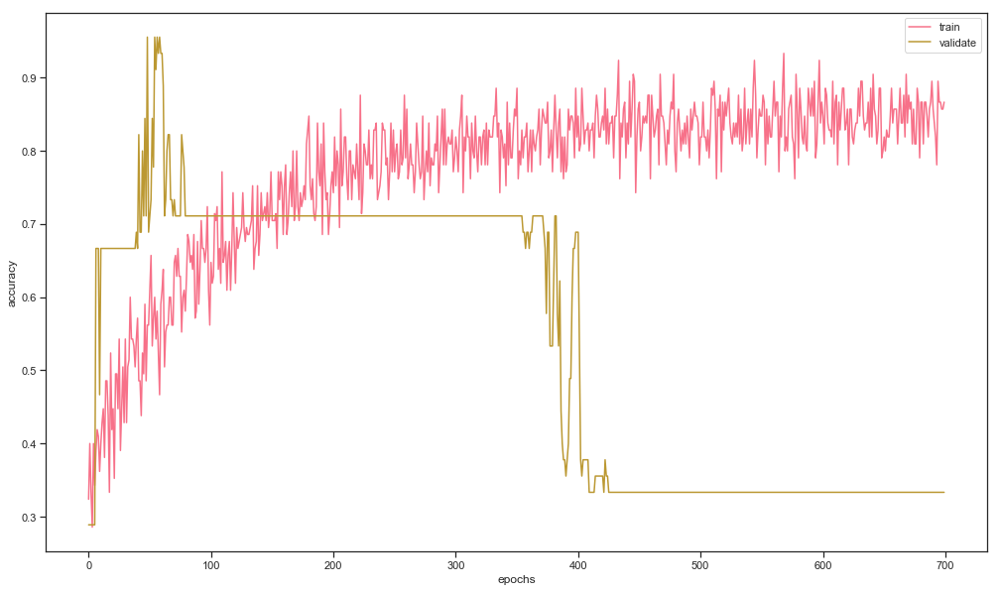

 57%|█████▋    | 73/128 [03:02<02:26,  2.67s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

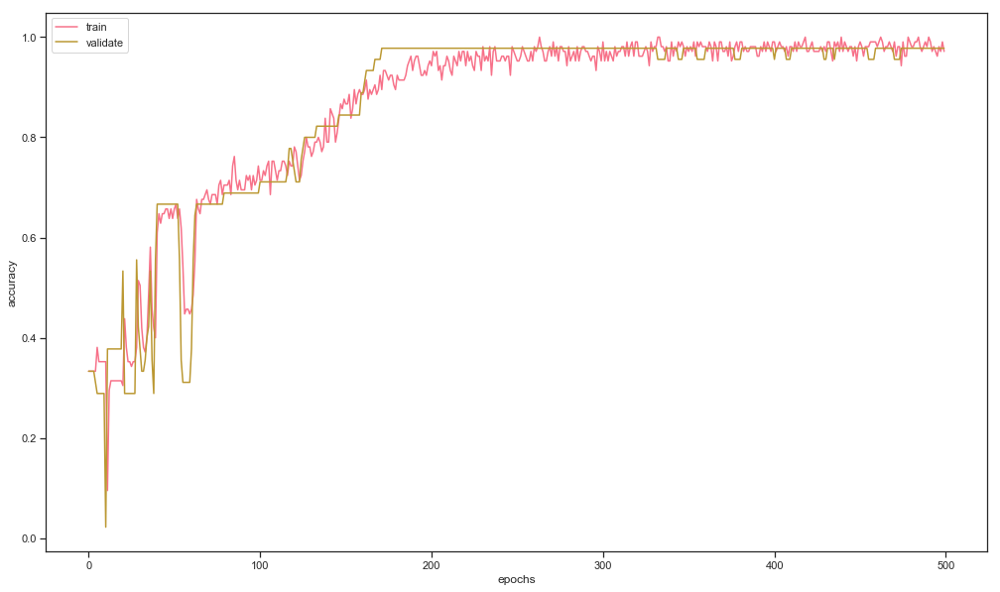

 58%|█████▊    | 74/128 [03:04<02:14,  2.49s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303  

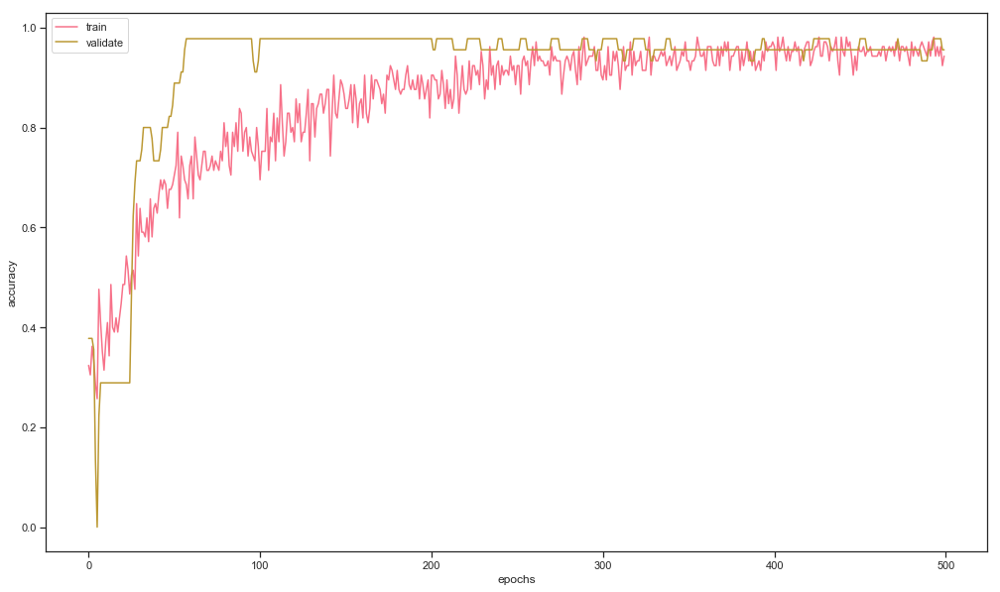

 59%|█████▊    | 75/128 [03:06<02:06,  2.39s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303

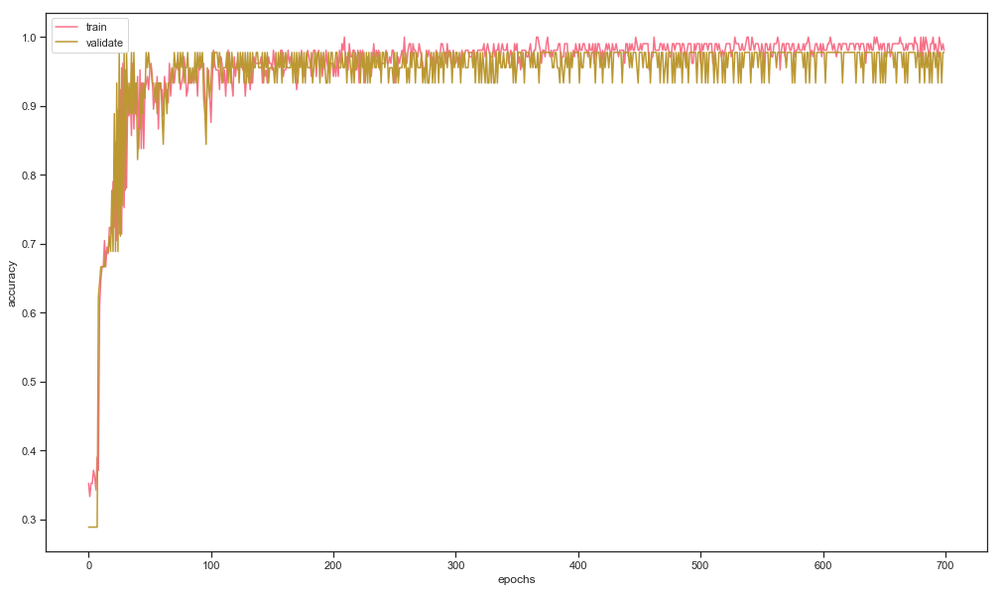

 59%|█████▉    | 76/128 [03:09<02:11,  2.52s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603

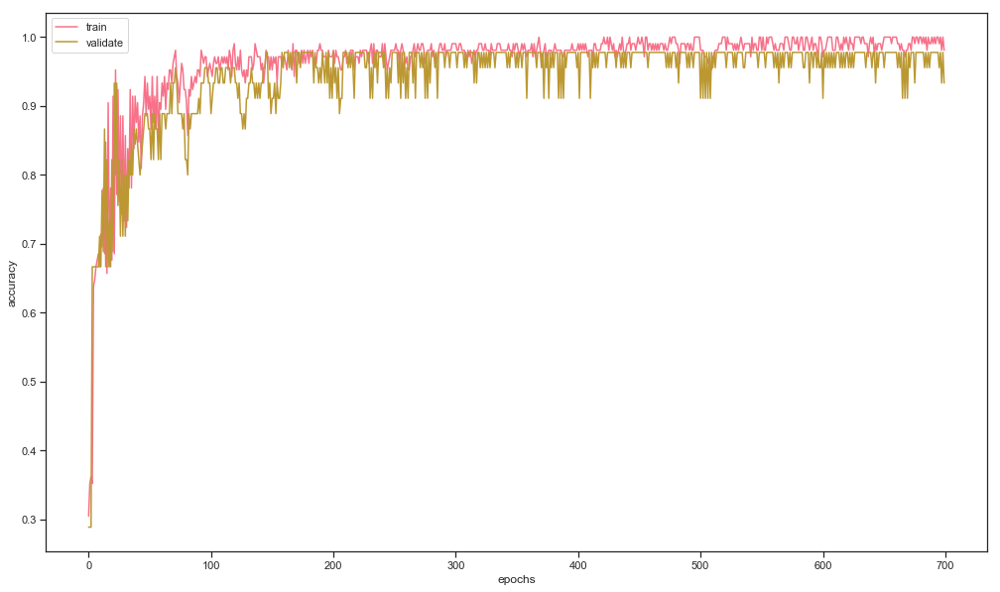

 60%|██████    | 77/128 [03:12<02:14,  2.64s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303

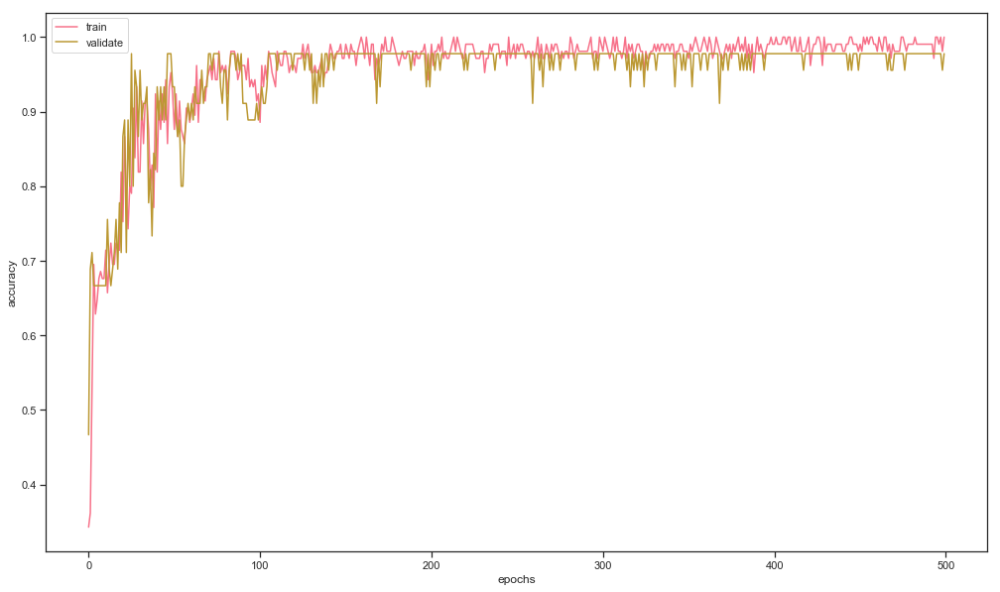

 61%|██████    | 78/128 [03:14<02:05,  2.52s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

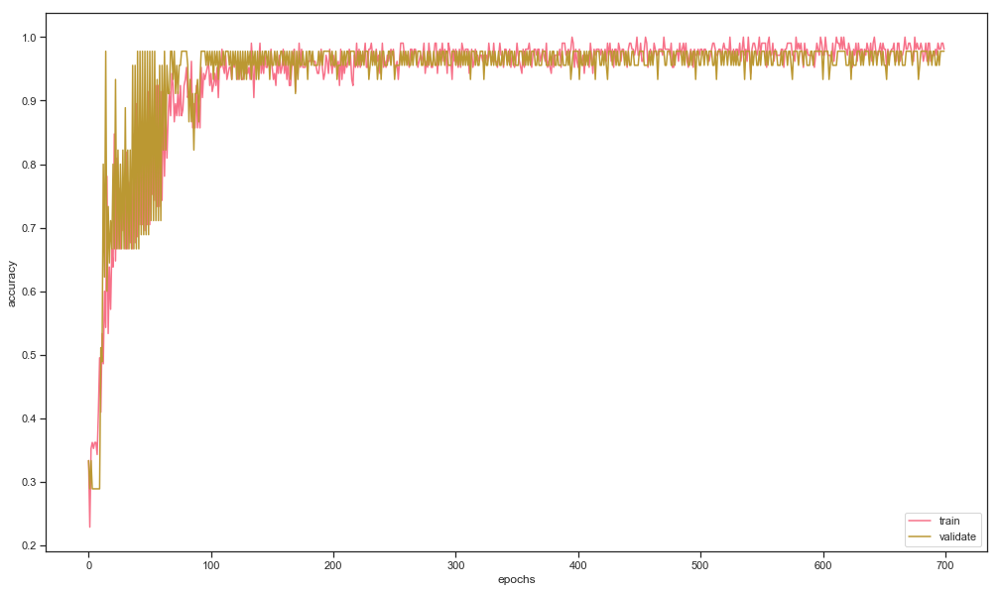

 62%|██████▏   | 79/128 [03:17<02:09,  2.64s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

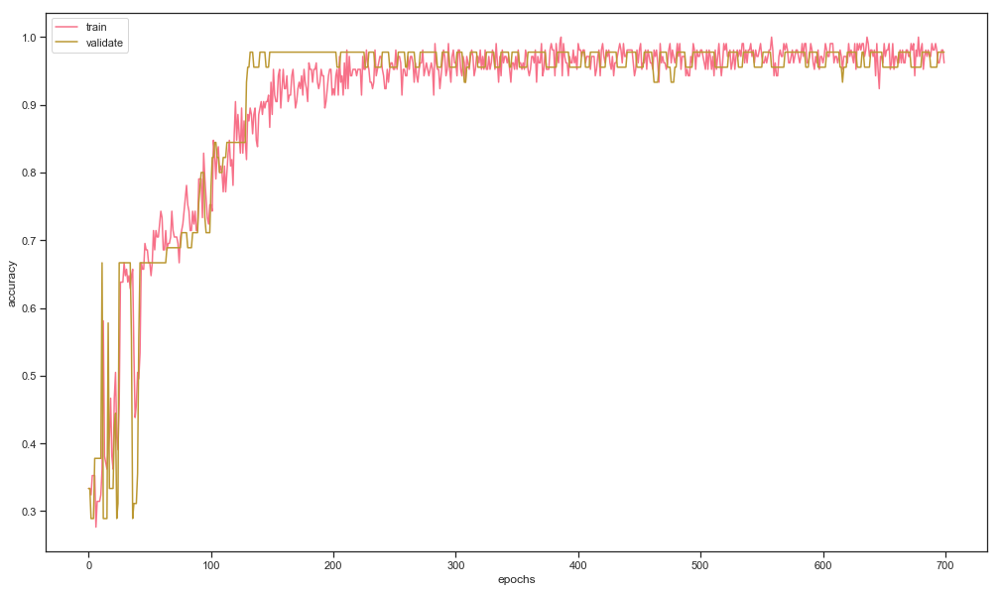

 62%|██████▎   | 80/128 [03:20<02:06,  2.64s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

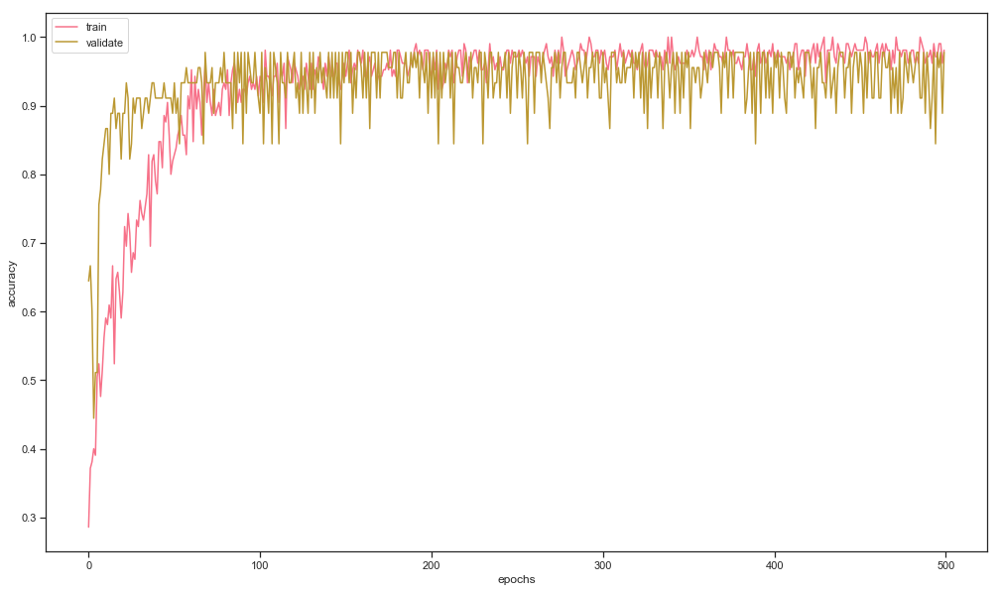

 63%|██████▎   | 81/128 [03:22<01:59,  2.54s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

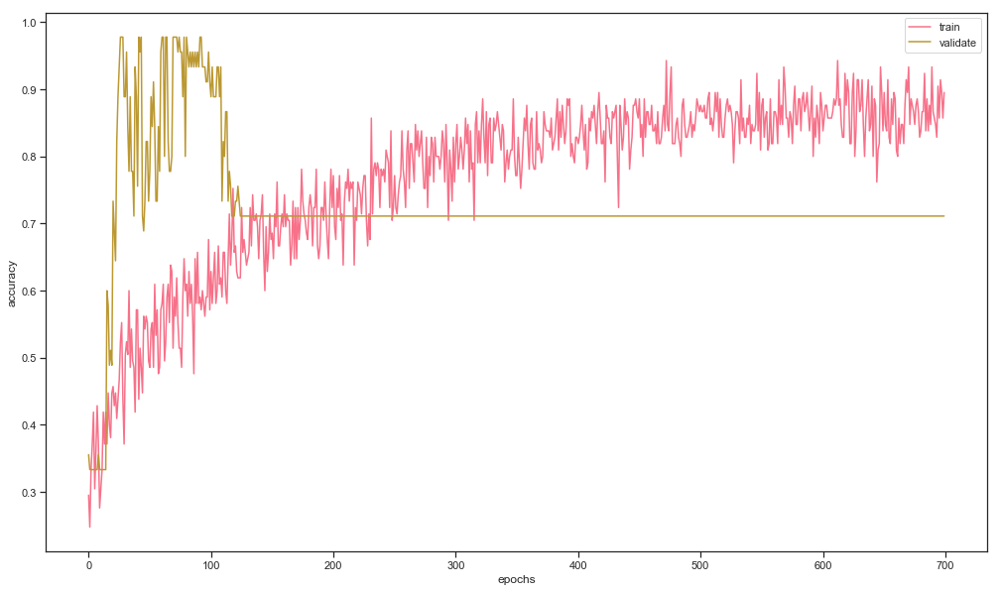

 64%|██████▍   | 82/128 [03:25<02:00,  2.63s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 30

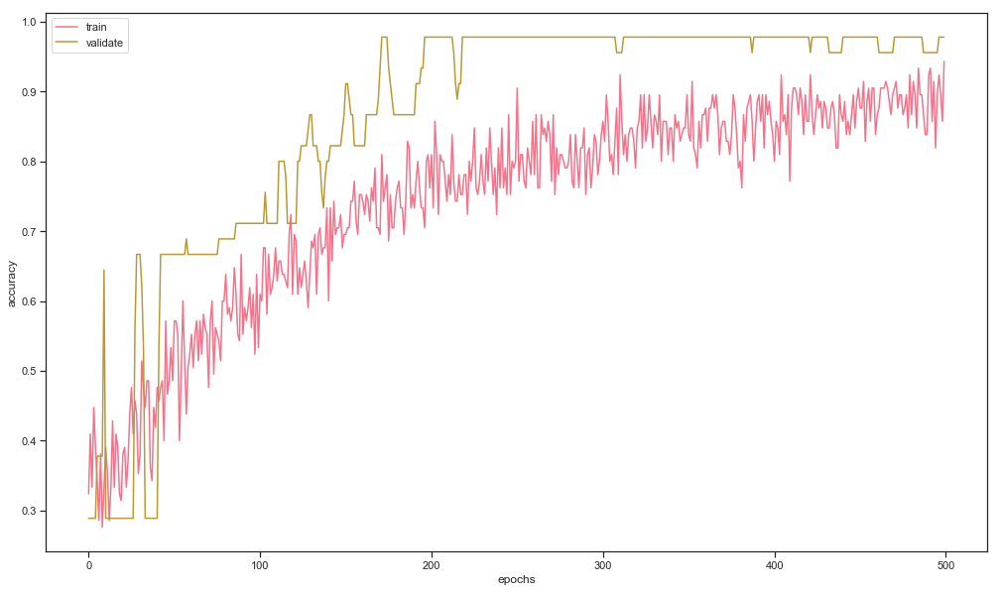

 65%|██████▍   | 83/128 [03:27<01:52,  2.49s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 60

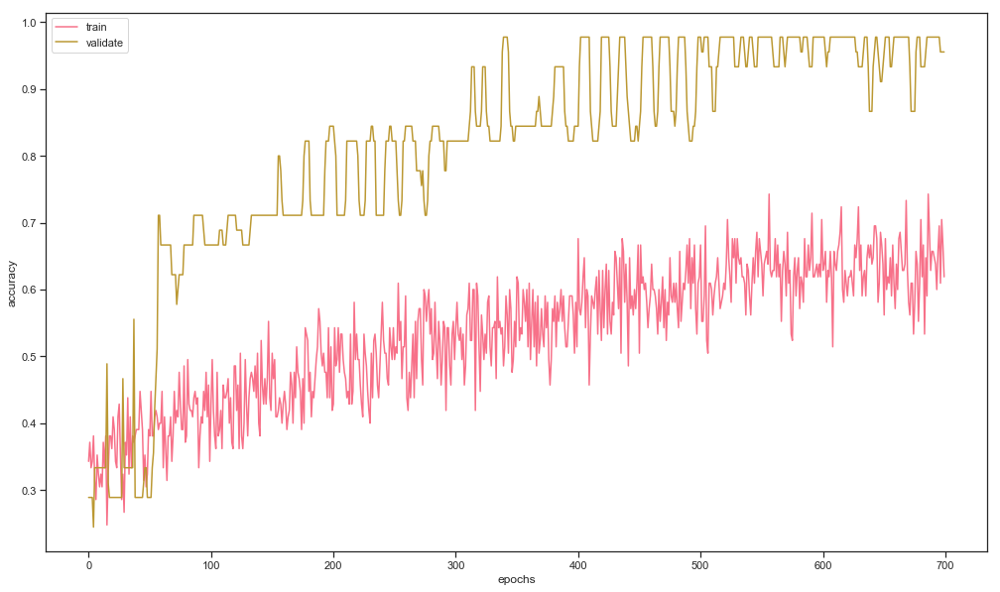

 66%|██████▌   | 84/128 [03:30<01:51,  2.54s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

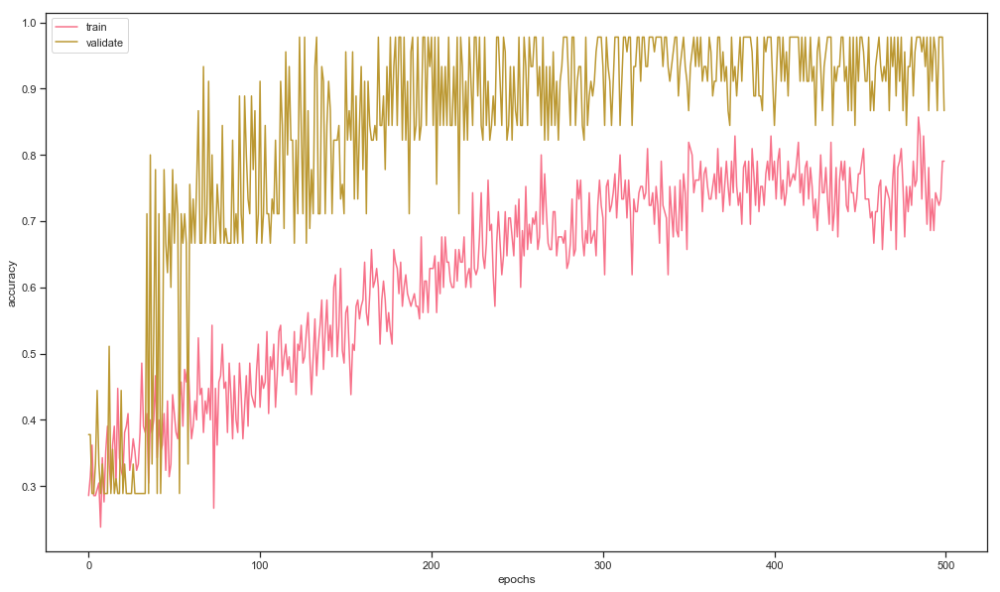

 66%|██████▋   | 85/128 [03:32<01:45,  2.45s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

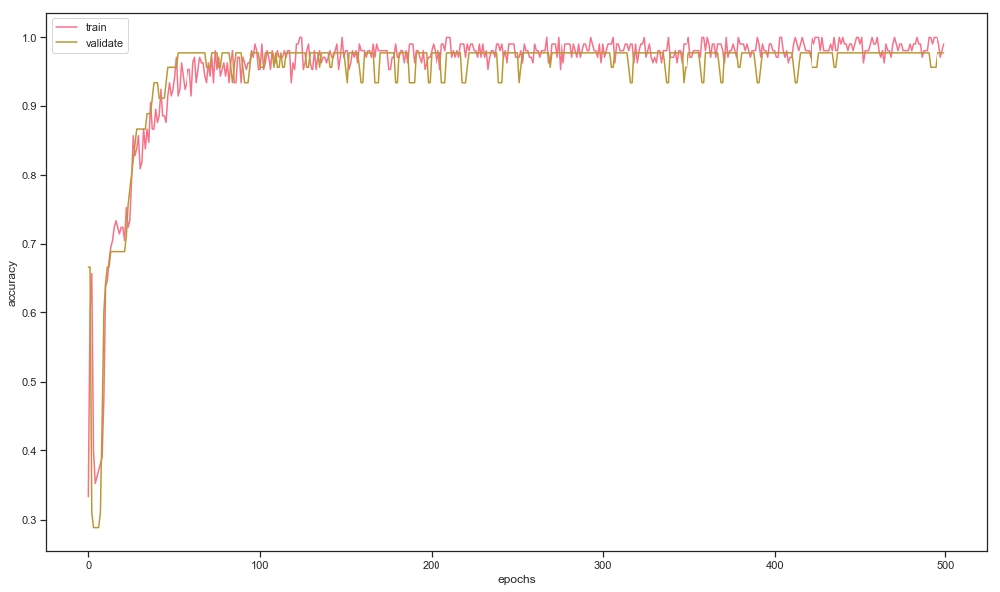

 67%|██████▋   | 86/128 [03:34<01:39,  2.37s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303  

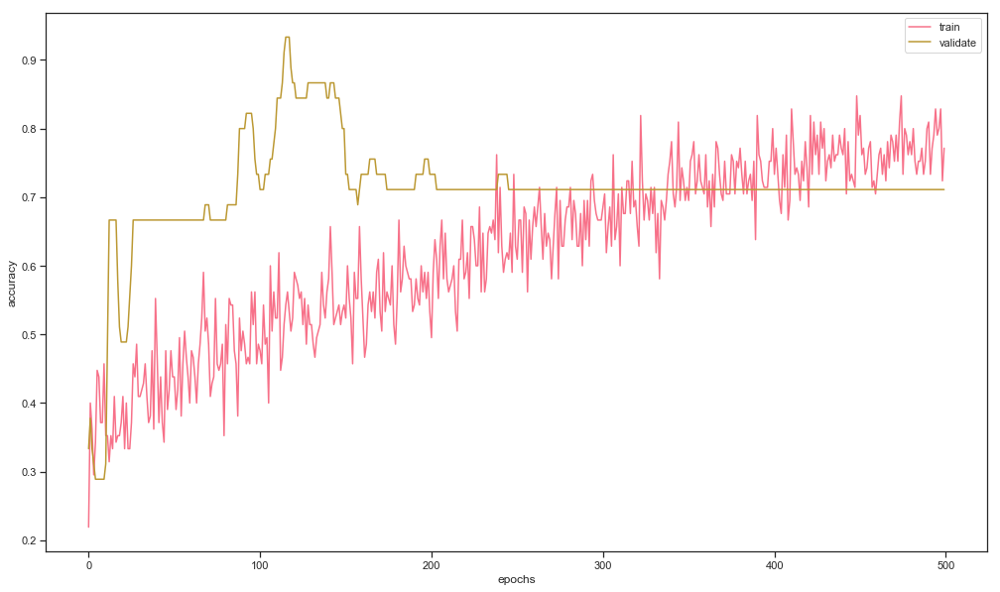

 68%|██████▊   | 87/128 [03:36<01:34,  2.31s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 30

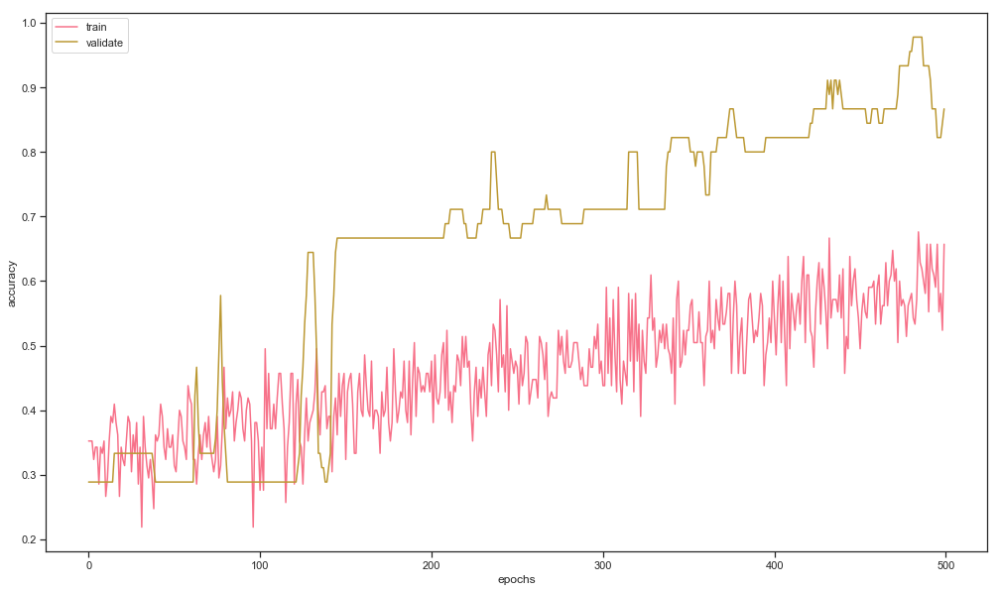

 69%|██████▉   | 88/128 [03:38<01:29,  2.24s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

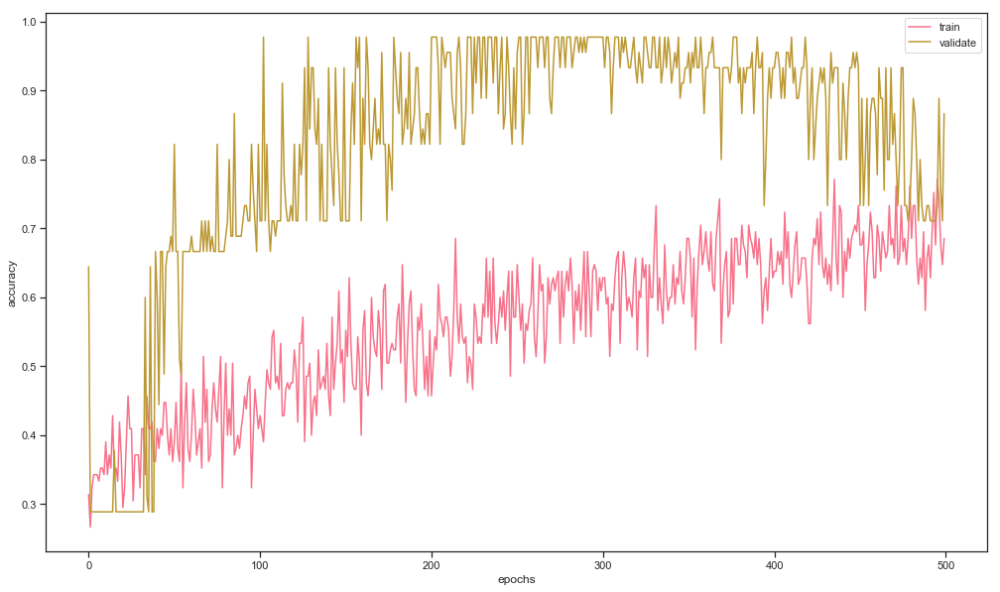

 70%|██████▉   | 89/128 [03:40<01:27,  2.24s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 30

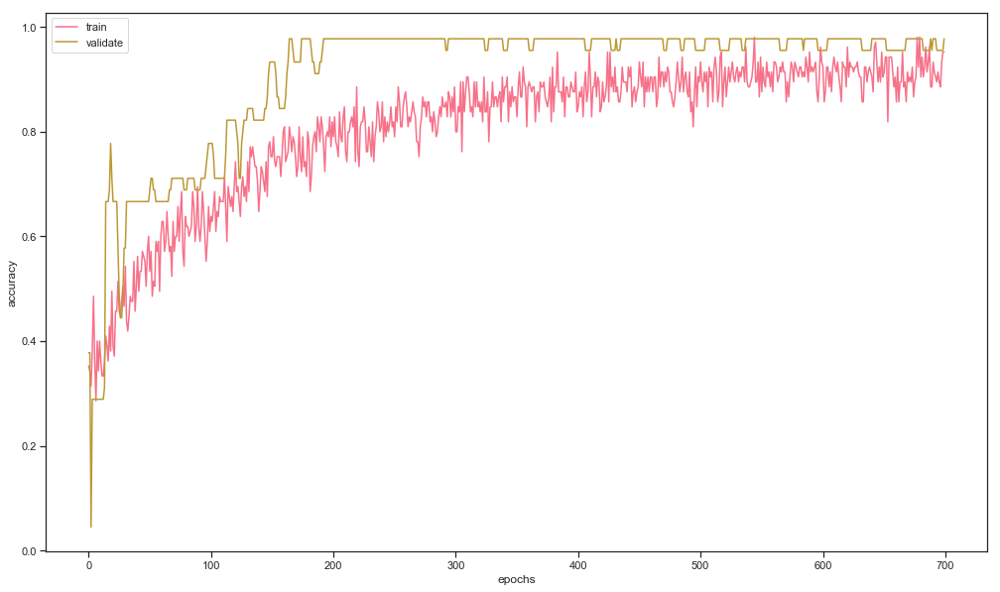

 70%|███████   | 90/128 [03:43<01:30,  2.38s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

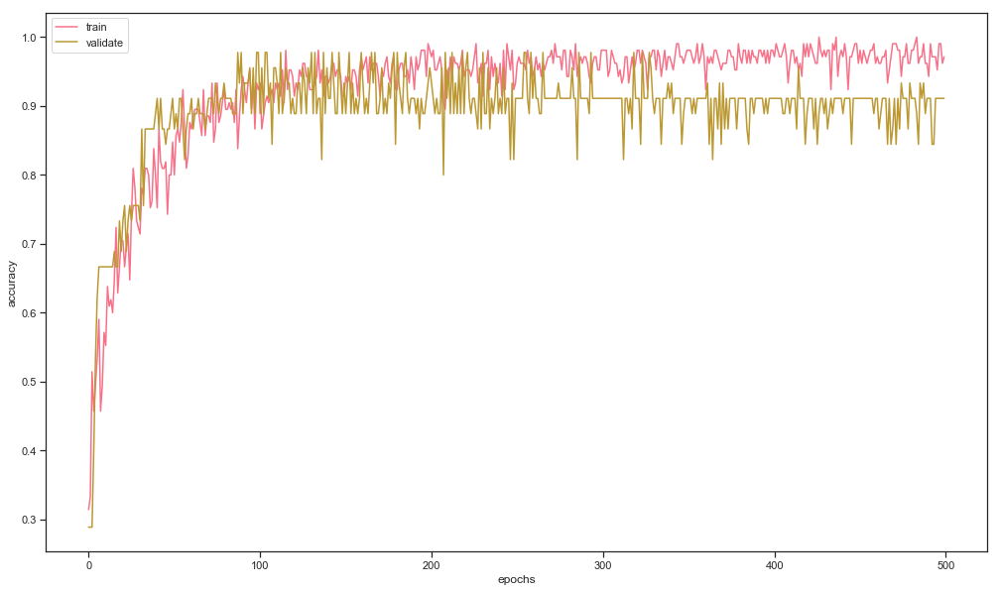

 71%|███████   | 91/128 [03:45<01:27,  2.36s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

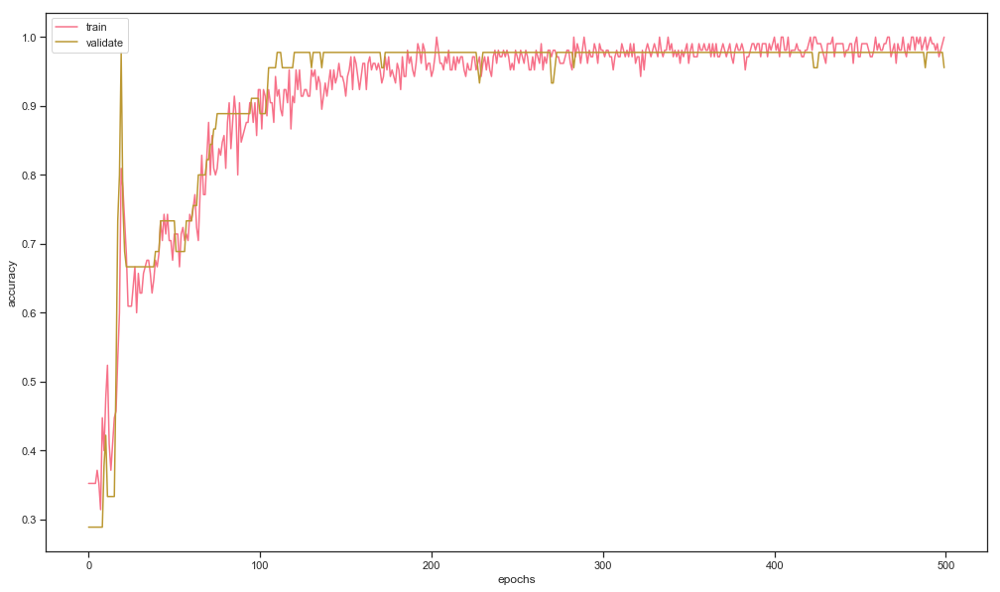

 72%|███████▏  | 92/128 [03:48<01:21,  2.27s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

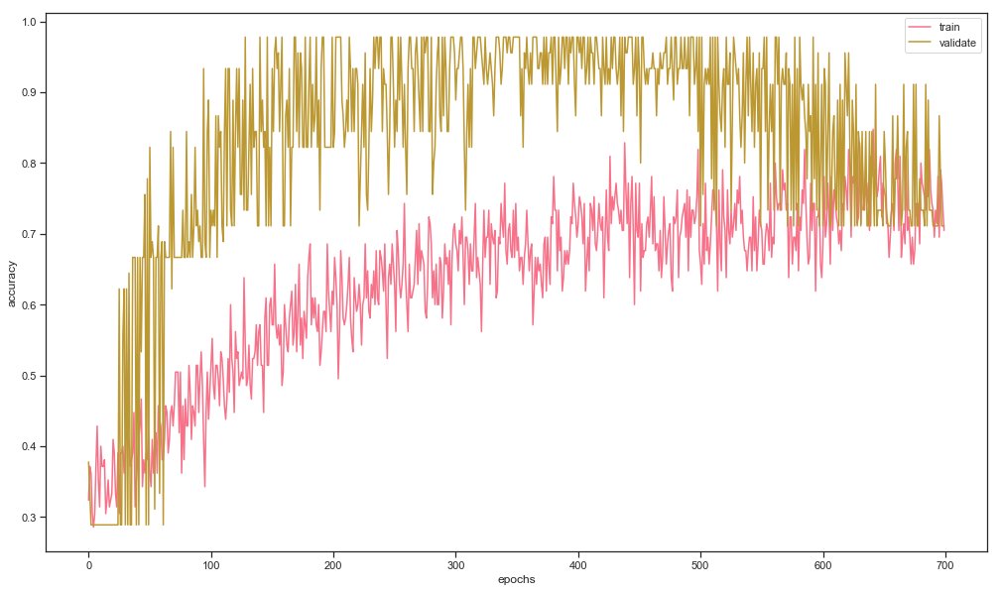

 73%|███████▎  | 93/128 [03:50<01:26,  2.47s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

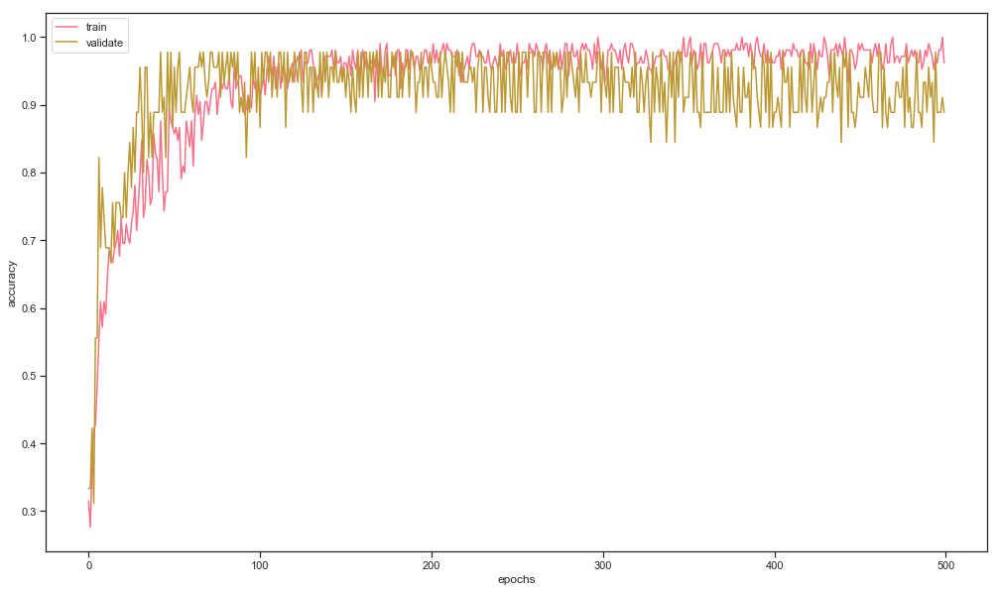

 73%|███████▎  | 94/128 [03:53<01:21,  2.40s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

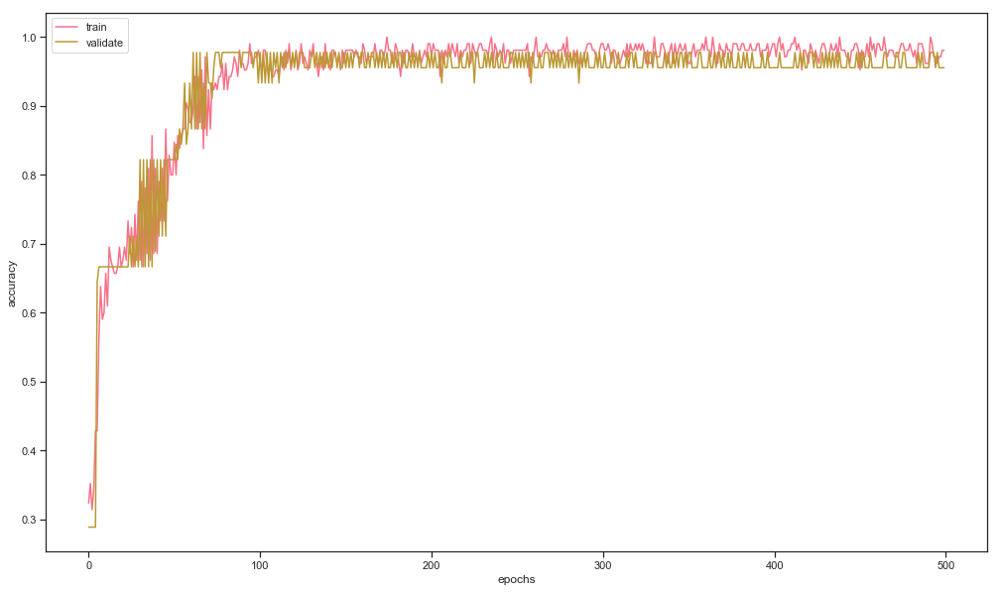

 74%|███████▍  | 95/128 [03:55<01:18,  2.37s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603  

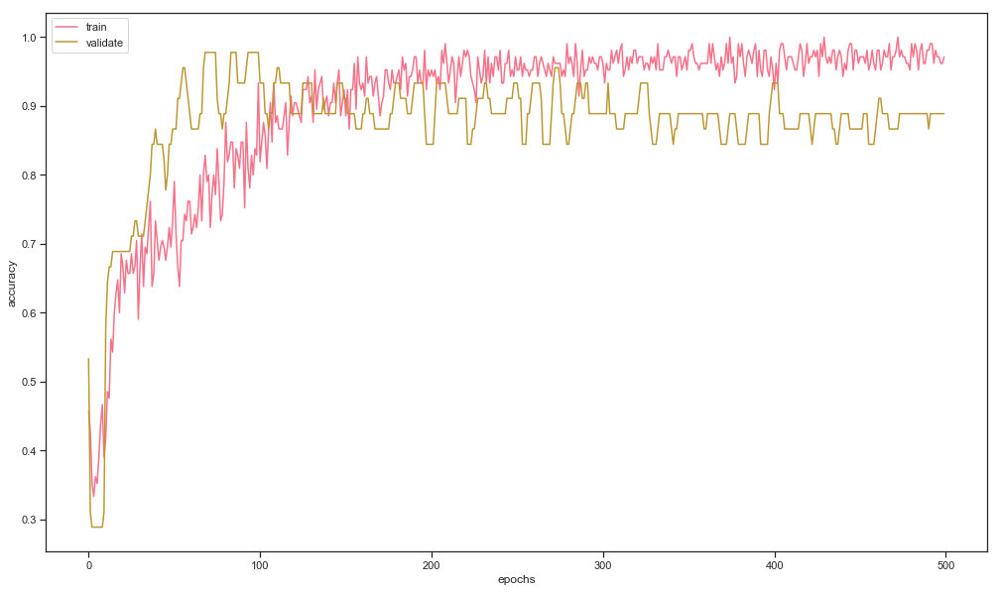

 75%|███████▌  | 96/128 [03:57<01:13,  2.28s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

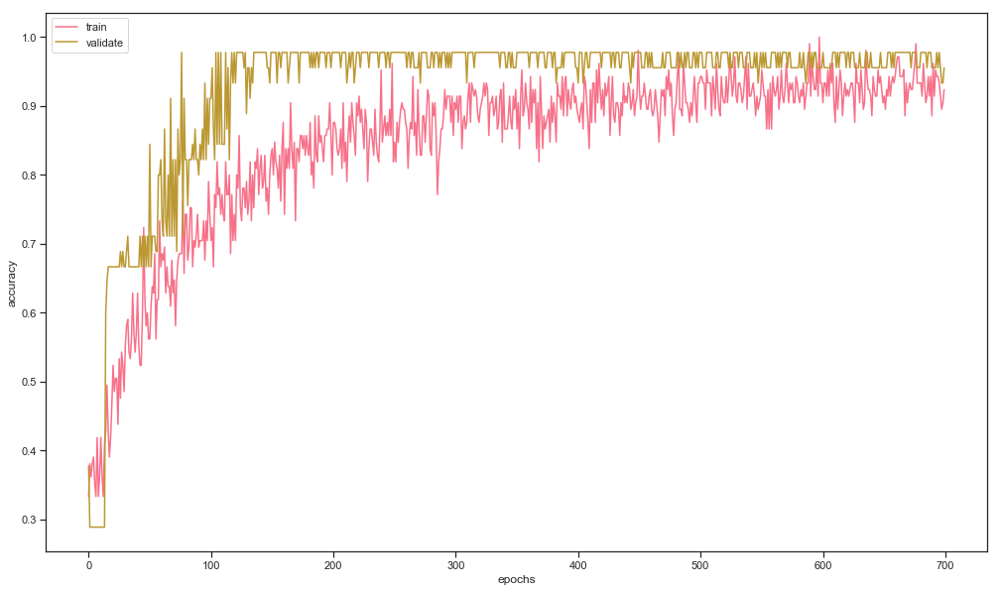

 76%|███████▌  | 97/128 [04:00<01:16,  2.47s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303  

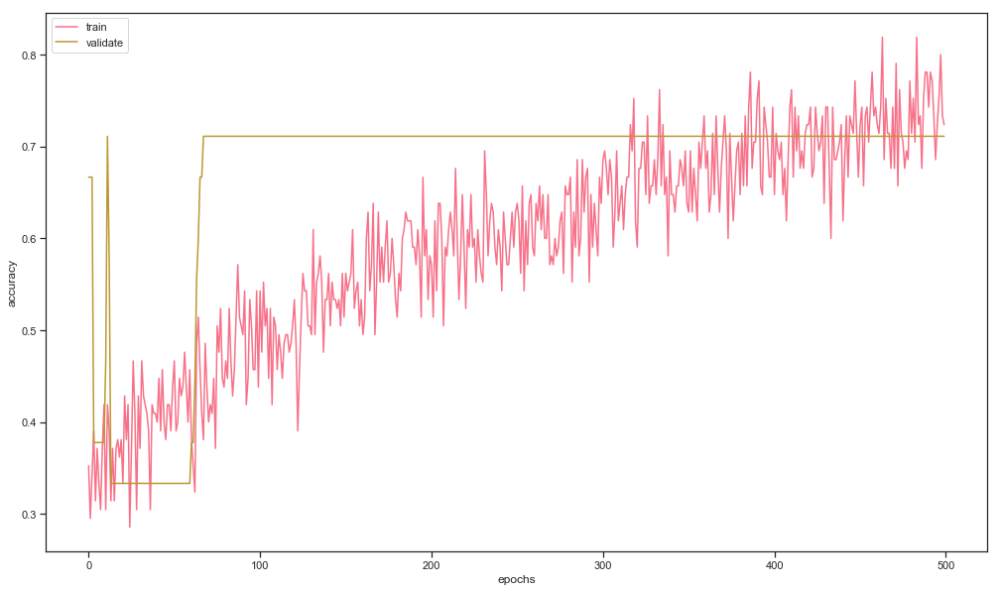

 77%|███████▋  | 98/128 [04:02<01:10,  2.35s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603

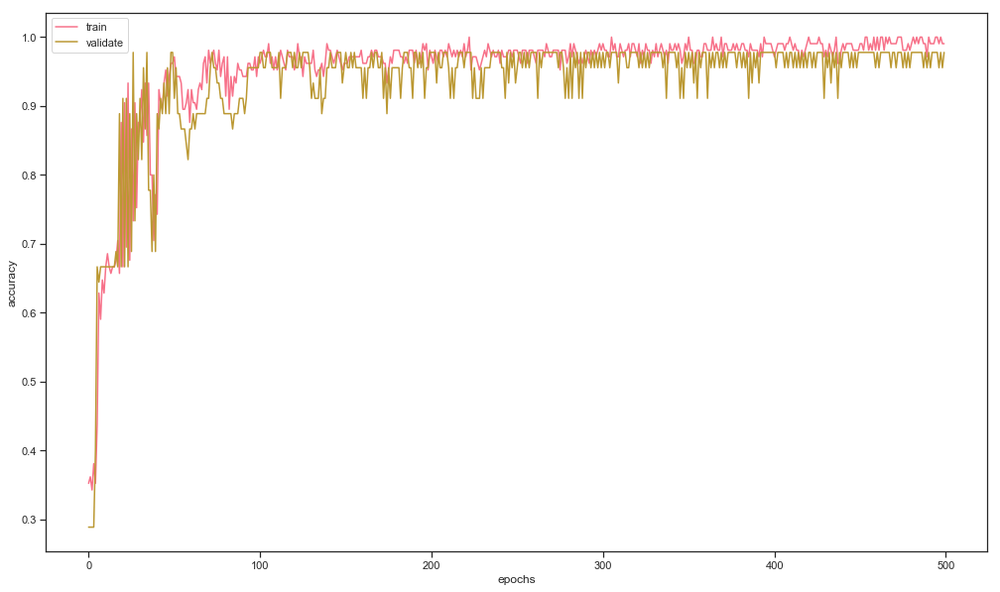

 77%|███████▋  | 99/128 [04:04<01:07,  2.34s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603 

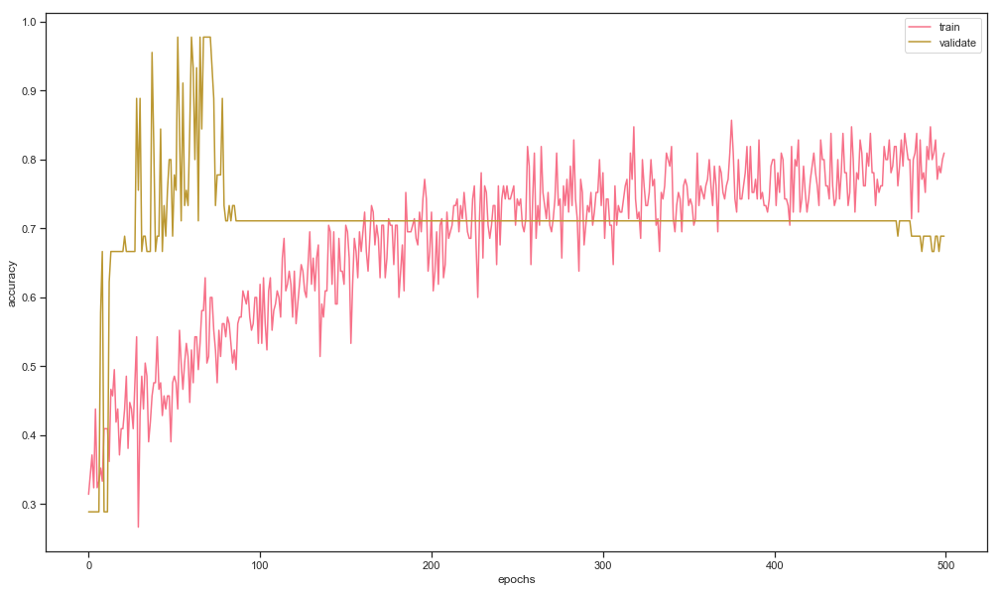

 78%|███████▊  | 100/128 [04:07<01:04,  2.30s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 60

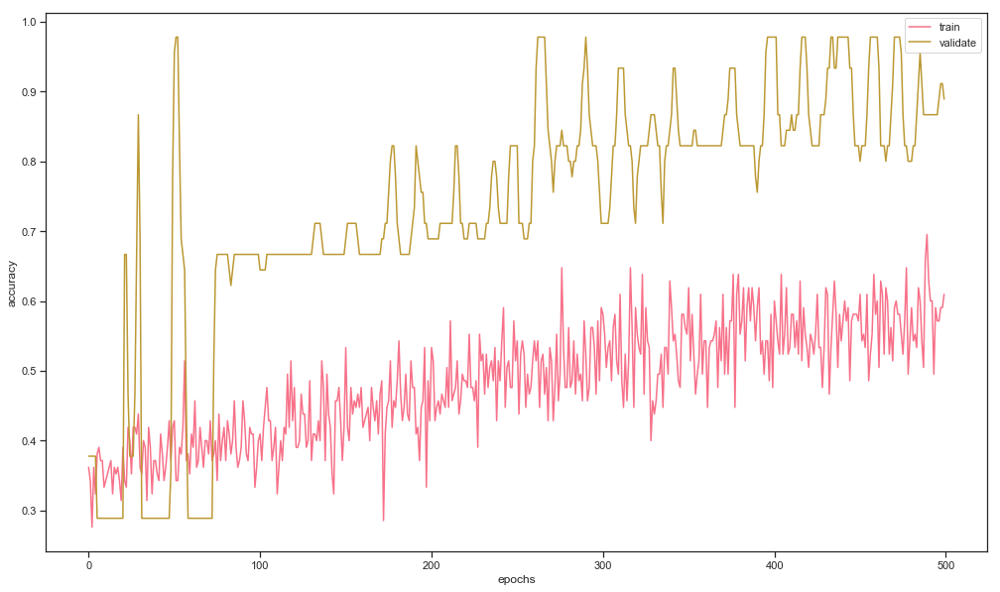

 79%|███████▉  | 101/128 [04:09<01:01,  2.27s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 60

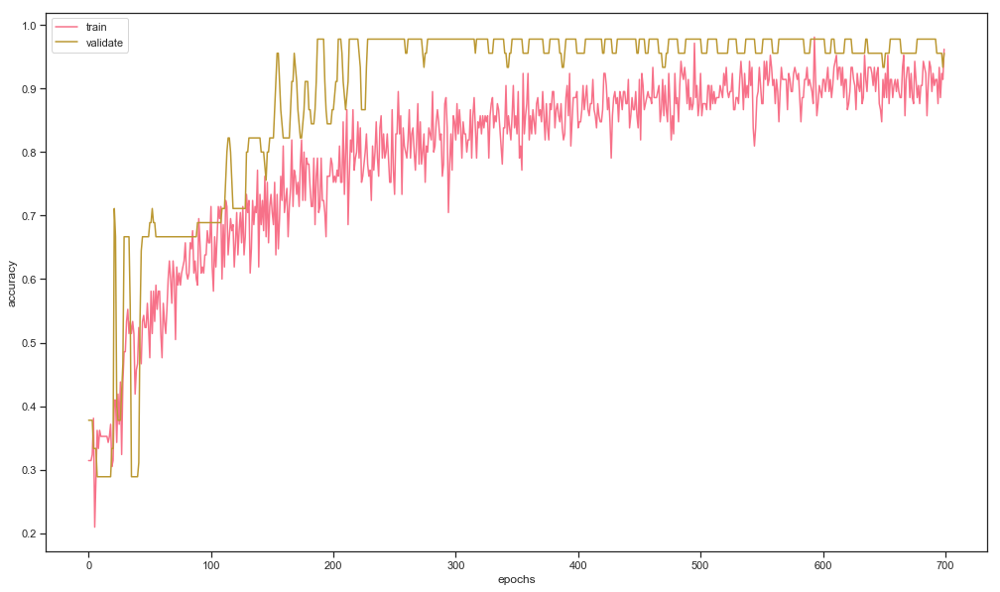

 80%|███████▉  | 102/128 [04:11<01:01,  2.38s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

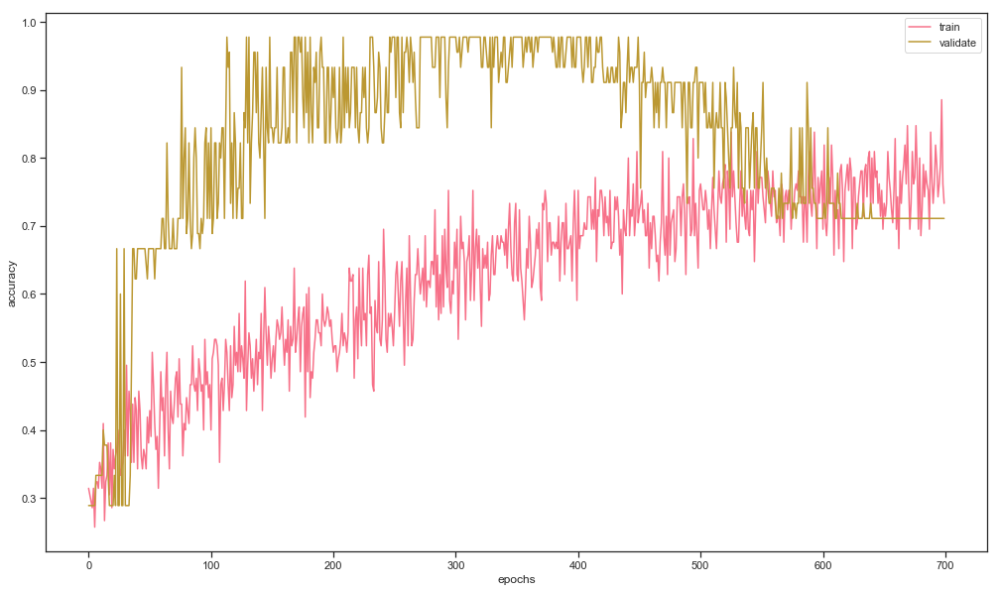

 80%|████████  | 103/128 [04:14<01:02,  2.51s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.9, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 60

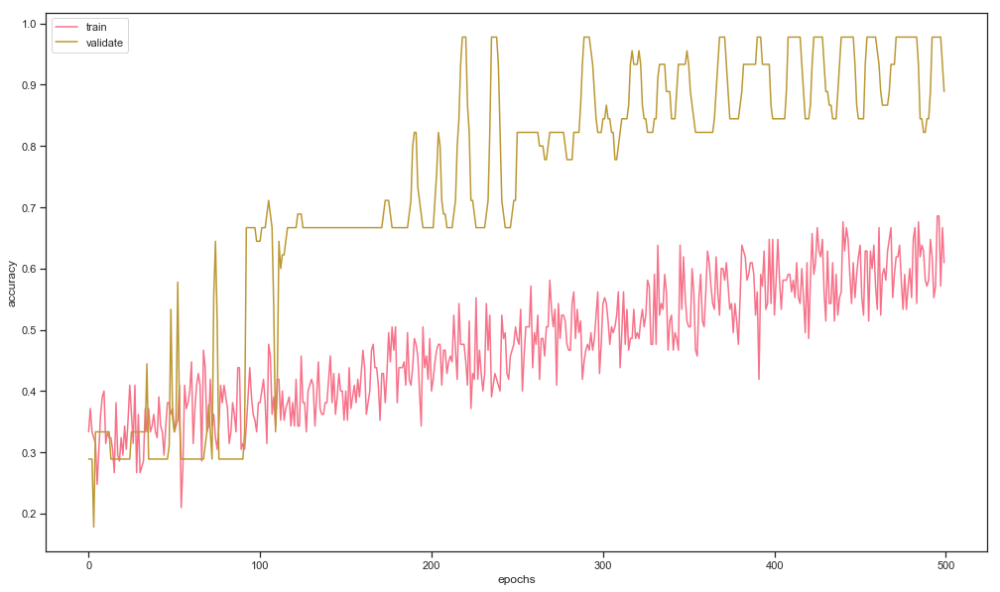

 81%|████████▏ | 104/128 [04:16<00:58,  2.42s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 60

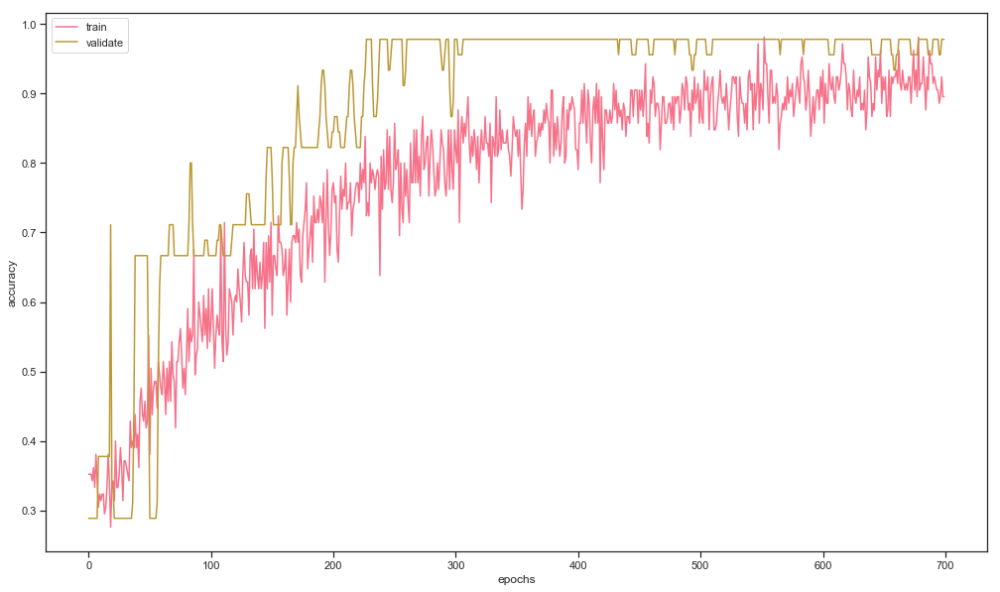

 82%|████████▏ | 105/128 [04:19<00:57,  2.50s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

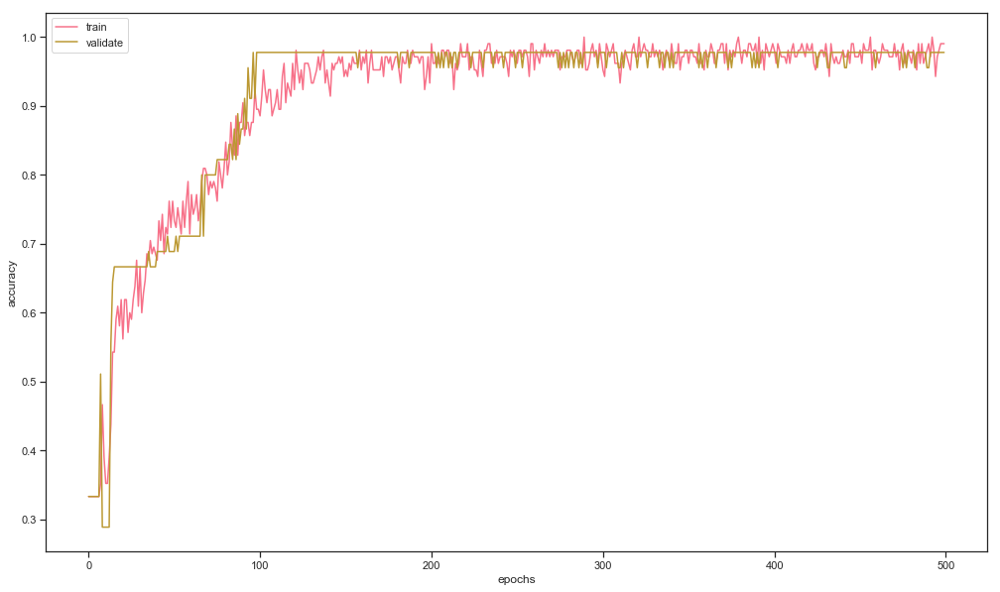

 83%|████████▎ | 106/128 [04:21<00:53,  2.42s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

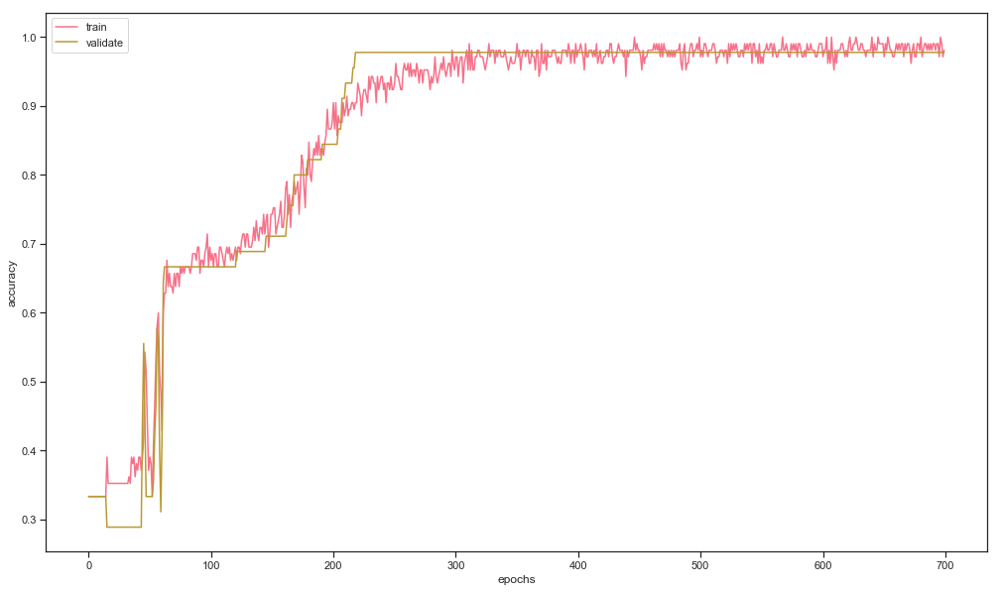

 84%|████████▎ | 107/128 [04:24<00:52,  2.51s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

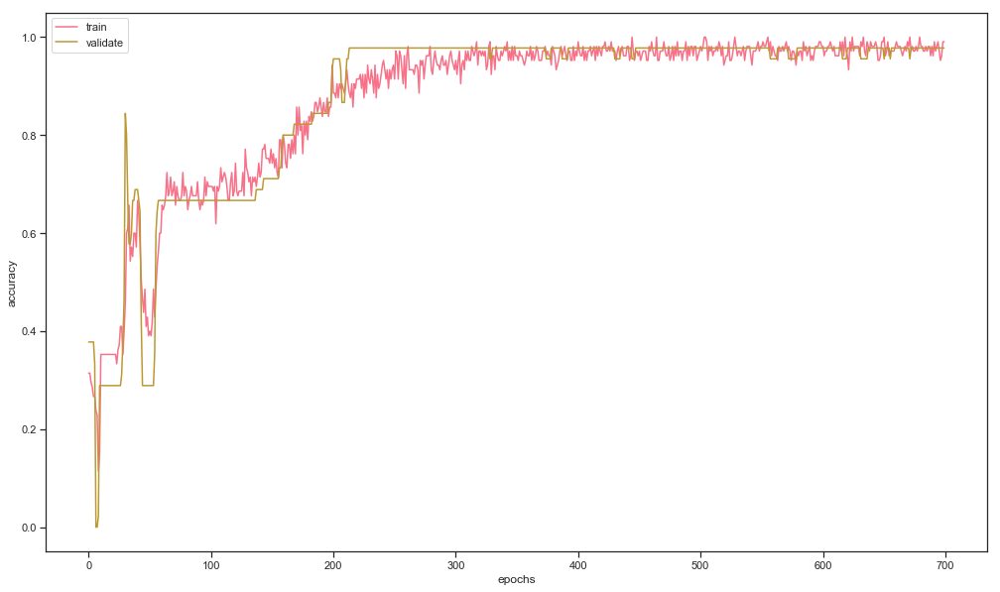

 84%|████████▍ | 108/128 [04:27<00:50,  2.54s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

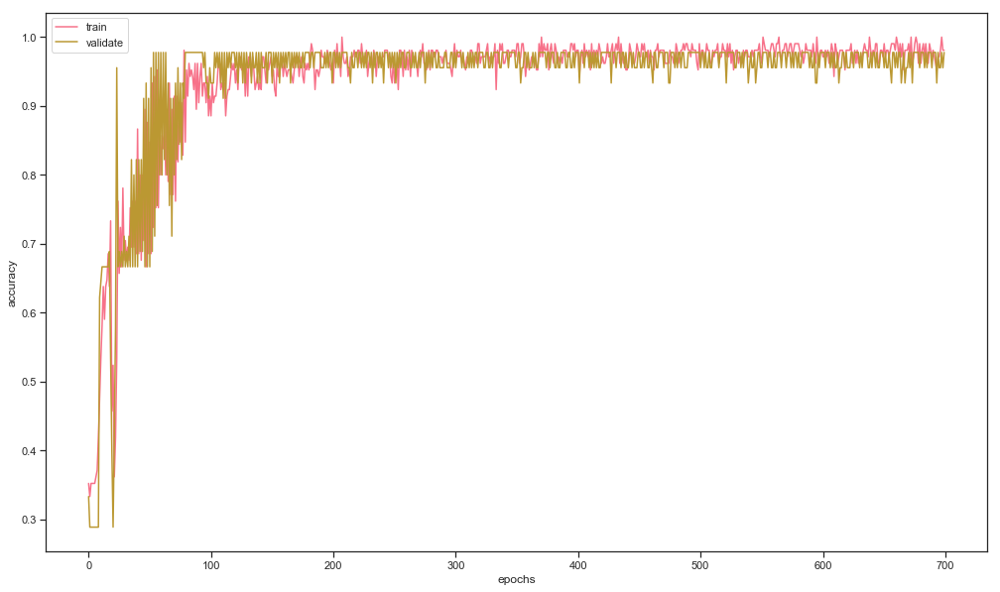

 85%|████████▌ | 109/128 [04:29<00:49,  2.62s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

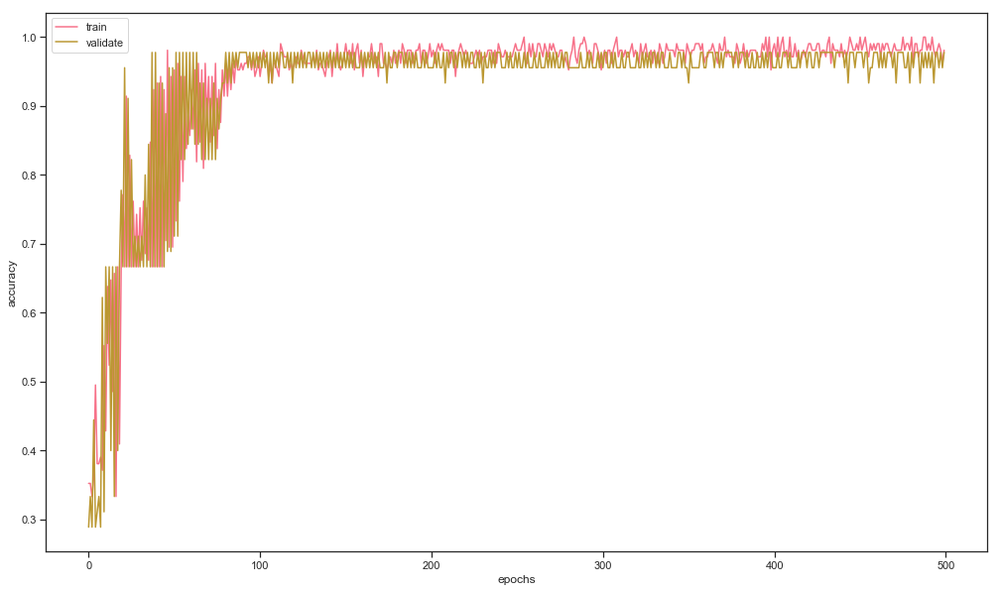

 86%|████████▌ | 110/128 [04:32<00:45,  2.53s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.05, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603

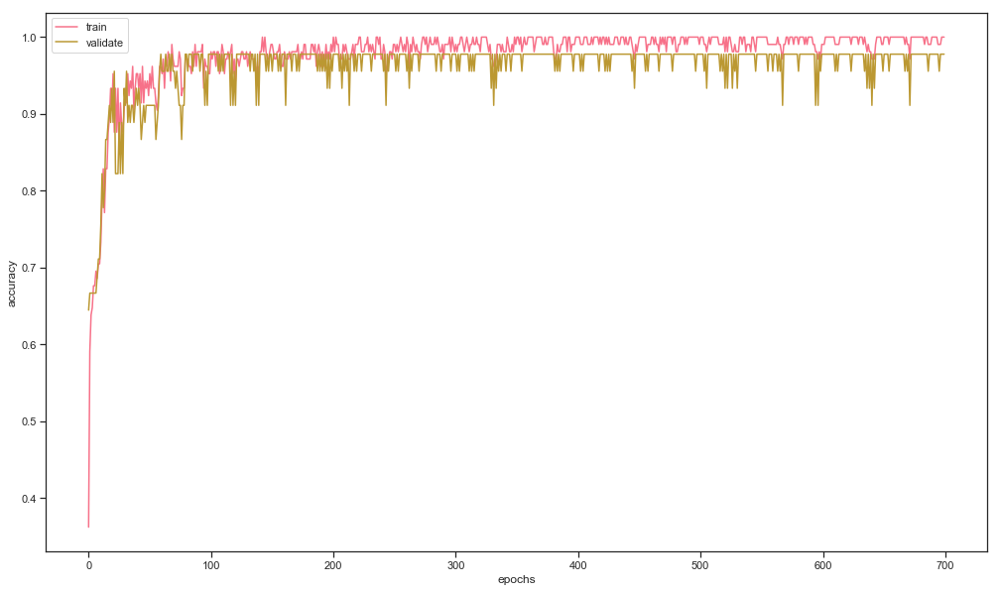

 87%|████████▋ | 111/128 [04:35<00:44,  2.64s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

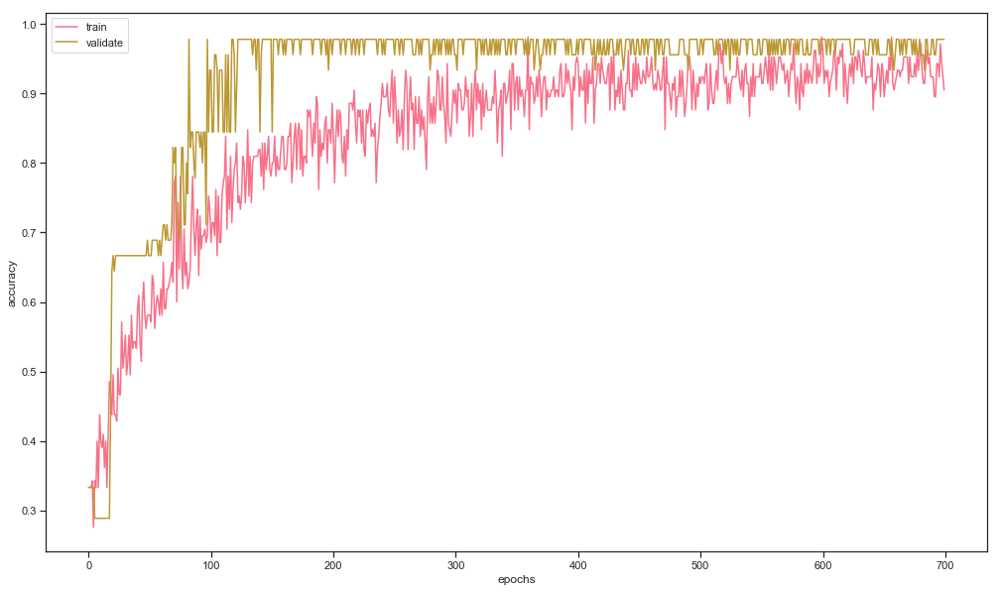

 88%|████████▊ | 112/128 [04:38<00:43,  2.70s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603

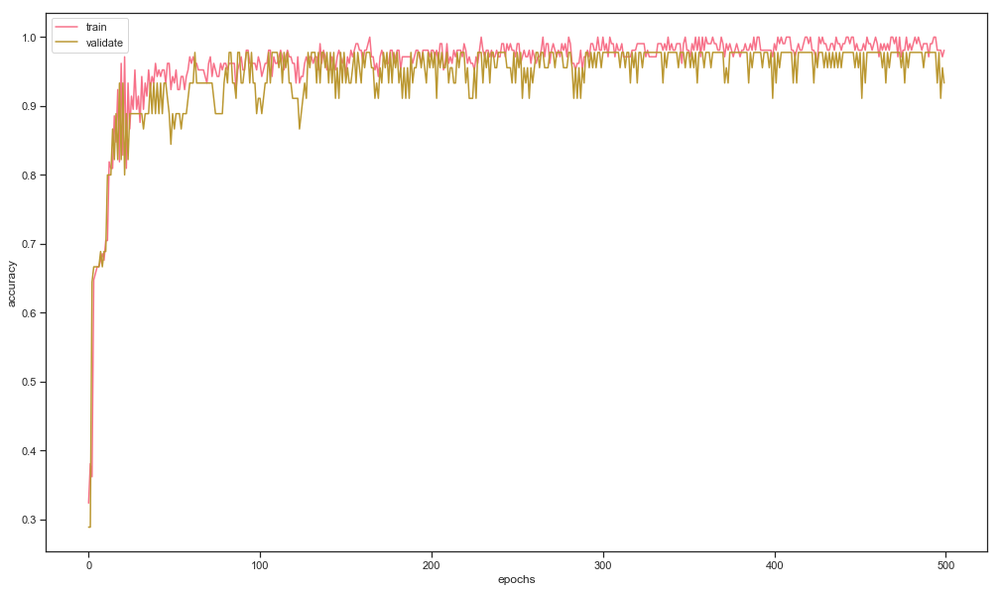

 88%|████████▊ | 113/128 [04:40<00:38,  2.58s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

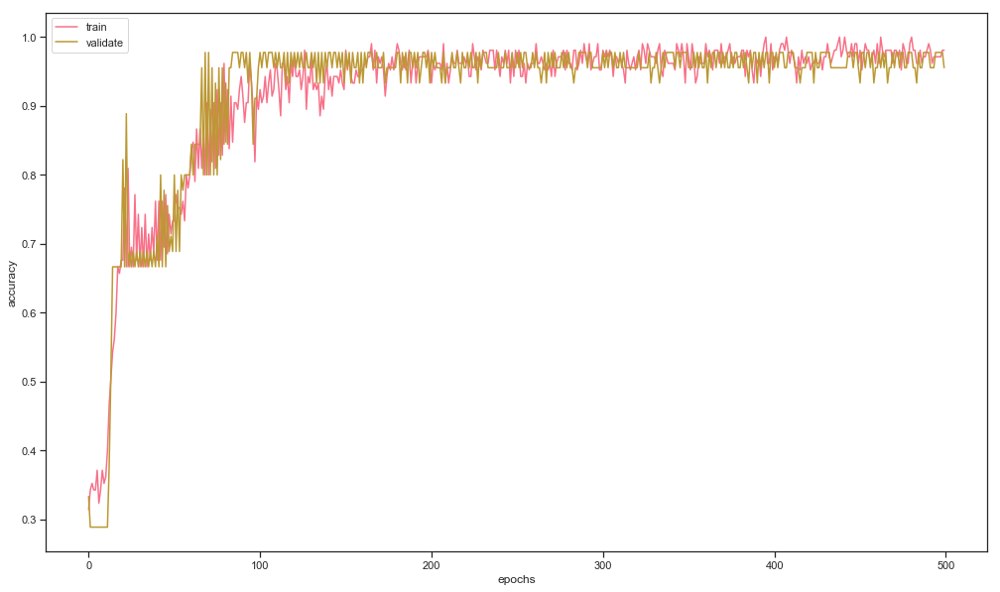

 89%|████████▉ | 114/128 [04:42<00:34,  2.48s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.05, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

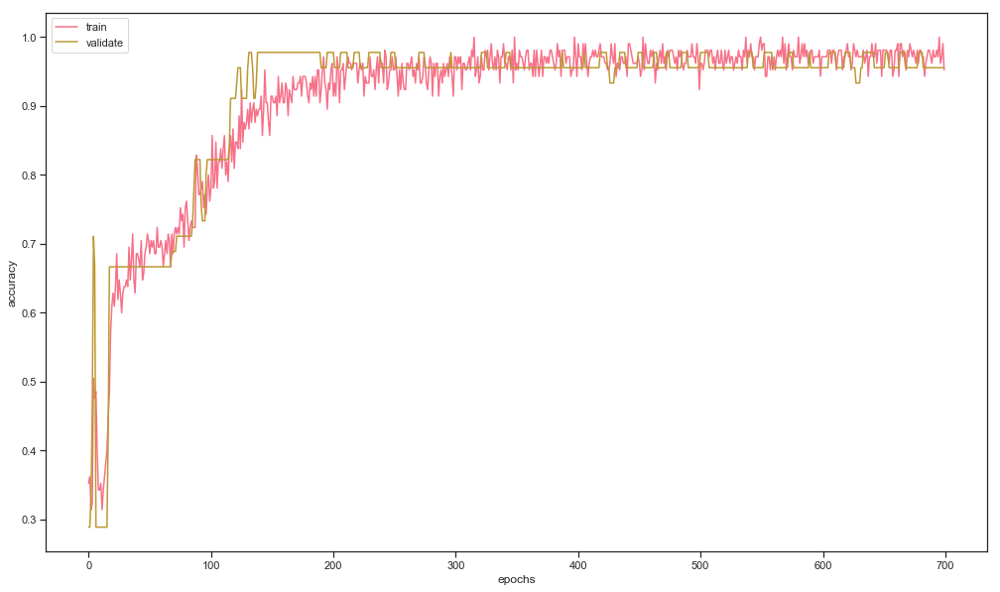

 90%|████████▉ | 115/128 [04:45<00:33,  2.54s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303

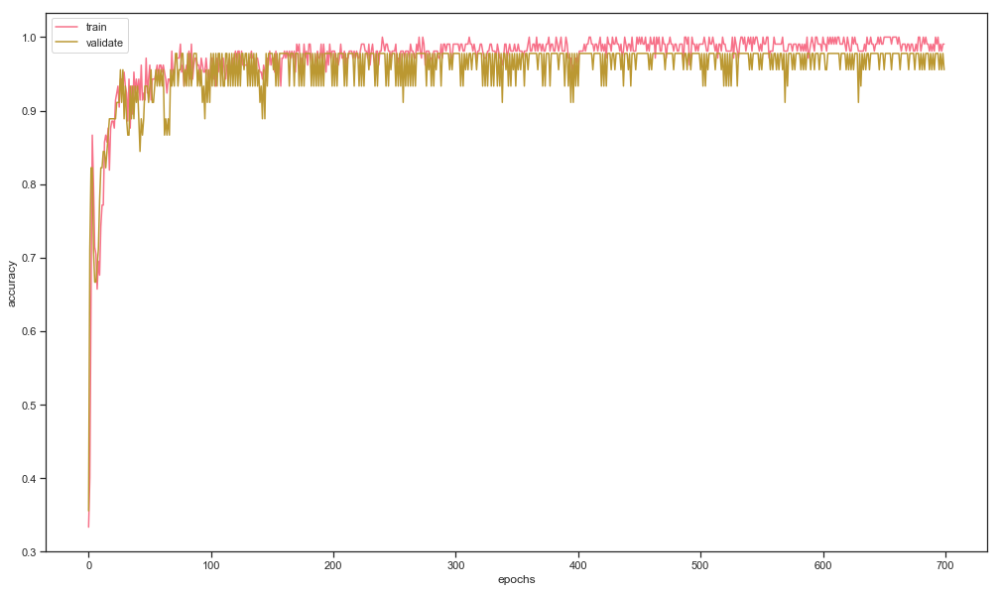

 91%|█████████ | 116/128 [04:48<00:31,  2.62s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.9, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603  

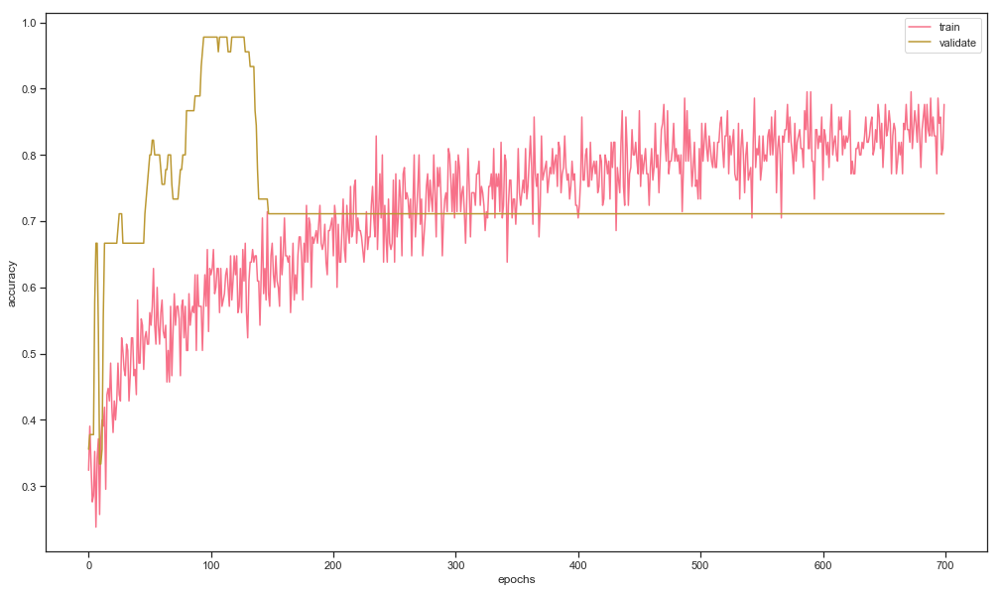

 91%|█████████▏| 117/128 [04:50<00:29,  2.65s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 30

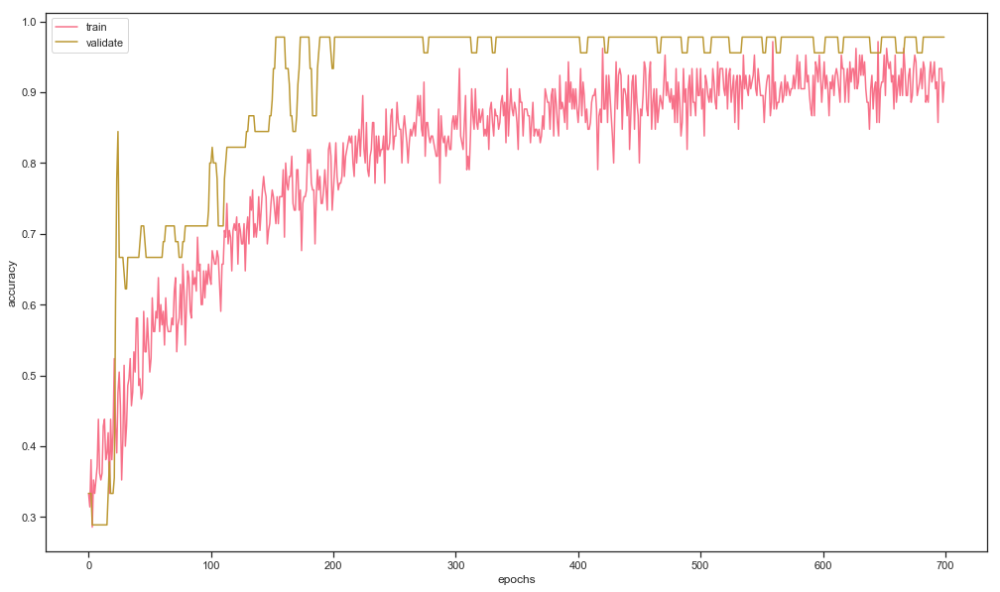

 92%|█████████▏| 118/128 [04:53<00:26,  2.65s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

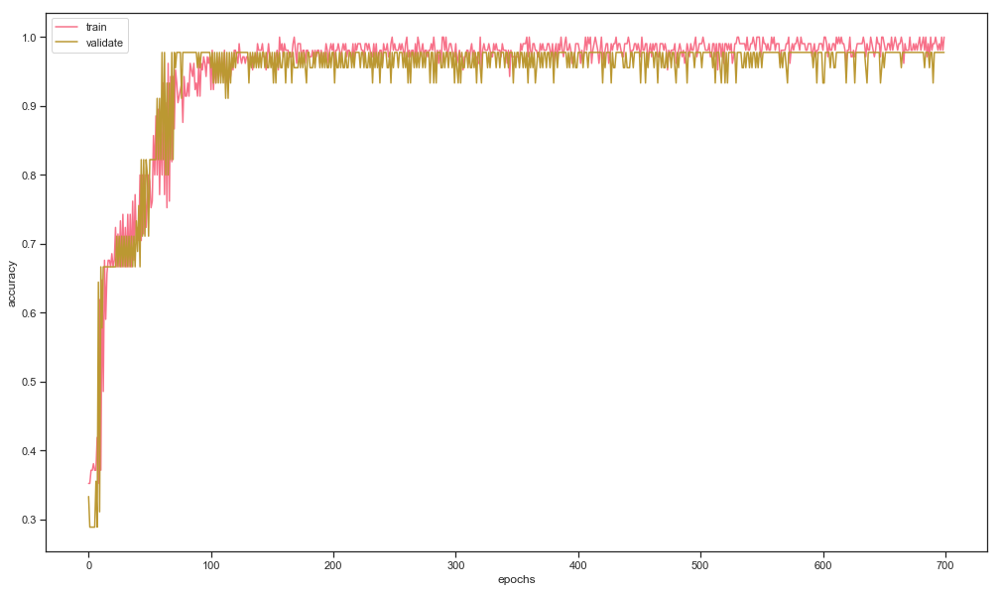

 93%|█████████▎| 119/128 [04:56<00:24,  2.70s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

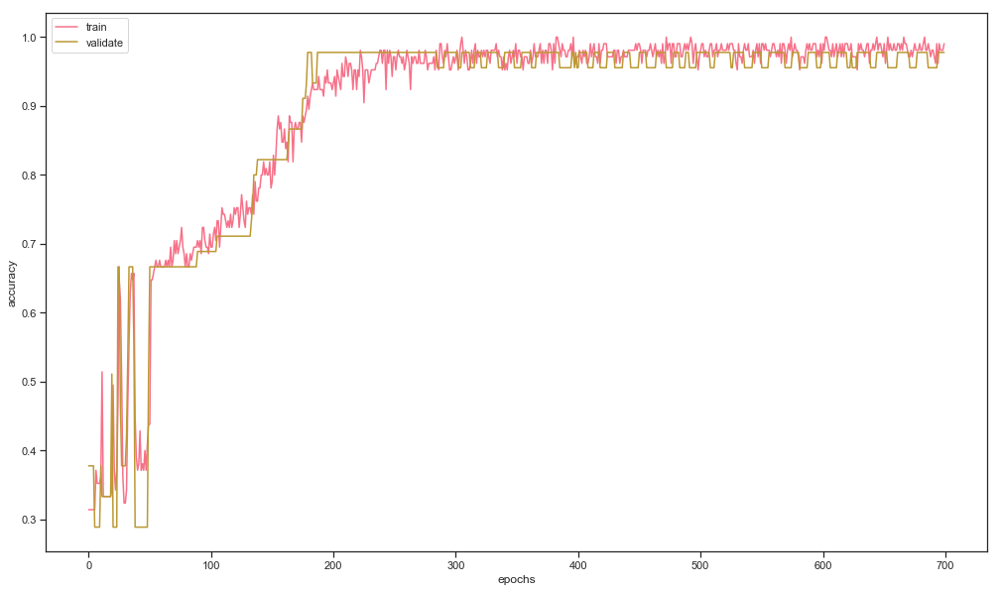

 94%|█████████▍| 120/128 [04:58<00:21,  2.70s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 6

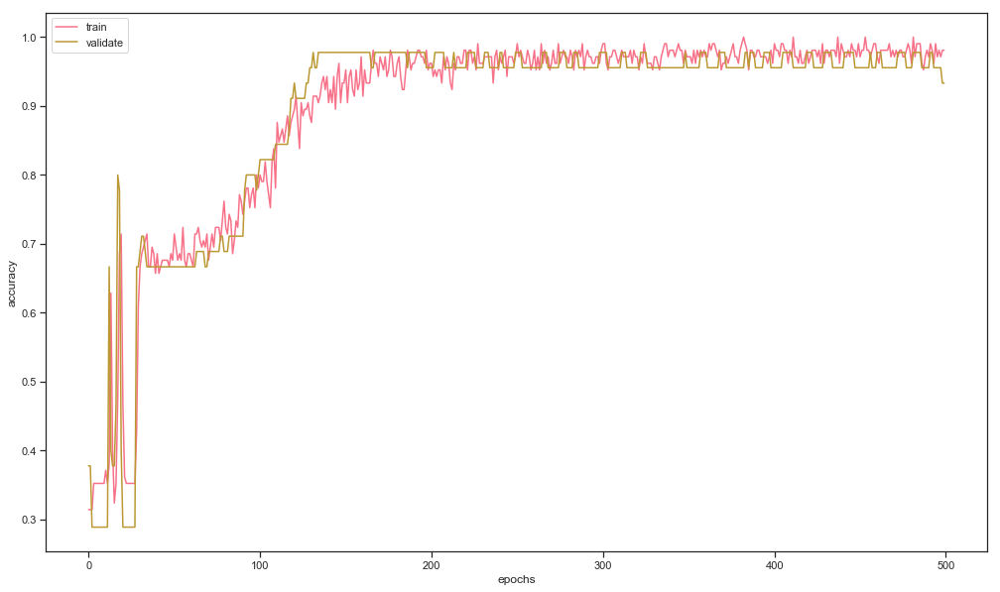

 95%|█████████▍| 121/128 [05:01<00:17,  2.54s/it]

{'batch_size': 256, 'epochs': 500, 'dropout': 0.02, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603

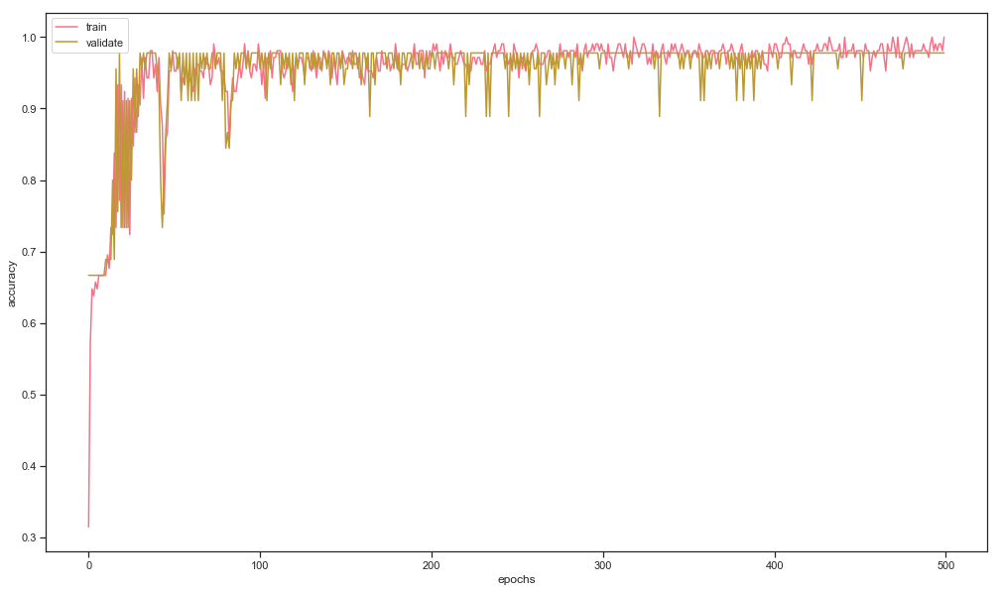

 95%|█████████▌| 122/128 [05:03<00:14,  2.44s/it]

{'batch_size': 128, 'epochs': 700, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603  

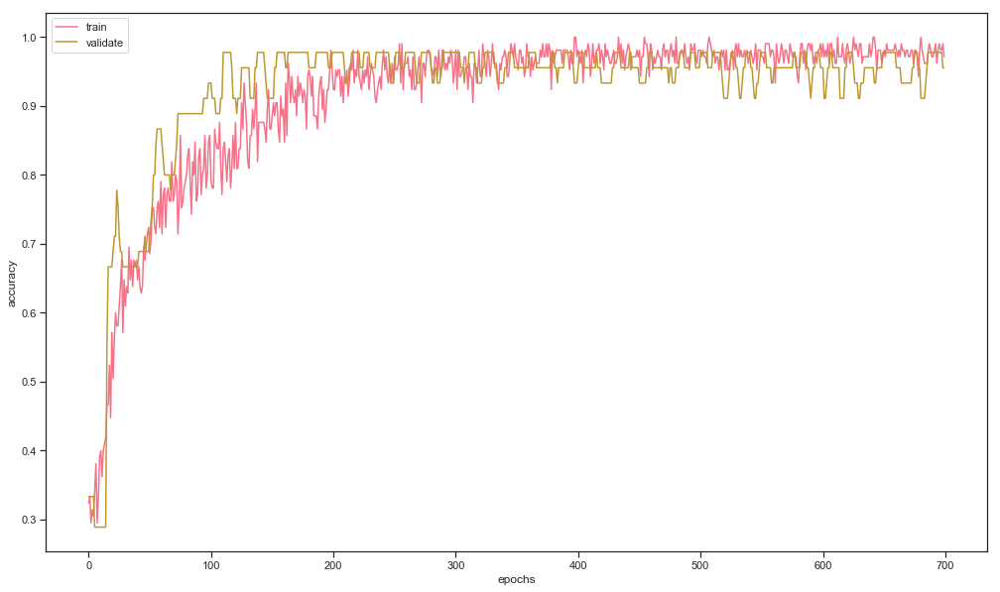

 96%|█████████▌| 123/128 [05:06<00:12,  2.53s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 303 

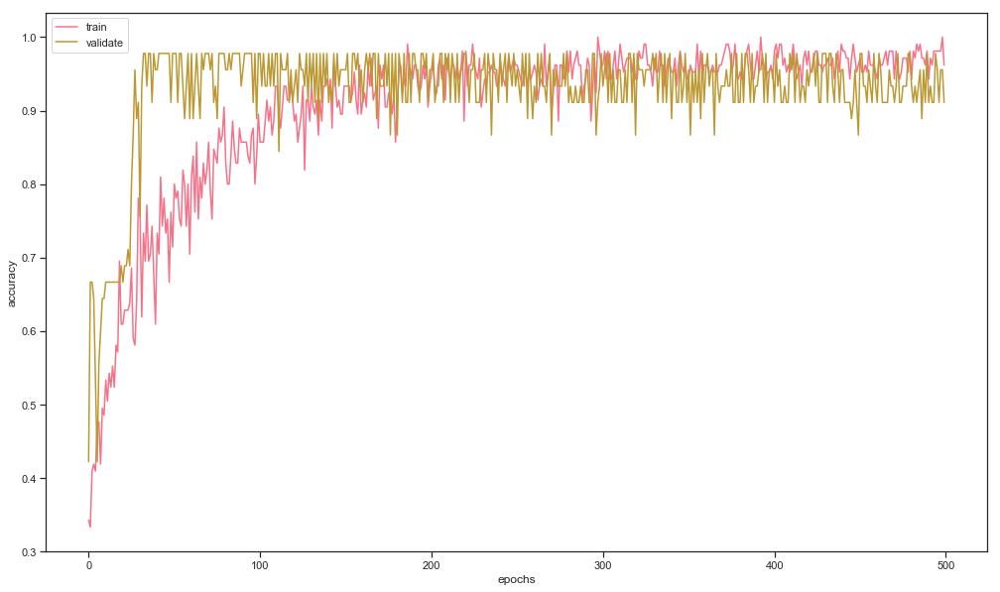

 97%|█████████▋| 124/128 [05:08<00:09,  2.44s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 3

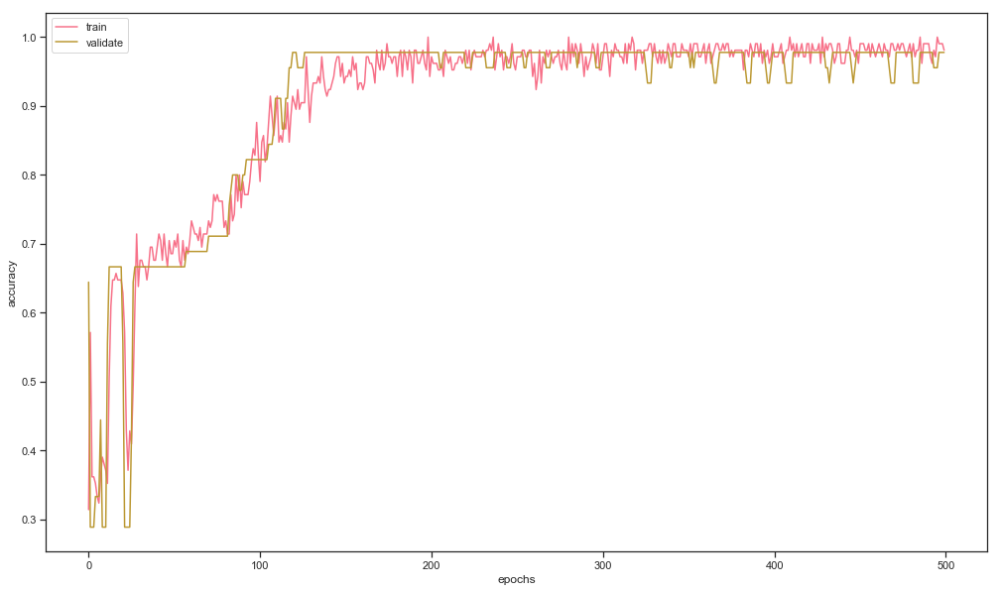

 98%|█████████▊| 125/128 [05:10<00:07,  2.36s/it]

{'batch_size': 256, 'epochs': 700, 'dropout': 0.5, 'activation': 'relu', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 603  

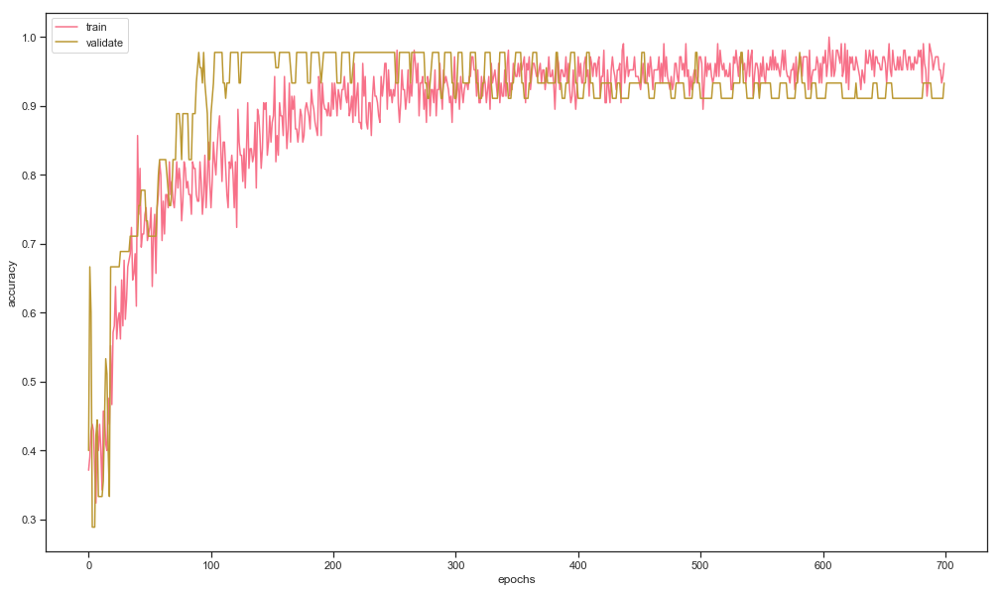

 98%|█████████▊| 126/128 [05:13<00:04,  2.44s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.5, 'activation': 'sigmoid', 'dense_1': 200, 'optimizer': 'adam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               6600      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 60

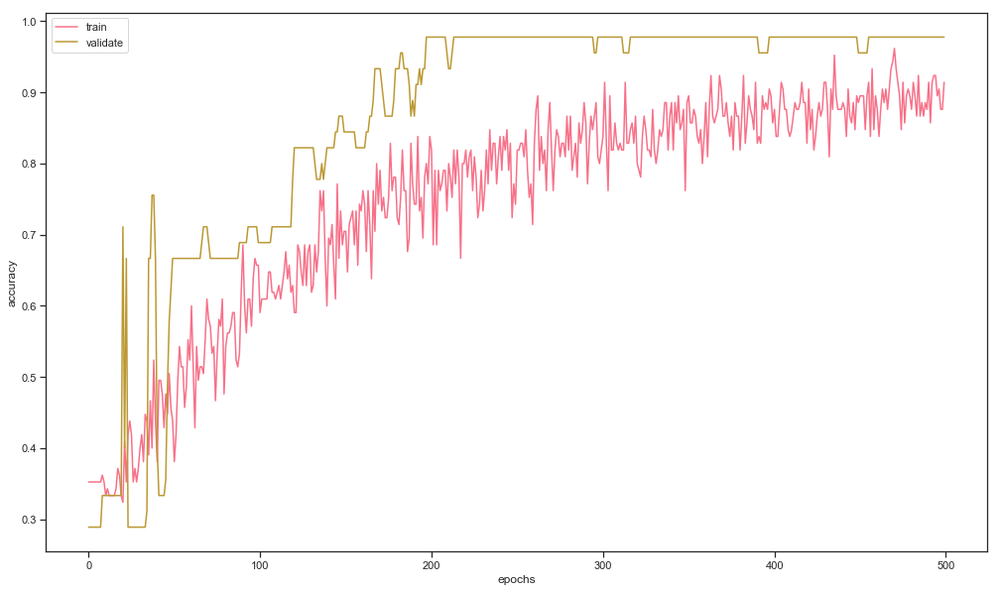

 99%|█████████▉| 127/128 [05:15<00:02,  2.33s/it]

{'batch_size': 128, 'epochs': 500, 'dropout': 0.02, 'activation': 'sigmoid', 'dense_1': 100, 'optimizer': 'nadam', 'losses': 'categorical_crossentropy'}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 2, 32)             128       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 32)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               3300      
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 

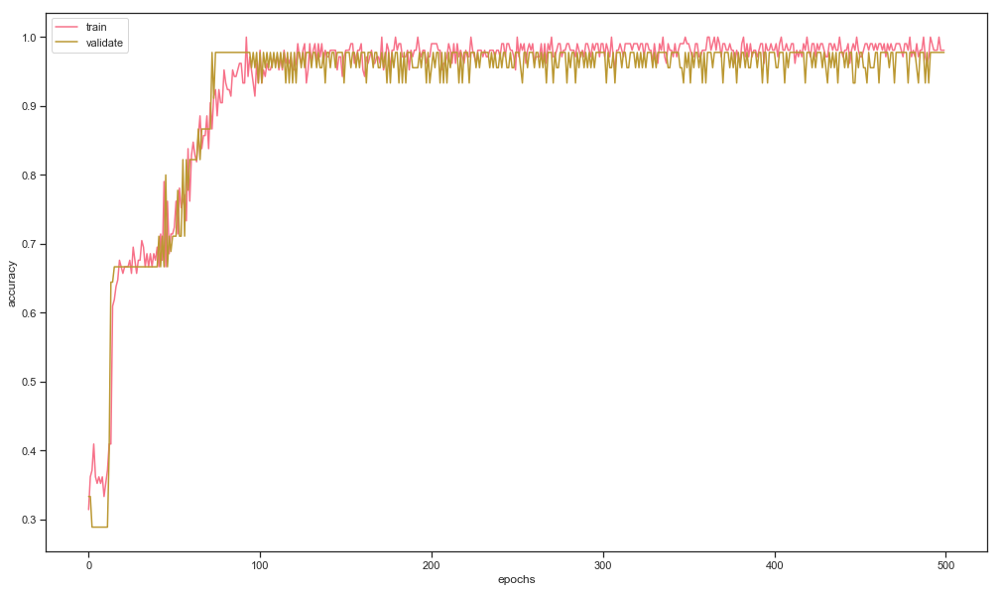

100%|██████████| 128/128 [05:17<00:00,  2.33s/it]

stop: 2019-05-28T170007Z


In [11]:
%%time
parameters = {
    'batch_size': [128, 256],
    'epochs'    : [500, 700],
    'dropout'   : [0.05, 0.02, 0.5, 0.9],
    'activation': ['relu', 'sigmoid'],
    'dense_1'   : [100, 200],
    'optimizer' : ['adam', 'nadam'],
    'losses'    : ['categorical_crossentropy'],
}

def hmodel_convolutional(
    x_train,
    y_train,
    x_test,
    y_test,
    parameters = parameters
    ):
    print(parameters)
    model = Sequential()
    model.add(Conv1D(32, (3), input_shape = (4, 1), activation  = parameters['activation']))
    model.add(MaxPooling1D(pool_size = (2)))
    model.add(Flatten())
    model.add(Dropout(rate = parameters['dropout']))
    model.add(Dense(parameters['dense_1'],          activation  = parameters['activation']))
    model.add(Dense(y_train.shape[1],               activation  = 'softmax'))
    model.compile(
        loss      = parameters['losses'],
        optimizer = parameters['optimizer'],
        metrics   = ['accuracy']
    )
    print(model.summary())
    out = model.fit(
        x_train,
        y_train,
        batch_size      = parameters['batch_size'],
        epochs          = parameters['epochs'],
        verbose         = False,
        validation_data = [x_test, y_test],
        callbacks       = [history]
    )
    score = model.evaluate(x_test, y_test, verbose=False)
    print(datetime.datetime.utcnow().strftime("%Y-%m-%dT%H%M%SZ"))
    print('test loss:', score[0])
    print('test accuracy:', score[1])
    print('max. test accuracy observed:', max(history.val_acc))
    print('max. test accuracy history index:', history.val_acc.index(max(history.val_acc)))
    plt.plot(history.acc, label='train')
    plt.plot(history.val_acc, label='validate')
    plt.legend()
    plt.xlabel('epochs')
    plt.ylabel('accuracy')
    plt.show()
    return out, model

print("start: " + datetime.datetime.utcnow().strftime("%Y-%m-%dT%H%M%SZ"))
h = ta.Scan(
    x               = x,
    y               = y,
    params          = parameters,
    dataset_name    = 'iris',
    experiment_no   = '1',
    model           = hmodel_convolutional,
    grid_downsample = 1
)
print("stop: " + datetime.datetime.utcnow().strftime("%Y-%m-%dT%H%M%SZ"))

# reporting on scan

In [12]:
r = ta.Reporting(h)
r.data.sort_values(by = ['acc'], ascending = False).head()

,round_epochs,val_loss,val_acc,loss,acc,batch_size,epochs,dropout,activation,dense_1,optimizer,losses
0,700,0.097983,0.977778,0.013469,1.0,128,700,0.02,relu,100,adam,categorical_crossentropy
91,500,0.102194,0.977778,0.025008,1.0,256,500,0.05,relu,100,adam,categorical_crossentropy
85,500,0.111264,0.977778,0.019808,1.0,128,500,0.02,relu,200,adam,categorical_crossentropy
80,500,0.091038,0.977778,0.027591,1.0,256,500,0.50,relu,100,nadam,categorical_crossentropy
79,700,0.094773,0.977778,0.040973,1.0,128,700,0.05,sigmoid,200,adam,categorical_crossentropy


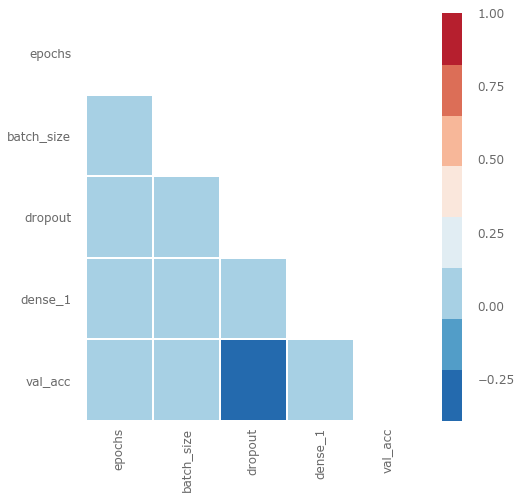

In [13]:
r.plot_corr()

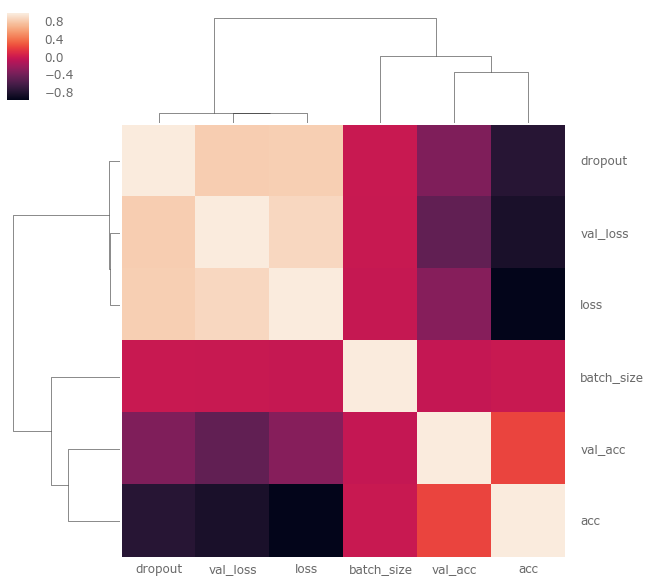

In [14]:
df = r.data[['val_loss', 'val_acc', 'loss', 'acc', 'batch_size', 'dropout']]
plot = sns.clustermap(df.corr())
_ = plt.setp(plot.ax_heatmap.get_yticklabels(), rotation = 0)

In [26]:
x_train.shape

(100, 4, 1)

In [33]:
model = Sequential([
    Dense(100, input_shape = (4, 1),      activation = 'relu'),
    Dense(num_classes,                    activation  = 'softmax')
])

model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = ['accuracy'])
model.summary()

epochs     = 500
batch_size = 128

model.fit(
    x_train,
    y_train,
    batch_size      = batch_size,
    epochs          = epochs,
    verbose         = False,
    validation_data = (x_test, y_test),
    callbacks       = [history]
)

score = model.evaluate(x_test, y_test, verbose = False)


print('test loss:', score[0])
print('test accuracy:', score[1])
plt.plot(range(1, epochs + 1), history.acc)
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.show()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17 (Dense)             (None, 4, 100)            200       
_________________________________________________________________
dense_18 (Dense)             (None, 4, 3)              303       
Total params: 503
Trainable params: 503
Non-trainable params: 0
_________________________________________________________________


ValueError: Error when checking target: expected dense_18 to have 3 dimensions, but got array with shape (100, 3)

In [19]:
x_train

array([[[7.6],
        [3. ],
        [6.6],
        [2.1]],

       [[5.9],
        [3. ],
        [5.1],
        [1.8]],

       [[6.1],
        [2.6],
        [5.6],
        [1.4]],

       [[6.3],
        [3.3],
        [4.7],
        [1.6]],

       [[5. ],
        [2. ],
        [3.5],
        [1. ]],

       [[6.9],
        [3.2],
        [5.7],
        [2.3]],

       [[4.7],
        [3.2],
        [1.6],
        [0.2]],

       [[7.3],
        [2.9],
        [6.3],
        [1.8]],

       [[6.5],
        [2.8],
        [4.6],
        [1.5]],

       [[5.4],
        [3. ],
        [4.5],
        [1.5]],

       [[6.7],
        [2.5],
        [5.8],
        [1.8]],

       [[5.4],
        [3.9],
        [1.3],
        [0.4]],

       [[6. ],
        [2.7],
        [5.1],
        [1.6]],

       [[5.4],
        [3.4],
        [1.7],
        [0.2]],

       [[7.2],
        [3.2],
        [6. ],
        [1.8]],

       [[5.3],
        [3.7],
        [1.5],
        [0.2]],

       [